# **Deep Learning and Econometric Models for Volatility Forecasting**                                                                
# *(ARCH/GARCH, LSTM, HYBRID, Transformer)*

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.graphics.gofplots import qqplot
from statsmodels.tsa.stattools import adfuller
from tqdm import tqdm_notebook
from itertools import product
from typing import Union

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [ ]:
import yfinance as yf
tickers = ["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]
data1 = yf.download(tickers, start="2002-01-01", end="2025-11-30", auto_adjust=True)
data1.to_csv("core_market_dataset1.csv")


[*********************100%***********************]  6 of 6 completed


In [ ]:
data1

Price            Close                                                 \
Ticker            AAPL       EBAY         MCD        MSFT        NVDA   
Date                                                                    
2002-01-02    0.349395   6.196217   14.278654   20.475889    0.514191   
2002-01-03    0.353594   6.367579   14.440358   21.144779    0.547885   
2002-01-04    0.355244   6.414400   14.548161   21.043991    0.531917   
2002-01-07    0.343398   6.255212   14.661356   20.940132    0.517629   
2002-01-08    0.339049   6.324504   14.747603   21.190594    0.523742   
...                ...        ...         ...         ...         ...   
2025-11-21  271.489990  80.555794  307.504730  472.119995  178.870041   
2025-11-24  275.920013  80.605621  303.081268  474.000000  182.539841   
2025-11-25  276.970001  82.498947  308.598175  476.989990  177.810104   
2025-11-26  277.549988  82.199997  310.536530  485.500000  180.249954   
2025-11-28  278.850006  82.790001  309.959991  492.010010  176.990143   

Price                        High                                     ...  \
Ticker           SBUX        AAPL       EBAY         MCD        MSFT  ...   
Date                                                                  ...   
2002-01-02   3.642587    0.349395   6.202771   14.359507   20.497269  ...   
2002-01-03   3.812487    0.356143   6.392862   14.531991   21.150887  ...   
2002-01-04   4.128015    0.359143   6.508040   14.580501   21.352474  ...   
2002-01-07   4.077606    0.359892   6.479014   14.806891   21.386057  ...   
2002-01-08   4.236305    0.345647   6.325441   14.812285   21.337200  ...   
...               ...         ...        ...         ...         ...  ...   
2025-11-21  85.349998  273.329987  81.352984  308.687634  478.920013  ...   
2025-11-24  83.339996  277.000000  81.512426  308.488821  476.899994  ...   
2025-11-25  85.910004  280.380005  82.817822  309.602130  479.149994  ...   
2025-11-26  86.699997  279.529999  83.216415  311.003727  488.309998  ...   
2025-11-28  87.110001  279.000000  83.220001  311.431144  492.630005  ...   

Price             Open                                        Volume  \
Ticker             MCD        MSFT        NVDA       SBUX       AAPL   
Date                                                                   
2002-01-02   14.267873   20.356772    0.513351   3.567906  529496800   
2002-01-03   14.294822   20.497271    0.515261   3.657523  612007200   
2002-01-04   14.542770   21.150890    0.555143   4.053333  409976000   
2002-01-07   14.553551   21.303592    0.534056   4.122415  444584000   
2002-01-08   14.742213   20.979850    0.516560   4.085075  450038400   
...                ...         ...         ...        ...        ...   
2025-11-21  304.443085  478.500000  181.229910  82.519997   59030800   
2025-11-24  307.146868  475.000000  179.480013  85.260002   65585800   
2025-11-25  304.920233  474.070007  174.900263  82.830002   46914200   
2025-11-26  309.711494  486.309998  181.619888  85.500000   33431400   
2025-11-28  310.506699  487.600006  179.000025  87.029999   20135600   

Price                                                          
Ticker          EBAY      MCD      MSFT        NVDA      SBUX  
Date                                                           
2002-01-02  59122483  3855800  48124000  1298904000  11298400  
2002-01-03  50394960  4813300  67590800  1414752000  25148400  
2002-01-04  44531942  4883600  52731400   936288000  62756400  
2002-01-07  42132182  3683800  58508800   973068000  23204000  
2002-01-08  52871702  3326000  47736400   774360000  21871600  
...              ...      ...       ...         ...       ...  
2025-11-21   4441500  3348900  31769200   346926200  10227700  
2025-11-24   5959900  3687300  34421000   256618300  10805800  
2025-11-25   3693600  4189600  28019800   320600300   9265300  
2025-11-26   3016200  2786600  25709100   183852000   7602600  
2025-11-28   2035300  1850700  14386700   121332800   367

In [ ]:
data1.tail()

Price            Close                                                 \
Ticker            AAPL       EBAY         MCD        MSFT        NVDA   
Date                                                                    
2025-11-21  271.489990  80.555794  307.504730  472.119995  178.870041   
2025-11-24  275.920013  80.605621  303.081268  474.000000  182.539841   
2025-11-25  276.970001  82.498947  308.598175  476.989990  177.810104   
2025-11-26  277.549988  82.199997  310.536530  485.500000  180.249954   
2025-11-28  278.850006  82.790001  309.959991  492.010010  176.990143   

Price                        High                                     ...  \
Ticker           SBUX        AAPL       EBAY         MCD        MSFT  ...   
Date                                                                  ...   
2025-11-21  85.349998  273.329987  81.352984  308.687634  478.920013  ...   
2025-11-24  83.339996  277.000000  81.512426  308.488821  476.899994  ...   
2025-11-25  85.910004  280.380005  82.817822  309.602130  479.149994  ...   
2025-11-26  86.699997  279.529999  83.216415  311.003727  488.309998  ...   
2025-11-28  87.110001  279.000000  83.220001  311.431144  492.630005  ...   

Price             Open                                       Volume           \
Ticker             MCD        MSFT        NVDA       SBUX      AAPL     EBAY   
Date                                                                           
2025-11-21  304.443085  478.500000  181.229910  82.519997  59030800  4441500   
2025-11-24  307.146868  475.000000  179.480013  85.260002  65585800  5959900   
2025-11-25  304.920233  474.070007  174.900263  82.830002  46914200  3693600   
2025-11-26  309.711494  486.309998  181.619888  85.500000  33431400  3016200   
2025-11-28  310.506699  487.600006  179.000025  87.029999  20135600  2035300   

Price                                               
Ticker          MCD      MSFT       NVDA      SBUX  
Date                                                
2025-11-21  3348900  31769200  346926200  10227700  
2025-11-24  3687300  34421000  256618300  10805800  
2025-11-25  4189600  28019800  320600300   9265300  
2025-11-26  2786600  25709100  183852000   7602600  
2025-11-28  1850700  14386700  121332800   3677600  

[5 rows x 30 columns]

In [ ]:
print(data1.columns)


MultiIndex([( 'Close', 'AAPL'),
            ( 'Close', 'EBAY'),
            ( 'Close',  'MCD'),
            ( 'Close', 'MSFT'),
            ( 'Close', 'NVDA'),
            ( 'Close', 'SBUX'),
            (  'High', 'AAPL'),
            (  'High', 'EBAY'),
            (  'High',  'MCD'),
            (  'High', 'MSFT'),
            (  'High', 'NVDA'),
            (  'High', 'SBUX'),
            (   'Low', 'AAPL'),
            (   'Low', 'EBAY'),
            (   'Low',  'MCD'),
            (   'Low', 'MSFT'),
            (   'Low', 'NVDA'),
            (   'Low', 'SBUX'),
            (  'Open', 'AAPL'),
            (  'Open', 'EBAY'),
            (  'Open',  'MCD'),
            (  'Open', 'MSFT'),
            (  'Open', 'NVDA'),
            (  'Open', 'SBUX'),
            ('Volume', 'AAPL'),
            ('Volume', 'EBAY'),
            ('Volume',  'MCD'),
            ('Volume', 'MSFT'),
            ('Volume', 'NVDA'),
            ('Volume', 'SBUX')],
           names=['Price', 'Ticker'])


In [ ]:
prices = data1['Close'].copy()
prices


Ticker,AAPL,EBAY,MCD,MSFT,NVDA,SBUX
Date,,,,,,
2002-01-02,0.349395,6.196217,14.278654,20.475889,0.514191,3.642587
2002-01-03,0.353594,6.367579,14.440358,21.144779,0.547885,3.812487
2002-01-04,0.355244,6.414400,14.548161,21.043991,0.531917,4.128015
2002-01-07,0.343398,6.255212,14.661356,20.940132,0.517629,4.077606
2002-01-08,0.339049,6.324504,14.747603,21.190594,0.523742,4.236305
...,...,...,...,...,...,...
2025-11-21,271.489990,80.555794,307.504730,472.119995,178.870041,85.349998
2025-11-24,275.920013,80.605621,303.081268,474.000000,182.539841,83.339996
2025-11-25,276.970001,82.498947,308.598175,476.989990,177.810104,85.910004


In [ ]:
prices.describe()


Ticker,AAPL,EBAY,MCD,MSFT,NVDA,SBUX
count,6017.000000,6017.000000,6017.000000,6017.000000,6017.000000,6017.000000
mean,51.543891,25.941941,105.577121,104.329720,14.593285,39.176666
std,69.637332,18.689384,89.967705,132.256638,36.100387,33.009764
min,0.196741,3.846768,6.766111,11.138551,0.056309,2.677330
25%,3.588429,11.675142,33.270859,19.069784,0.295699,9.698304
50%,18.123585,20.046640,70.482338,30.499250,0.504623,29.163984
75%,62.743649,35.616314,171.178787,141.994965,6.308228,69.035522
max,278.850006,100.101936,315.779602,541.057373,207.028473,113.565308


# ***ARCH/GARCH MODELS:::***

# **ARCH**

In [ ]:
!pip install arch

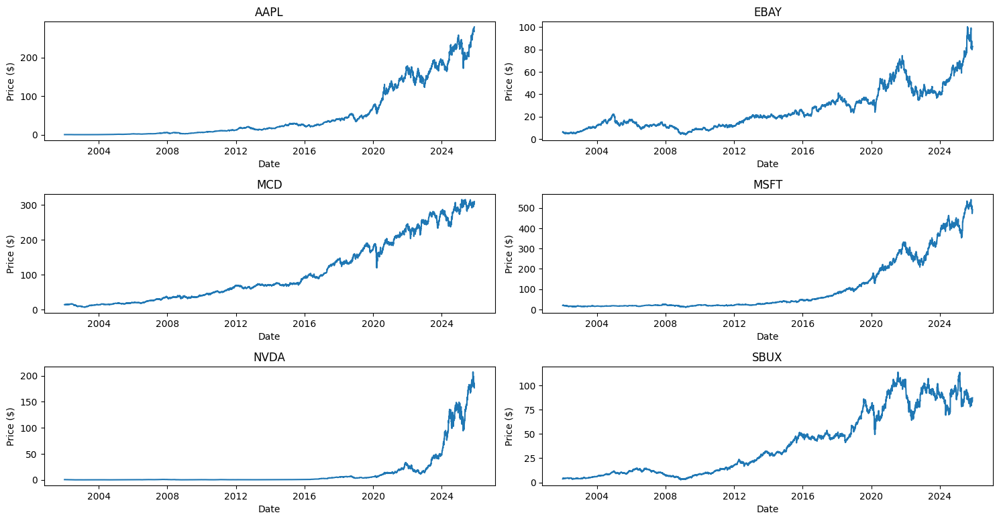

In [ ]:
# Import libraries
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
from arch import arch_model
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.diagnostic import acorr_ljungbox
import numpy as np

import warnings
warnings.filterwarnings("ignore")

prices = data1['Close']

# Plot each stock
plt.figure(figsize=(15,10))
for i, t in enumerate(prices.columns, 1):
    plt.subplot(4, 2, i)
    plt.plot(prices.index, prices[t], label=t)
    plt.title(t)
    plt.xlabel("Date")
    plt.ylabel("Price ($)")
    plt.tight_layout()

plt.show()


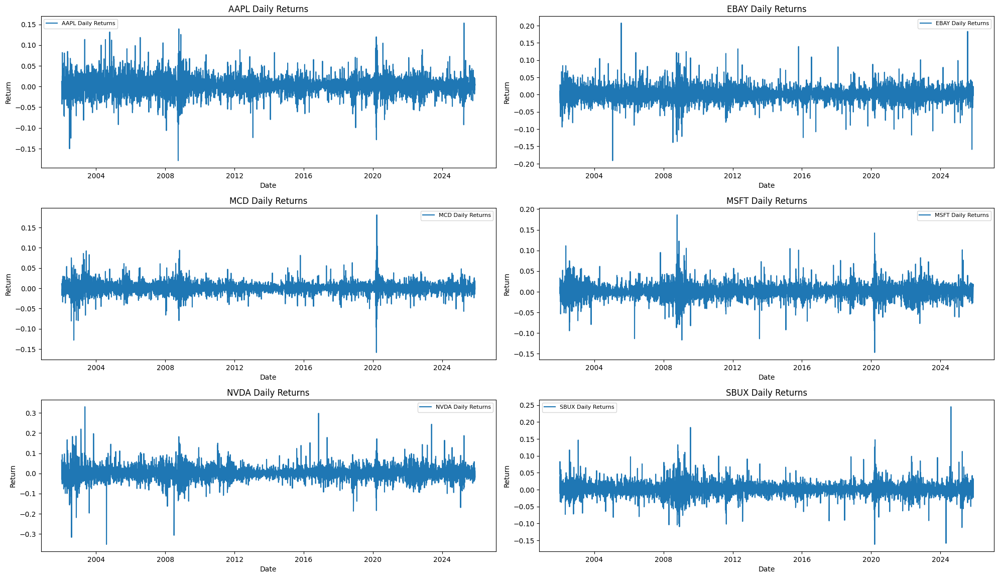

In [ ]:
# Compute daily returns for all tickers
returns = prices.pct_change().dropna()

# Plot each stock's returns
plt.figure(figsize=(20,15))
for i, t in enumerate(returns.columns, 1):
    plt.subplot(4, 2, i)
    plt.plot(returns.index, returns[t], label=f'{t} Daily Returns')
    plt.title(f'{t} Daily Returns')
    plt.xlabel('Date')
    plt.ylabel('Return')
    plt.legend(fontsize=8)
    plt.tight_layout()

plt.show()


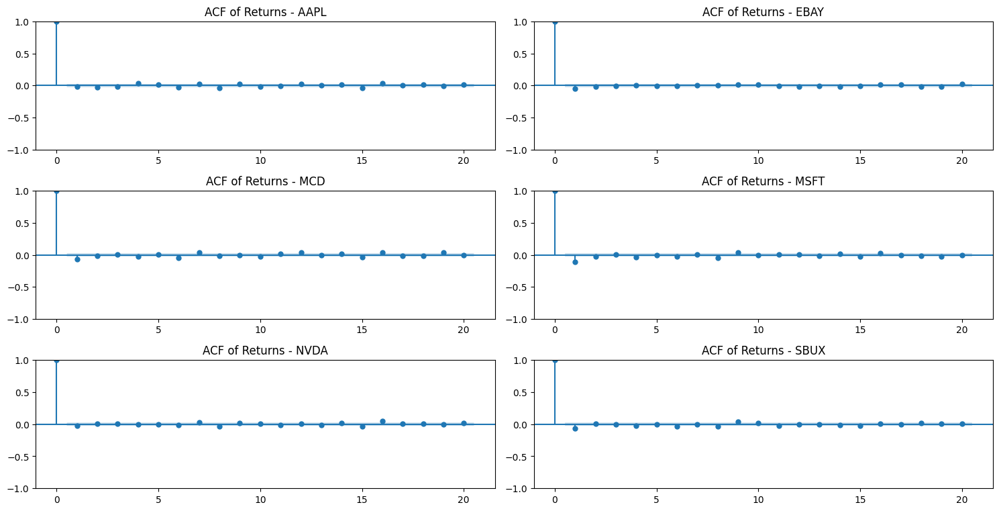

In [ ]:
plt.figure(figsize=(15,10))
for i, t in enumerate(returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_acf(returns[t], lags=20, ax=ax)
    plt.title(f'ACF of Returns - {t}')

plt.tight_layout()
plt.show()




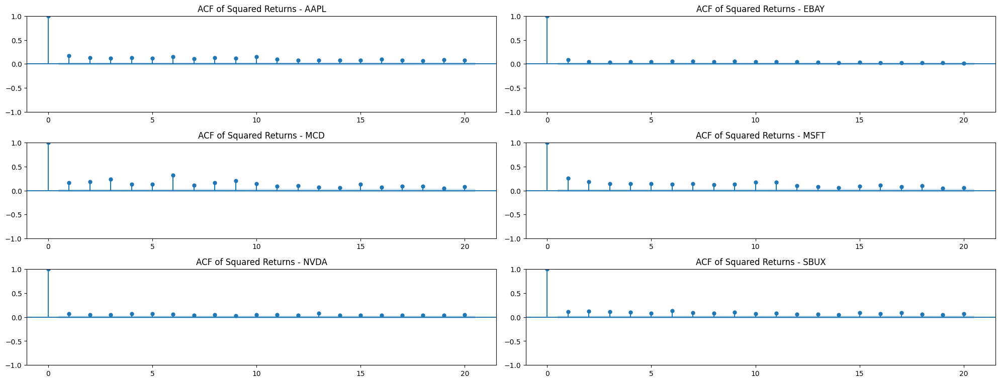

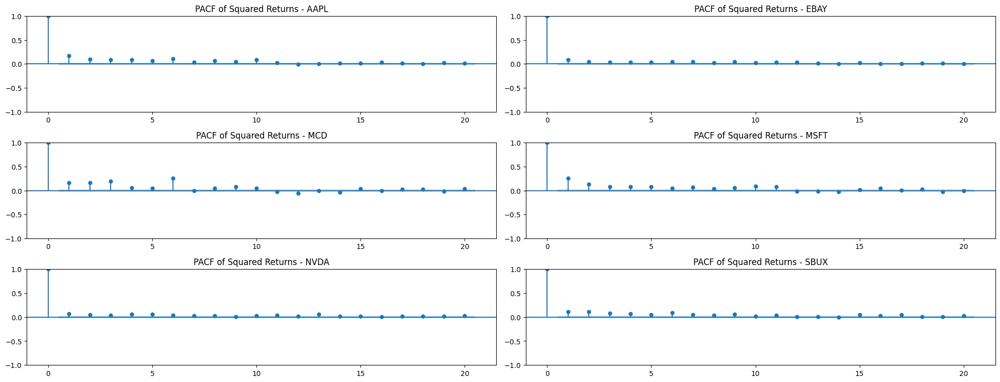

In [ ]:
# ACF of squared returns (for each stock)
squared_returns = returns ** 2

plt.figure(figsize=(20,10))
for i, t in enumerate(squared_returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_acf(squared_returns[t], lags=20, ax=ax)
    plt.title(f'ACF of Squared Returns - {t}')

plt.tight_layout()
plt.show()

# PACF of squared returns (for each stock)
plt.figure(figsize=(20,10))
for i, t in enumerate(squared_returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_pacf(squared_returns[t], lags=20, ax=ax, method='ywm')
    plt.title(f'PACF of Squared Returns - {t}')

plt.tight_layout()
plt.show()


In [ ]:
best_orders = {}  # store best p for each stock

for t in returns.columns:
    print(f"\n===== Testing ARCH order for {t} =====")
    best_aic = np.inf
    best_p = None

    for p in range(1, 30):
        model = arch_model(returns[t] * 100, vol='ARCH', p=p)
        result = model.fit(disp='off')

        print(f"ARCH({p}) AIC: {result.aic:.4f}")

        if result.aic < best_aic:
            best_aic = result.aic
            best_p = p

    best_orders[t] = best_p
    print(f"Selected ARCH order for {t}: {best_p}  (lowest AIC = {best_aic:.4f})")



===== Testing ARCH order for AAPL =====
ARCH(1) AIC: 25721.4939
ARCH(2) AIC: 25521.6457
ARCH(3) AIC: 25408.0274
ARCH(4) AIC: 25341.0616
ARCH(5) AIC: 25204.9744
ARCH(6) AIC: 25148.7652
ARCH(7) AIC: 25116.7112
ARCH(8) AIC: 25069.2601
ARCH(9) AIC: 25065.3003
ARCH(10) AIC: 25061.2293
ARCH(11) AIC: 25056.3735
ARCH(12) AIC: 25054.4621
ARCH(13) AIC: 25040.0643
ARCH(14) AIC: 25031.1113
ARCH(15) AIC: 25019.7574
ARCH(16) AIC: 25011.2359
ARCH(17) AIC: 25012.0366
ARCH(18) AIC: 24976.5173
ARCH(19) AIC: 24978.0177
ARCH(20) AIC: 24973.2668
ARCH(21) AIC: 24975.2668
ARCH(22) AIC: 24976.2993
ARCH(23) AIC: 24974.1639
ARCH(24) AIC: 24974.4634
ARCH(25) AIC: 24974.8836
ARCH(26) AIC: 24970.3173
ARCH(27) AIC: 24948.4636
ARCH(28) AIC: 24945.5699
ARCH(29) AIC: 24935.1119
Selected ARCH order for AAPL: 29  (lowest AIC = 24935.1119)

===== Testing ARCH order for EBAY =====
ARCH(1) AIC: 26006.6034
ARCH(2) AIC: 25972.0900
ARCH(3) AIC: 25957.8187
ARCH(4) AIC: 25927.7422
ARCH(5) AIC: 25919.6520
ARCH(6) AIC: 25907.233

In [ ]:
arch_results = {}
std_resid_all = {}
squared_resid_all = {}

for t in returns.columns:
    p = best_orders[t]
    print(f"\n===== Fitting ARCH({p}) for {t} =====")

    model = arch_model(returns[t] * 100, vol='ARCH', p=p)
    res = model.fit(disp='off')

    arch_results[t] = res

    std_resid = res.resid / res.conditional_volatility
    squared_resid = std_resid ** 2

    std_resid_all[t] = std_resid
    squared_resid_all[t] = squared_resid

    print(res.summary())



===== Fitting ARCH(29) for AAPL =====
                      Constant Mean - ARCH Model Results                      
Dep. Variable:                   AAPL   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                       ARCH   Log-Likelihood:               -12436.6
Distribution:                  Normal   AIC:                           24935.1
Method:            Maximum Likelihood   BIC:                           25142.9
                                        No. Observations:                 6016
Date:                Sun, Dec 07 2025   Df Residuals:                     6015
Time:                        19:11:03   Df Model:                            1
                               Mean Model                               
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu             0.1844  2.420e-0


===== Residual diagnostics for AAPL =====


<Figure size 600x600 with 0 Axes>

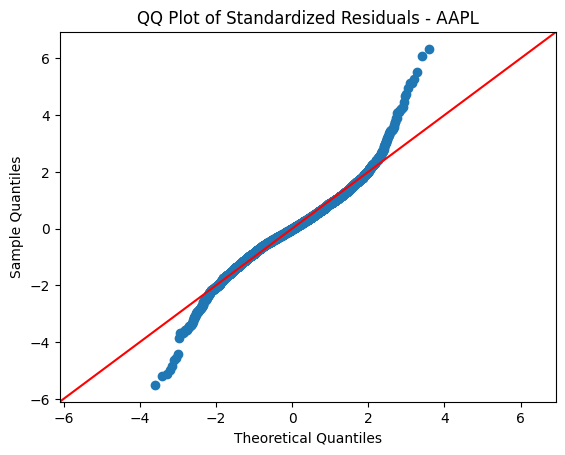

Ljung–Box Test on Standardized Residuals:
      lb_stat  lb_pvalue
1    1.527724   0.216454
2    3.046871   0.217962
3    4.746708   0.191312
4   11.119564   0.025253
5   11.737124   0.038573
6   12.846185   0.045545
7   14.000908   0.051165
8   21.306866   0.006375
9   21.393687   0.011013
10  21.404811   0.018441
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.249734   0.617262
2   0.462369   0.793593
3   0.575667   0.901980
4   0.794761   0.939149
5   1.363609   0.928252
6   1.691359   0.945786
7   2.123146   0.952711
8   2.497784   0.961834
9   2.596519   0.978174
10  2.597890   0.989371

===== Residual diagnostics for EBAY =====


<Figure size 600x600 with 0 Axes>

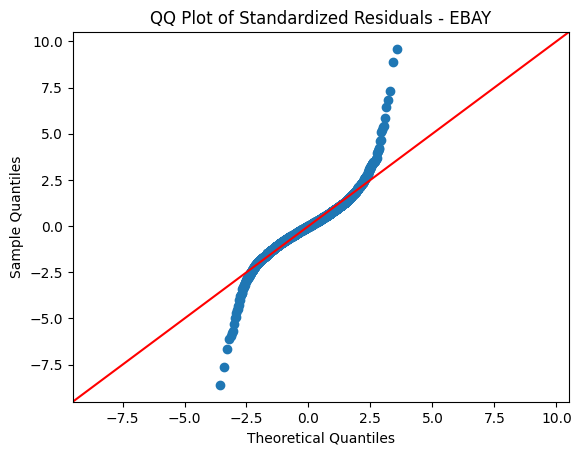

Ljung–Box Test on Standardized Residuals:
     lb_stat  lb_pvalue
1   6.840250   0.008913
2   7.393110   0.024809
3   7.838183   0.049477
4   7.840484   0.097599
5   7.849768   0.164712
6   8.148103   0.227453
7   8.472711   0.292760
8   8.686251   0.369451
9   9.367453   0.404069
10  9.467060   0.488424
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.616621   0.432306
2   0.634604   0.728111
3   0.667157   0.880900
4   1.347855   0.853206
5   1.378968   0.926600
6   1.390811   0.966415
7   2.143974   0.951444
8   2.151311   0.976018
9   2.173751   0.988412
10  2.386141   0.992433

===== Residual diagnostics for MCD =====


<Figure size 600x600 with 0 Axes>

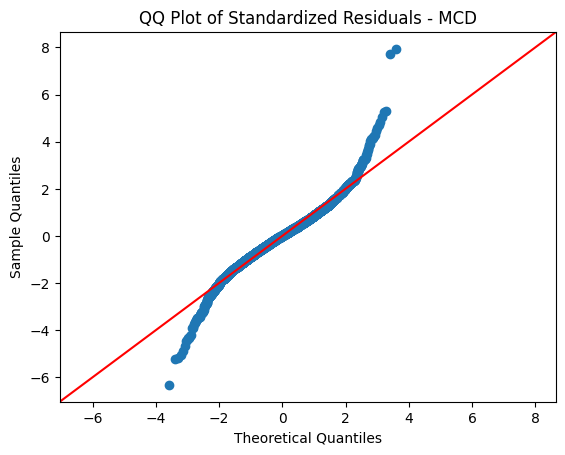

Ljung–Box Test on Standardized Residuals:
      lb_stat  lb_pvalue
1    6.222480   0.012614
2    9.039359   0.010893
3    9.198903   0.026760
4   11.048628   0.026023
5   11.248612   0.046668
6   11.770271   0.067294
7   11.772373   0.108297
8   12.208236   0.142152
9   13.694348   0.133621
10  13.739637   0.185202
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.620806   0.430748
2   0.947896   0.622540
3   1.402687   0.704905
4   1.606695   0.807588
5   1.608195   0.900257
6   1.704101   0.944804
7   2.010783   0.959241
8   2.065170   0.978948
9   2.101108   0.989766
10  2.320290   0.993244

===== Residual diagnostics for MSFT =====


<Figure size 600x600 with 0 Axes>

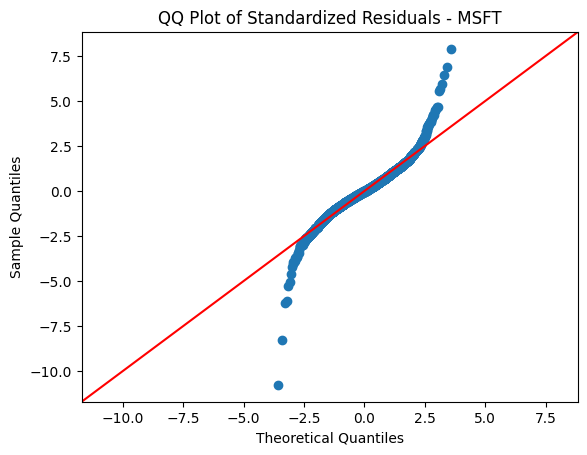

Ljung–Box Test on Standardized Residuals:
      lb_stat  lb_pvalue
1   11.162922   0.000834
2   12.158073   0.002290
3   12.170147   0.006822
4   12.745132   0.012591
5   15.185139   0.009600
6   18.379366   0.005351
7   18.741301   0.009038
8   23.668101   0.002604
9   23.807390   0.004616
10  24.963425   0.005415
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.589885   0.442463
2   0.942837   0.624116
3   0.989893   0.803698
4   1.760914   0.779625
5   2.237433   0.815411
6   2.786607   0.835114
7   3.282306   0.857717
8   3.585169   0.892480
9   3.598834   0.935781
10  3.670703   0.960982

===== Residual diagnostics for NVDA =====


<Figure size 600x600 with 0 Axes>

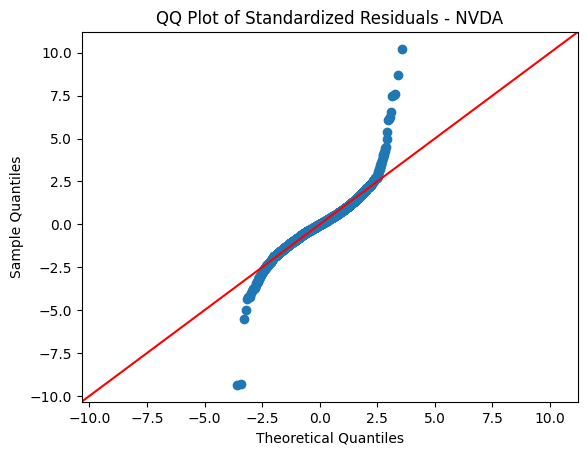

Ljung–Box Test on Standardized Residuals:
     lb_stat  lb_pvalue
1   0.465034   0.495281
2   0.635843   0.727660
3   0.823188   0.843913
4   0.833285   0.933931
5   1.690676   0.890072
6   1.985632   0.921015
7   3.690269   0.814681
8   4.389261   0.820407
9   5.184598   0.817929
10  7.521400   0.675473
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.269810   0.603459
2   0.269841   0.873785
3   0.345564   0.951243
4   0.756067   0.944239
5   1.036598   0.959560
6   1.262759   0.973671
7   1.602776   0.978537
8   2.461246   0.963514
9   3.185617   0.956479
10  3.271757   0.974286

===== Residual diagnostics for SBUX =====


<Figure size 600x600 with 0 Axes>

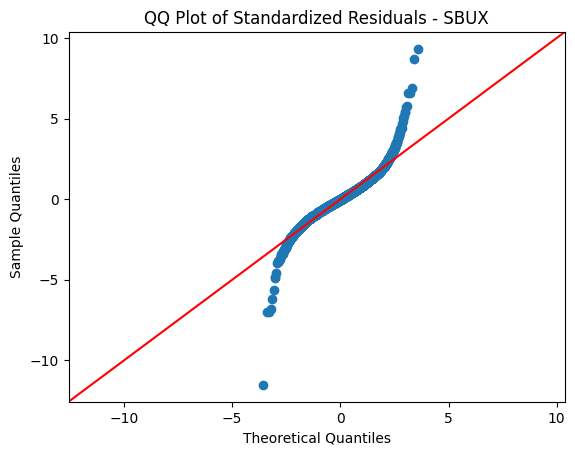

Ljung–Box Test on Standardized Residuals:
      lb_stat  lb_pvalue
1    2.731602   0.098381
2    2.845428   0.241059
3    5.059723   0.167476
4    6.283490   0.178954
5    6.402564   0.268994
6    8.290595   0.217577
7   10.853542   0.145136
8   12.349360   0.136284
9   14.735814   0.098453
10  17.429027   0.065394
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.295218   0.586896
2   0.784061   0.675684
3   0.806230   0.847976
4   0.894190   0.925393
5   1.679890   0.891423
6   2.221907   0.898201
7   2.253798   0.944469
8   2.292583   0.970703
9   2.298392   0.985823
10  2.475133   0.991233


In [ ]:
# Residual analysis for each stock (minimal changes, same style)

for t in std_resid_all.keys():
    print(f"\n===== Residual diagnostics for {t} =====")
    sr = std_resid_all[t].dropna()
    sr2 = (sr ** 2)

    # QQ Plot
    plt.figure(figsize=(6,6))
    qqplot(sr, line='45', fit=True)
    plt.title(f'QQ Plot of Standardized Residuals - {t}')
    plt.show()

    # Ljung-Box test on standardized residuals
    lb_resid = acorr_ljungbox(sr, lags=10, return_df=True)
    print("Ljung–Box Test on Standardized Residuals:")
    print(lb_resid)

    # Ljung-Box test on squared standardized residuals
    lb_sq = acorr_ljungbox(sr2, lags=10, return_df=True)
    print("Ljung–Box Test on Squared Standardized Residuals:")
    print(lb_sq)


# ''Rolling ARCH forecast – computational note''

In [ ]:

'''Rolling ARCH forecast – computational note

Originally, we implemented a “pure” rolling scheme(below the code) where, for each time t
(from `window` to the end of the sample), we:

    1. Took all returns up to t-1 as the training sample.
    2. Fit an ARCH(p) model on that sample.
    3. Produced a 1-step-ahead volatility forecast for time t.
    4. Repeated the entire fitting procedure for t+1, t+2, … until the end.

This means the ARCH model is re-estimated at *every single time point*.
For long time series and multiple tickers this is computationally very heavy:
we end up fitting hundreds or thousands of ARCH models per asset, which makes
the code extremely slow and sometimes impractical to run.

To reduce the computational burden, we replaced this with a **block rolling scheme**:

    • We still use an expanding window (we always use data from the start
      up to the current point i as the training set).

    • At each step i, we fit the ARCH(p) model **once** on the training data.

    • Instead of re-fitting the model at every next time point, we keep the
      same fitted model and use it to generate 1-step-ahead forecasts for
      the next `step` observations (e.g., 20 points). We treat the forecasted
      σ for that model as “frozen” over this block.

    • After forecasting this block (size = `step`), we move i forward by `step`
      and re-estimate the model again on the larger expanding sample.

In other words:
- The **original code** = re-fit ARCH at every time t → very accurate but
  computationally expensive.
- The **new code** = re-fit ARCH only every `step` observations, and reuse
  the same model for a small block → much more efficient, while still allowing
  the model to update over time.

We keep the same evaluation logic (realized |return| vs forecast σ, RMSE, etc.),
but obtain the forecasts in a way that is computationally feasible for our data.
"""

"""window = 350
results = {}

for t in returns.columns:
    print(f"\n===== Rolling ARCH forecast for {t} =====")
    r = returns[t].dropna()
    r_pct = r * 100

    rolling_sigma = []
    baseline_sigma = []
    realized_abs = []   # or realized_sq if you change to r^2

    p = best_orders[t]  # use best ARCH order for this ticker

    for i in range(window, len(r_pct)):
        # Expanding window (if you want rolling instead, use i-window:i)
        train = r_pct.iloc[:i]
        test = r_pct.iloc[i]

        # Baseline: constant sigma from training data
        baseline_std = train.std(ddof=1)
        baseline_sigma.append(baseline_std)

        # ARCH(p) rolling forecast
        model = arch_model(train, vol='ARCH', p=p)
        res = model.fit(disp='off')
        f = res.forecast(horizon=1)
        arch_sigma = np.sqrt(f.variance.values[-1, 0])
        rolling_sigma.append(arch_sigma)

        # Realized vol proxy
        realized_abs.append(abs(test))   # or test**2 for variance version

    # Align indices
    forecast_dates = r.index[window:]
    rolling_sigma = pd.Series(rolling_sigma, index=forecast_dates)
    baseline_sigma = pd.Series(baseline_sigma, index=forecast_dates)
    realized_series = pd.Series(realized_abs, index=forecast_dates)

    # Plot
    plt.figure(figsize=(12,6))
    plt.plot(realized_series, alpha=0.4, label='Realized |Return| (pct)')
    plt.plot(rolling_sigma, label=f'ARCH({p}) Forecast σ (pct)')
    plt.plot(baseline_sigma, linestyle='--', label='Baseline σ (pct)')
    plt.title(f'Rolling Volatility Forecast: ARCH({p}) vs Baseline — {t}')
    plt.xlabel('Date')
    plt.ylabel('Volatility (percent)')
    plt.legend()
    plt.show()

    # RMSE
    rmse_arch = np.sqrt(mean_squared_error(realized_series, rolling_sigma))
    rmse_base = np.sqrt(mean_squared_error(realized_series, baseline_sigma))
    improvement = (1 - rmse_arch / rmse_base) * 100

    print(f"{t}: RMSE ARCH({p}) = {rmse_arch:.6f} | RMSE Baseline = {rmse_base:.6f} | Improvement = {improvement:.2f}%")
    results[t] = {
        "p_arch": p,
        "rmse_arch": rmse_arch,
        "rmse_baseline": rmse_base,
        "improvement_%": improvement
    }

summary = pd.DataFrame(results).T
print("\nSummary (percent units):")
print(summary)
'''


'Rolling ARCH forecast – computational note\n\nOriginally, we implemented a “pure” rolling scheme(below the code) where, for each time t\n(from `window` to the end of the sample), we:\n\n    1. Took all returns up to t-1 as the training sample.\n    2. Fit an ARCH(p) model on that sample.\n    3. Produced a 1-step-ahead volatility forecast for time t.\n    4. Repeated the entire fitting procedure for t+1, t+2, … until the end.\n\nThis means the ARCH model is re-estimated at *every single time point*.\nFor long time series and multiple tickers this is computationally very heavy:\nwe end up fitting hundreds or thousands of ARCH models per asset, which makes\nthe code extremely slow and sometimes impractical to run.\n\nTo reduce the computational burden, we replaced this with a **block rolling scheme**:\n\n    • We still use an expanding window (we always use data from the start\n      up to the current point i as the training set).\n\n    • At each step i, we fit the ARCH(p) model **once

We use a step size of 20 to accelerate the process because above mentioned code in the comments is computationally too heavy.


===== Rolling ARCH forecast for AAPL =====


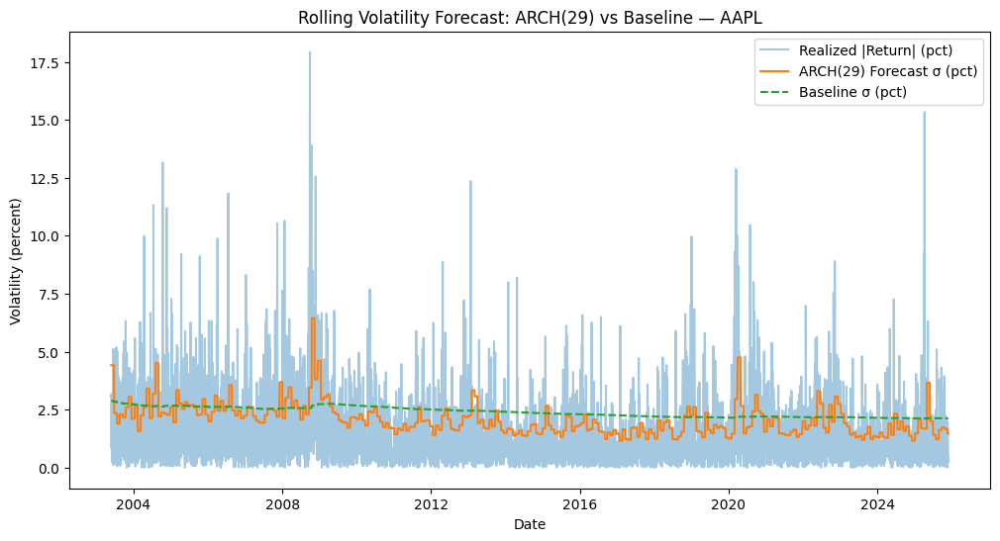

AAPL: RMSE ARCH(29) = 1.579521 | RMSE Baseline = 1.740390 | Improvement = 9.24%

===== Rolling ARCH forecast for EBAY =====


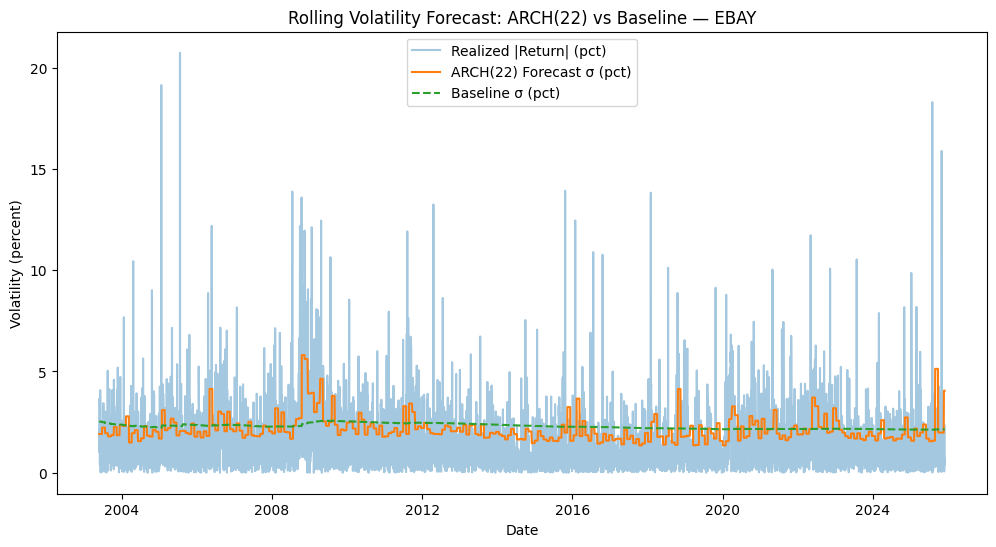

EBAY: RMSE ARCH(22) = 1.696789 | RMSE Baseline = 1.737065 | Improvement = 2.32%

===== Rolling ARCH forecast for MCD =====


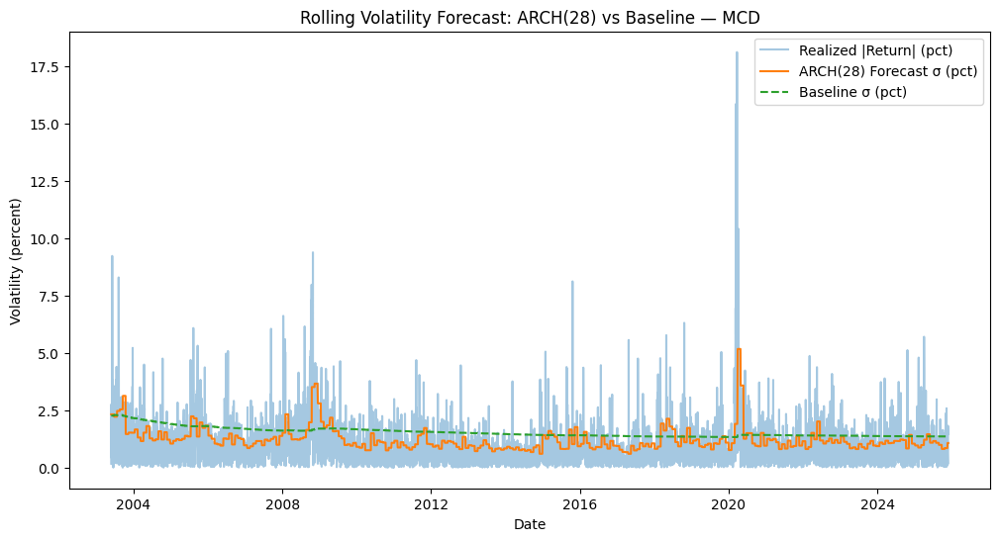

MCD: RMSE ARCH(28) = 0.997900 | RMSE Baseline = 1.151488 | Improvement = 13.34%

===== Rolling ARCH forecast for MSFT =====


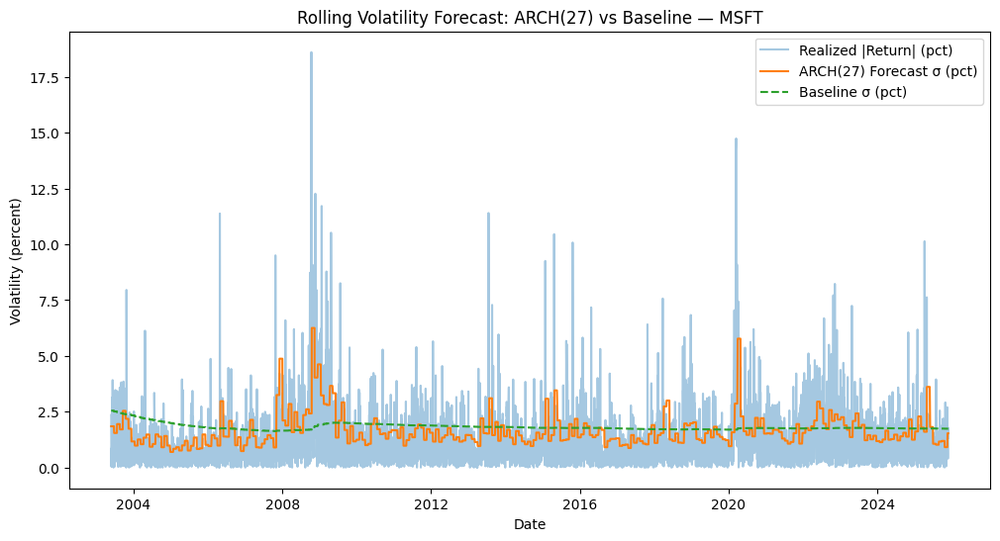

MSFT: RMSE ARCH(27) = 1.367489 | RMSE Baseline = 1.427996 | Improvement = 4.24%

===== Rolling ARCH forecast for NVDA =====


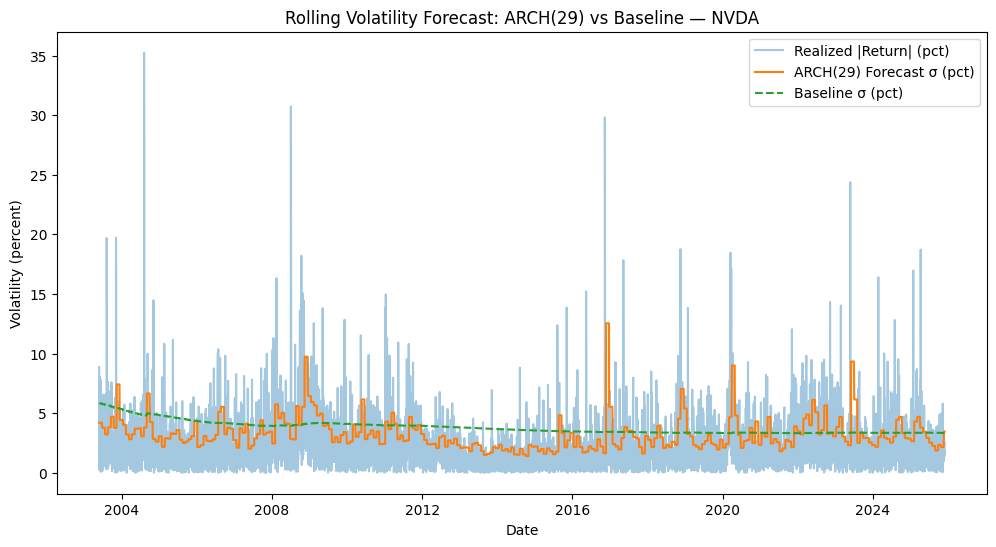

NVDA: RMSE ARCH(29) = 2.608307 | RMSE Baseline = 2.806498 | Improvement = 7.06%

===== Rolling ARCH forecast for SBUX =====


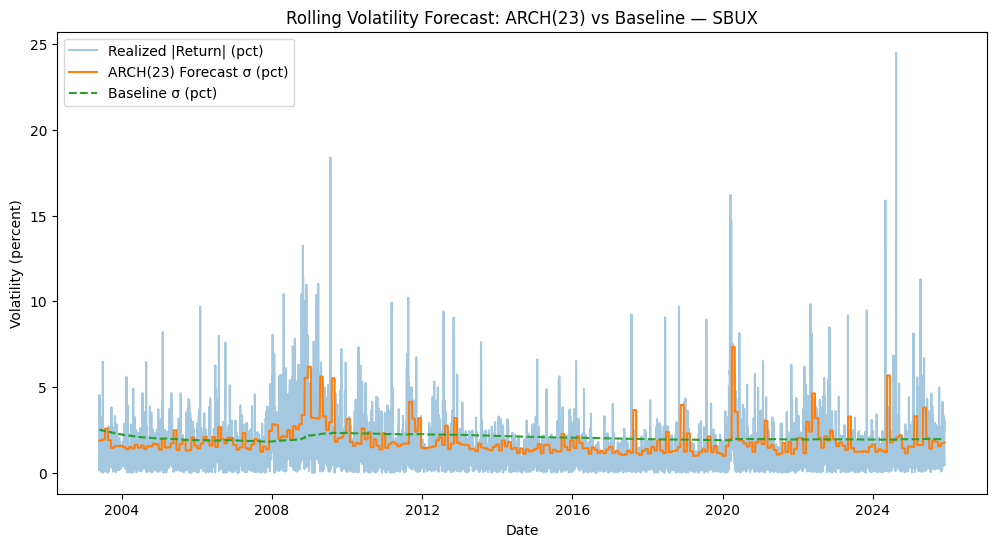

SBUX: RMSE ARCH(23) = 1.598756 | RMSE Baseline = 1.631723 | Improvement = 2.02%

Summary (percent units):
      p_arch  rmse_arch  rmse_baseline  improvement_%
AAPL    29.0   1.579521       1.740390       9.243285
EBAY    22.0   1.696789       1.737065       2.318626
MCD     28.0   0.997900       1.151488      13.338225
MSFT    27.0   1.367489       1.427996       4.237180
NVDA    29.0   2.608307       2.806498       7.061881
SBUX    23.0   1.598756       1.631723       2.020344


In [ ]:
window = 350
step = 20
results = {}

for t in returns.columns:
    print(f"\n===== Rolling ARCH forecast for {t} =====")
    r = returns[t].dropna()
    r_pct = r * 100

    rolling_sigma = []
    baseline_sigma = []
    realized_abs = []   # or realized_sq if you change to r^2

    p = best_orders[t]  # best ARCH order for this ticker

    # start forecasting after 'window' observations
    i = window

    while i < len(r_pct):
        # 1) Define training sample (expanding window)
        train = r_pct.iloc[:i]

        # 2) Baseline: constant sigma from training data
        baseline_std = train.std(ddof=1)

        # 3) Fit ARCH(p) once for this block
        model = arch_model(train, vol='ARCH', p=p)
        res = model.fit(disp='off')

        # 4) Define block of future points to forecast with this model
        block_start = i
        block_end = min(i + step, len(r_pct))  # don’t go past the end

        for j in range(block_start, block_end):
            test = r_pct.iloc[j]

            # ARCH(p) 1-step-ahead forecast σ (we treat it as constant over block)
            f = res.forecast(horizon=1)
            arch_sigma = np.sqrt(f.variance.values[-1, 0])

            rolling_sigma.append(arch_sigma)
            baseline_sigma.append(baseline_std)
            realized_abs.append(abs(test))   # or test**2 if using variance

        # move i forward by 'step'
        i = block_end

    # Align indices (number of forecasts = len(r_pct) - window)
    forecast_dates = r.index[window:]
    rolling_sigma = pd.Series(rolling_sigma, index=forecast_dates)
    baseline_sigma = pd.Series(baseline_sigma, index=forecast_dates)
    realized_series = pd.Series(realized_abs, index=forecast_dates)

    # Plot
    plt.figure(figsize=(12,6))
    plt.plot(realized_series, alpha=0.4, label='Realized |Return| (pct)')
    plt.plot(rolling_sigma, label=f'ARCH({p}) Forecast σ (pct)')
    plt.plot(baseline_sigma, linestyle='--', label='Baseline σ (pct)')
    plt.title(f'Rolling Volatility Forecast: ARCH({p}) vs Baseline — {t}')
    plt.xlabel('Date')
    plt.ylabel('Volatility (percent)')
    plt.legend()
    plt.show()

    # RMSE
    rmse_arch = np.sqrt(mean_squared_error(realized_series, rolling_sigma))
    rmse_base = np.sqrt(mean_squared_error(realized_series, baseline_sigma))
    improvement = (1 - rmse_arch / rmse_base) * 100

    print(f"{t}: RMSE ARCH({p}) = {rmse_arch:.6f} | RMSE Baseline = {rmse_base:.6f} | Improvement = {improvement:.2f}%")
    results[t] = {
        "p_arch": p,
        "rmse_arch": rmse_arch,
        "rmse_baseline": rmse_base,
        "improvement_%": improvement
    }

summary = pd.DataFrame(results).T
print("\nSummary (percent units):")
print(summary)


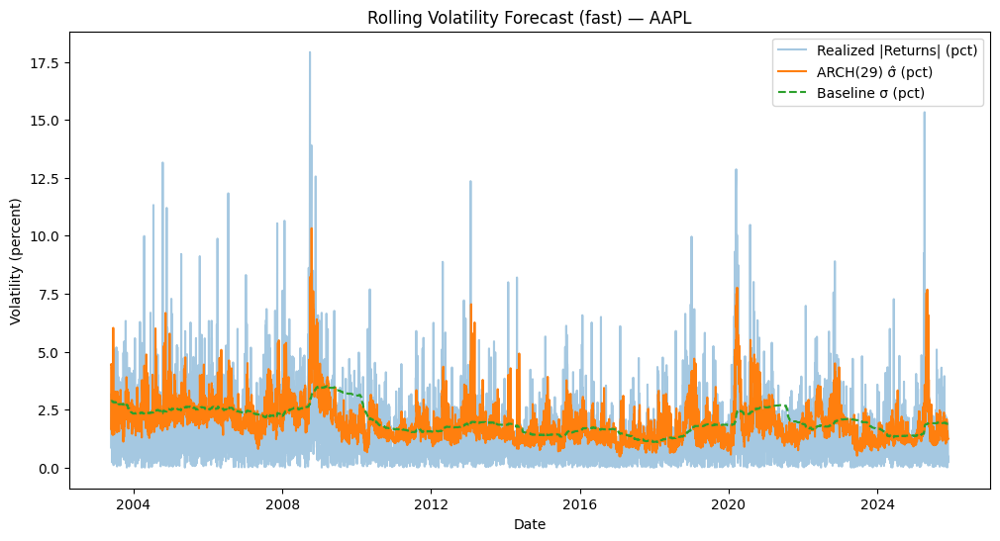

AAPL: RMSE ARCH(29)=1.570531 | Baseline=1.571538 | +0.06%


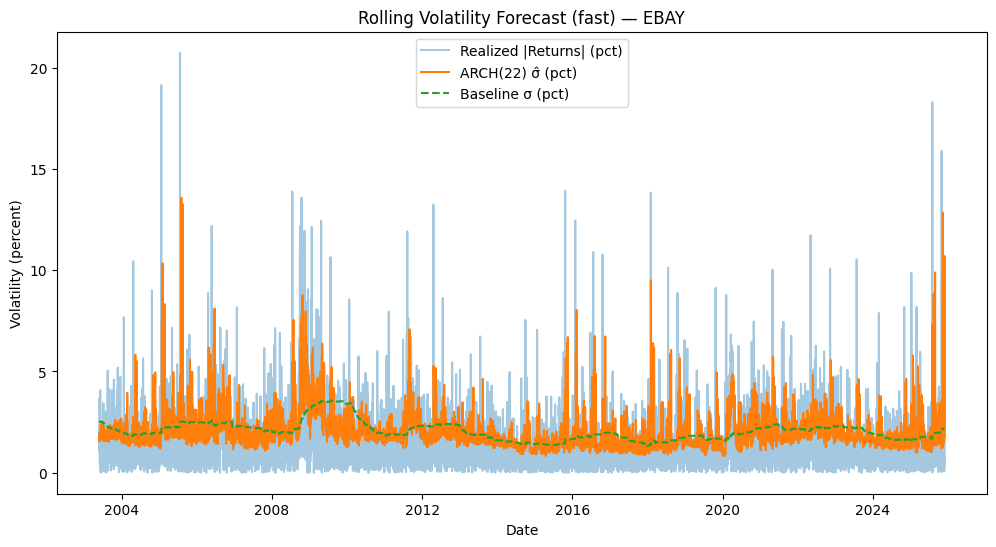

EBAY: RMSE ARCH(22)=1.729880 | Baseline=1.640547 | +-5.45%


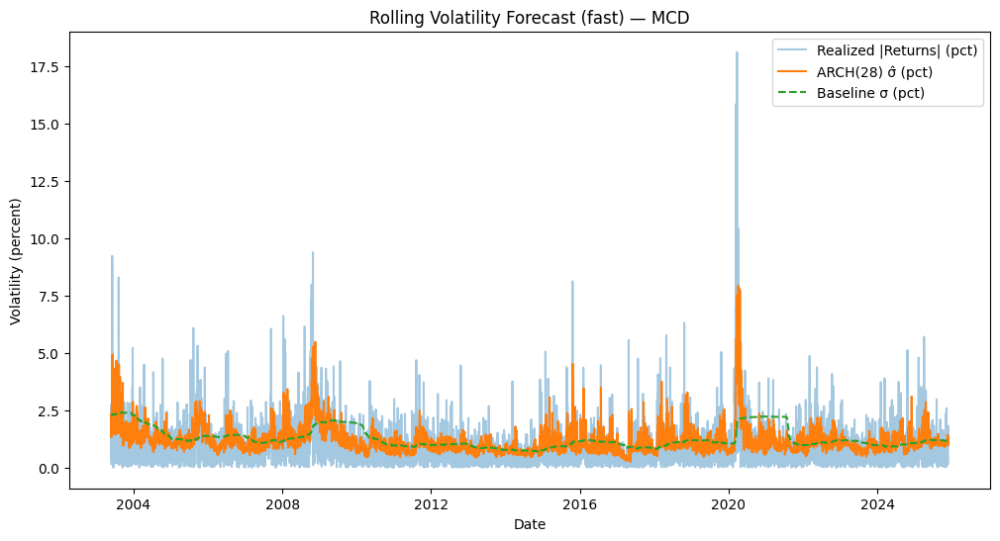

MCD: RMSE ARCH(28)=0.982246 | Baseline=1.046286 | +6.12%


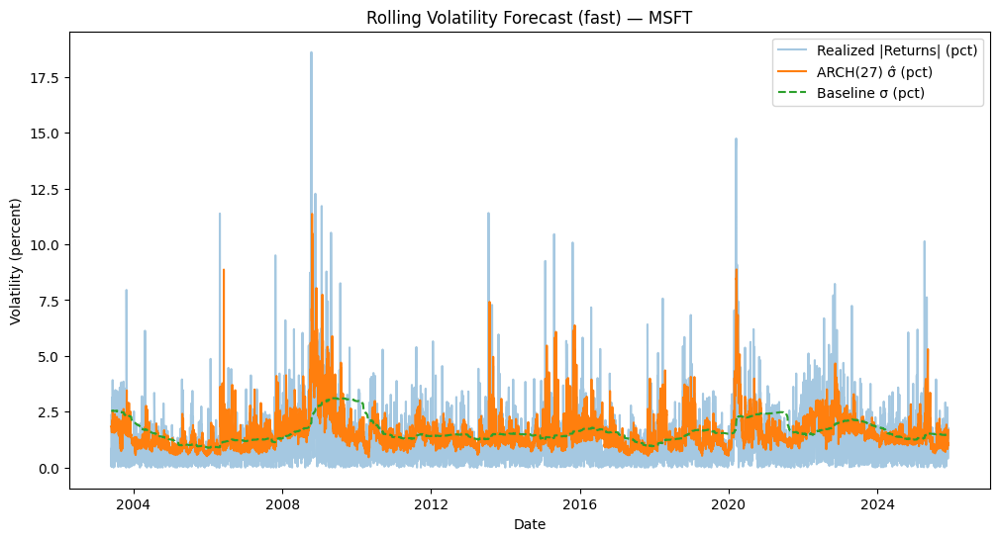

MSFT: RMSE ARCH(27)=1.320526 | Baseline=1.358406 | +2.79%


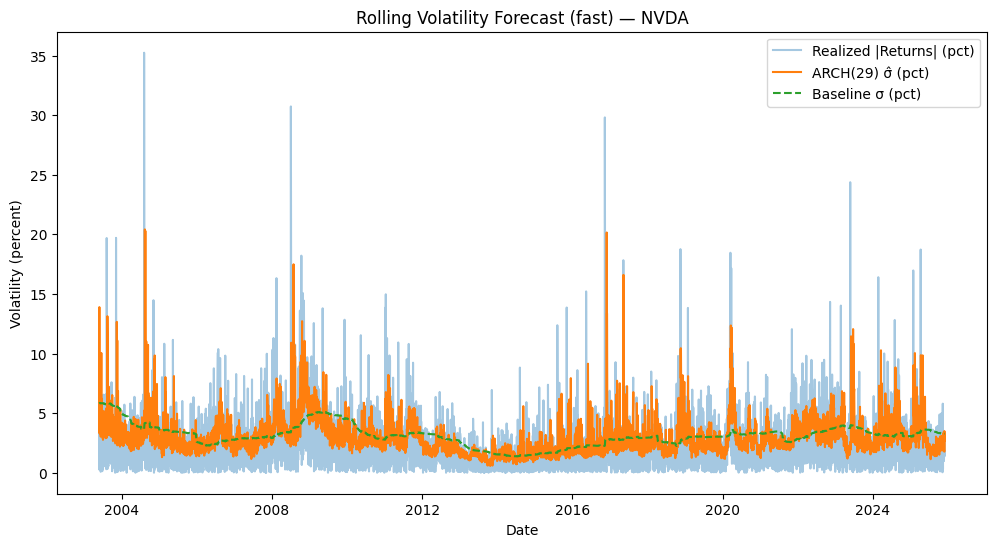

NVDA: RMSE ARCH(29)=2.505894 | Baseline=2.457653 | +-1.96%


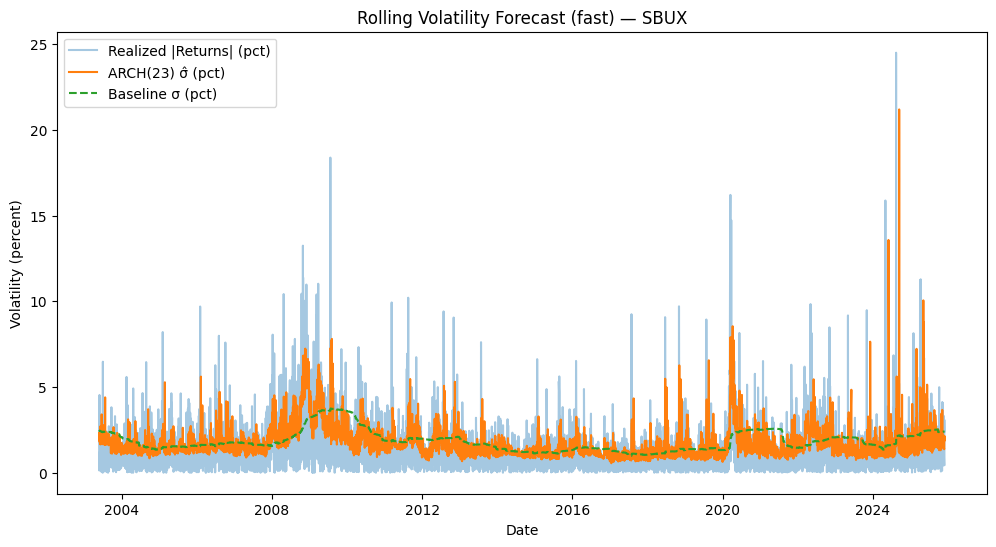

SBUX: RMSE ARCH(23)=1.537089 | Baseline=1.551676 | +0.94%

Summary (percent units):
      rmse_arch  rmse_baseline  improvement_%
AAPL   1.570531       1.571538       0.064128
EBAY   1.729880       1.640547      -5.445356
MCD    0.982246       1.046286       6.120662
MSFT   1.320526       1.358406       2.788516
NVDA   2.505894       2.457653      -1.962897
SBUX   1.537089       1.551676       0.940093


In [ ]:
from collections import deque
best_p = {
    'SBUX': 23, 'NVDA': 29, 'MSFT': 27, 'EBAY': 22,
    'MCD': 28,'AAPL': 29
}

window = 350
refit_every = 20  # try 20–60 for speed/accuracy tradeoff

results = {}

for t in returns.columns:
    p = best_p.get(t, 1)  # fallback p=1 if missing
    r = returns[t].dropna()
    r_pct = r * 100  # scale for ARCH

    # --- initial fit on the first window ---
    init = r_pct.iloc[:window]
    am = arch_model(init, mean='Constant', vol='ARCH', p=p, dist='normal')
    res = am.fit(disp='off')

    # params
    mu = res.params.get('mu', 0.0)
    omega = res.params['omega']
    alphas = np.array([res.params[f'alpha[{j}]'] for j in range(1, p+1)])

    # keep last p squared residuals in a deque (most recent last)
    eps = res.resid  # in percent units
    eps_sq_hist = deque((eps.tail(p).values**2).tolist(), maxlen=p)

    rolling_vol, baseline_vol, realized_vol = [], [], []

    for i in range(window, len(r_pct)):
        # periodic refit on the latest window points
        if (i - window) % refit_every == 0:
            train = r_pct.iloc[i-window:i]
            am = arch_model(train, mean='Constant', vol='ARCH', p=p, dist='normal')
            res = am.fit(disp='off')
            mu = res.params.get('mu', 0.0)
            omega = res.params['omega']
            alphas = np.array([res.params[f'alpha[{j}]'] for j in range(1, p+1)])
            eps = res.resid
            eps_sq_hist = deque((eps.tail(p).values**2).tolist(), maxlen=p)

        # baseline (constant sigma) from rolling window
        baseline_vol.append(r_pct.iloc[i-window:i].std(ddof=1))

        # fast 1-step ARCH(p) forecast via recursion
        # sigma_{t+1}^2 = omega + sum_{j=1..p} alpha_j * eps_{t+1-j}^2
        sigma2_next = omega + np.dot(alphas, np.array(list(eps_sq_hist))[::-1])
        sigma_next = float(np.sqrt(sigma2_next))
        rolling_vol.append(sigma_next)

        # realized proxy = |r_{t+1}|
        rt1 = float(r_pct.iloc[i])
        realized_vol.append(abs(rt1))

        # update residual history with new epsilon^2
        eps_new = rt1 - mu
        eps_sq_hist.append(eps_new**2)

    # align to dates
    dates = r_pct.index[window:]
    rolling_series  = pd.Series(rolling_vol, index=dates)
    baseline_series = pd.Series(baseline_vol, index=dates)
    realized_series = pd.Series(realized_vol, index=dates)

    # plot
    plt.figure(figsize=(12,6))
    plt.plot(realized_series, alpha=0.4, label='Realized |Returns| (pct)')
    plt.plot(rolling_series, label=f'ARCH({p}) σ̂ (pct)')
    plt.plot(baseline_series, linestyle='--', label='Baseline σ (pct)')
    plt.title(f'Rolling Volatility Forecast (fast) — {t}')
    plt.xlabel('Date'); plt.ylabel('Volatility (percent)'); plt.legend(); plt.show()

    # RMSEs
    rmse_arch = np.sqrt(mean_squared_error(realized_series, rolling_series))
    rmse_base = np.sqrt(mean_squared_error(realized_series, baseline_series))
    improvement = (1 - rmse_arch / rmse_base) * 100

    print(f"{t}: RMSE ARCH({p})={rmse_arch:.6f} | Baseline={rmse_base:.6f} | +{improvement:.2f}%")
    results[t] = {"rmse_arch": rmse_arch, "rmse_baseline": rmse_base, "improvement_%": improvement}

summary = pd.DataFrame(results).T
print("\nSummary (percent units):")
print(summary)

# **GARCH**

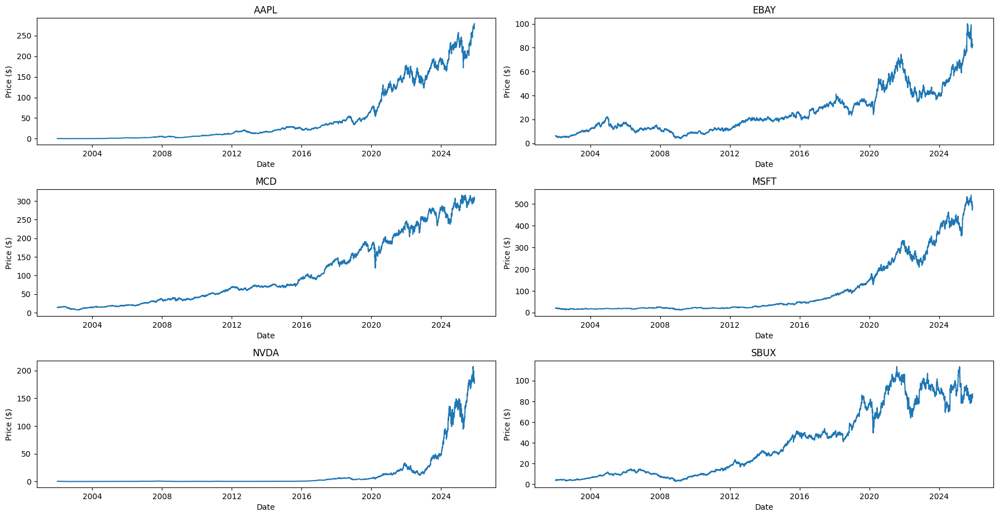

In [ ]:
# Plot each stock
plt.figure(figsize=(18,12))
for i, t in enumerate(prices.columns, 1):
    plt.subplot(4, 2, i)
    plt.plot(prices.index, prices[t], label=t)
    plt.title(t)
    plt.xlabel("Date")
    plt.ylabel("Price ($)")
    plt.tight_layout()

plt.show()

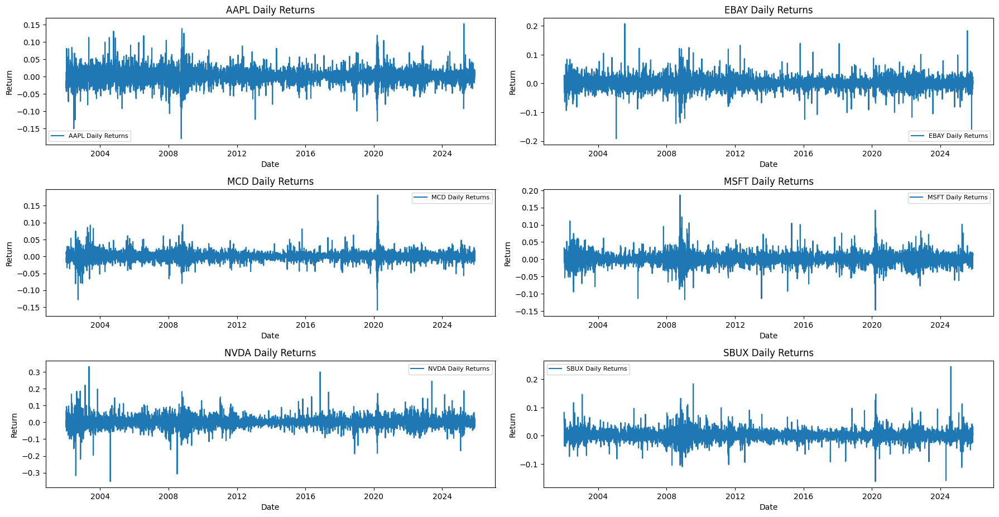

In [ ]:
# Compute daily returns for all tickers
returns = prices.pct_change().dropna()

# Plot each stock's returns
plt.figure(figsize=(18,12))
for i, t in enumerate(returns.columns, 1):
    plt.subplot(4, 2, i)
    plt.plot(returns.index, returns[t], label=f'{t} Daily Returns')
    plt.title(f'{t} Daily Returns')
    plt.xlabel('Date')
    plt.ylabel('Return')
    plt.legend(fontsize=8)
    plt.tight_layout()

plt.show()

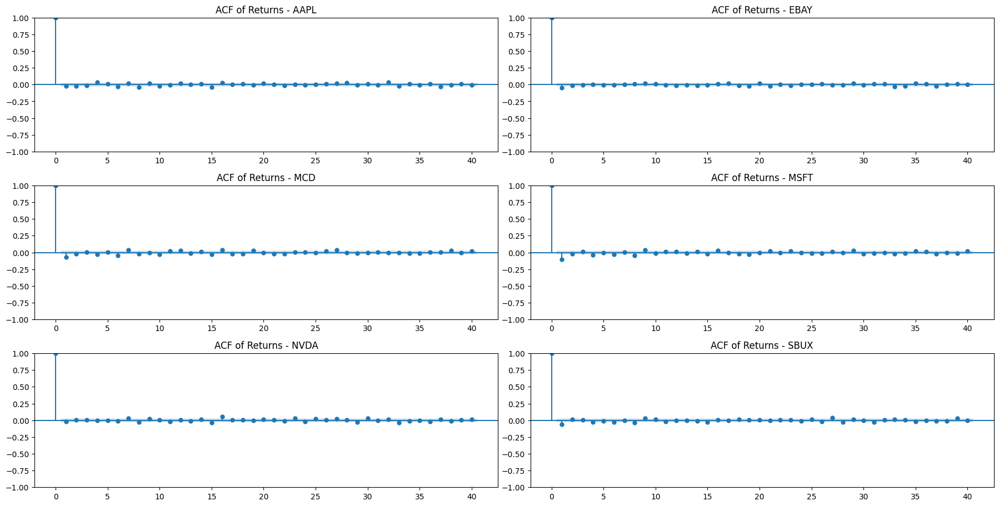

In [ ]:
# Plot ACF of returns for all tickers
plt.figure(figsize=(18,12))
for i, t in enumerate(returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_acf(returns[t].dropna(), lags=40, alpha=0.05, ax=ax)
    plt.title(f"ACF of Returns - {t}")

plt.tight_layout()
plt.show()


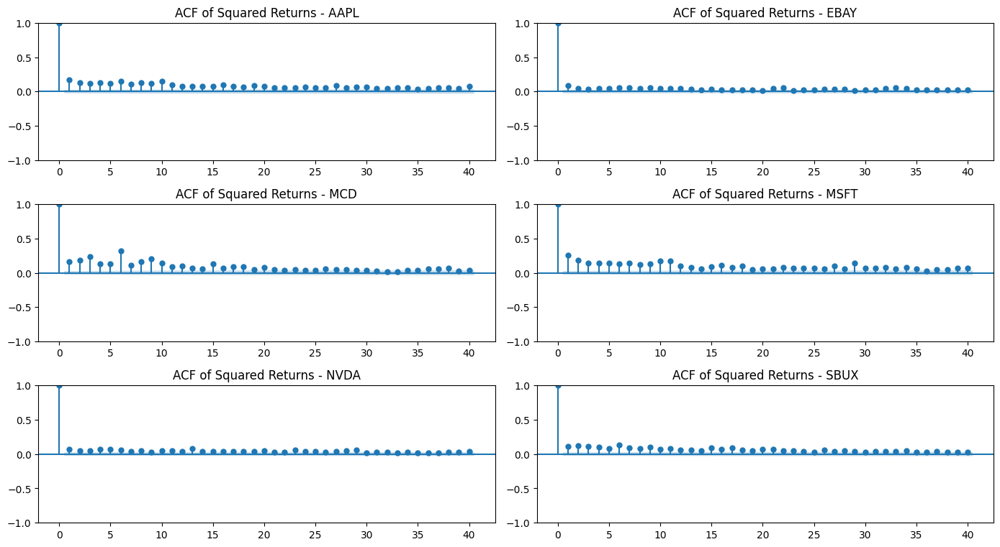

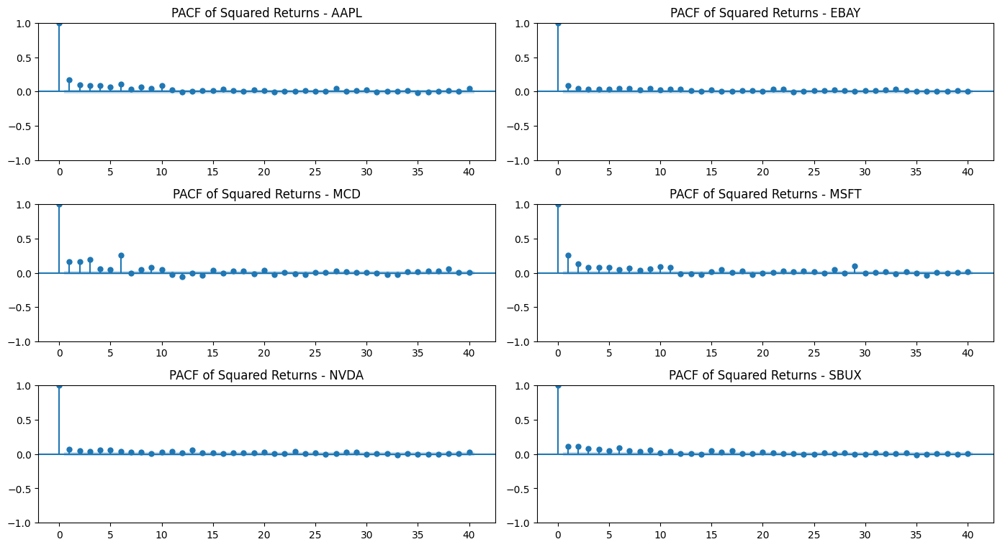

In [ ]:
# ACF and PACF of squared returns for all tickers

sq_returns = (returns ** 2).dropna()

# ACF subplots
plt.figure(figsize=(14,10))
for i, t in enumerate(sq_returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_acf(sq_returns[t], lags=40, alpha=0.05, ax=ax)
    plt.title(f"ACF of Squared Returns - {t}")
plt.tight_layout()
plt.show()

# PACF subplots
plt.figure(figsize=(14,10))
for i, t in enumerate(sq_returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_pacf(sq_returns[t], lags=40, alpha=0.05, method='ywm', ax=ax)
    plt.title(f"PACF of Squared Returns - {t}")
plt.tight_layout()
plt.show()


In [ ]:
# Split train/test for ALL tickers (column-wise)
train_frac = 0.80
n = len(returns)
n_train = int(np.floor(train_frac * n))
n_test = n - n_train

print(f"Total obs: {n}, Train: {n_train}, Test: {n_test}")

returns_train = returns.iloc[:n_train, :]    # all tickers
returns_test  = returns.iloc[n_train:, :]    # all tickers


Total obs: 6016, Train: 4812, Test: 1204



===== Searching best ARCH(q) for AAPL =====

AIC results for ARCH(1..10):
             AIC
q               
1   20999.682321
2   20833.235781
3   20745.796809
4   20707.930892
5   20596.017175
6   20546.296409
7   20516.823560
8   20474.156337
9   20473.654041
10  20467.506689
Best ARCH order for AAPL: q = 10 (AIC = 20467.507)


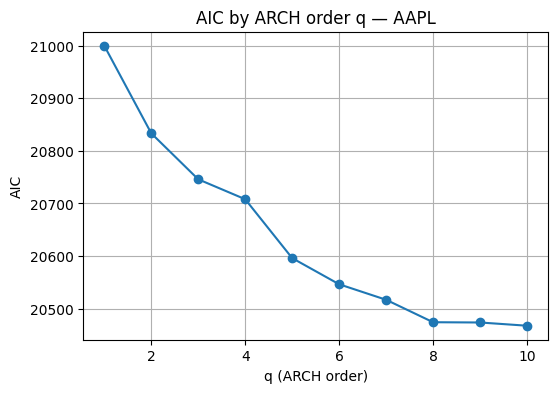


===== Searching best ARCH(q) for EBAY =====

AIC results for ARCH(1..10):
             AIC
q               
1   20826.400401
2   20786.020016
3   20769.334378
4   20744.970276
5   20729.792605
6   20709.419130
7   20684.854679
8   20655.404797
9   20637.503084
10  20617.277547
Best ARCH order for EBAY: q = 10 (AIC = 20617.278)


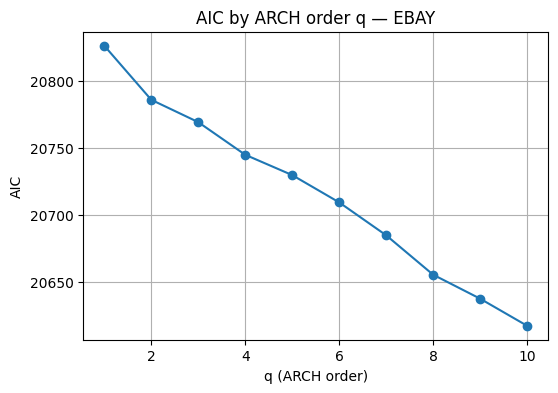


===== Searching best ARCH(q) for MCD =====

AIC results for ARCH(1..10):
             AIC
q               
1   16259.661523
2   15973.737523
3   15800.580043
4   15765.610685
5   15742.793023
6   15696.460865
7   15678.471806
8   15653.711592
9   15627.394651
10  15614.872813
Best ARCH order for MCD: q = 10 (AIC = 15614.873)


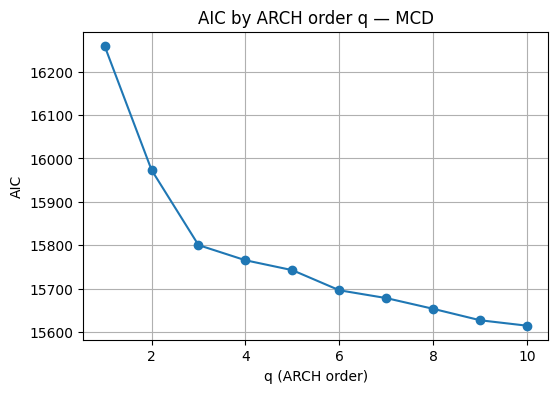


===== Searching best ARCH(q) for MSFT =====

AIC results for ARCH(1..10):
             AIC
q               
1   18428.879631
2   18289.591311
3   18183.076728
4   18054.581516
5   17986.606593
6   17937.807517
7   17908.598814
8   17889.035583
9   17891.013623
10  17887.481552
Best ARCH order for MSFT: q = 10 (AIC = 17887.482)


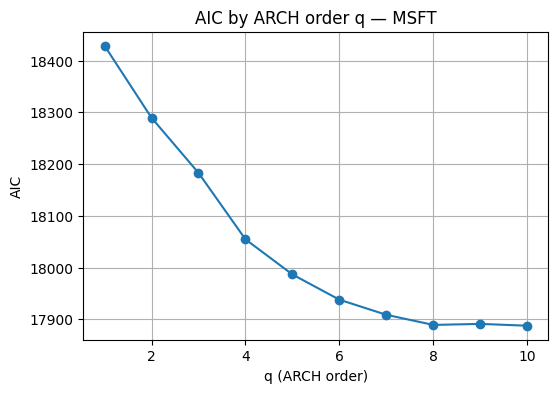


===== Searching best ARCH(q) for NVDA =====

AIC results for ARCH(1..10):
             AIC
q               
1   24943.859799
2   24850.588722
3   24783.384957
4   24649.705695
5   24467.074615
6   24419.482771
7   24395.694095
8   24311.539038
9   24312.934909
10  24308.721018
Best ARCH order for NVDA: q = 10 (AIC = 24308.721)


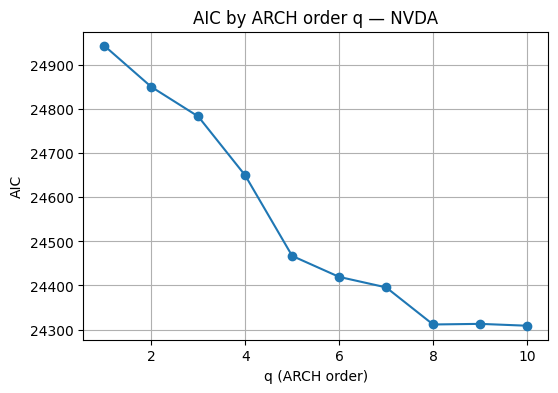


===== Searching best ARCH(q) for SBUX =====

AIC results for ARCH(1..10):
             AIC
q               
1   19682.967514
2   19320.081338
3   19244.447052
4   19183.392242
5   19048.501719
6   19007.571998
7   18993.157257
8   18986.465505
9   18984.515232
10  18974.768414
Best ARCH order for SBUX: q = 10 (AIC = 18974.768)


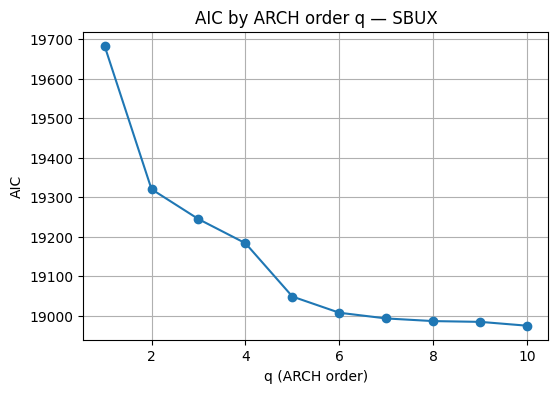


==== Summary of best ARCH orders per ticker ====
AAPL: q=10, AIC=20467.507
EBAY: q=10, AIC=20617.278
MCD: q=10, AIC=15614.873
MSFT: q=10, AIC=17887.482
NVDA: q=10, AIC=24308.721
SBUX: q=10, AIC=18974.768


In [ ]:
# Find best ARCH(q) order by AIC for each ticker separately

best_arch_orders = {}

for t in returns_train.columns:
    print(f"\n===== Searching best ARCH(q) for {t} =====")

    best_aic = np.inf
    best_q = None
    aic_results = []

    # Try q = 1 … 10
    for q in range(1, 11):
        try:
            am = arch_model(returns_train[t] * 100, mean='Zero', vol='ARCH', p=q)
            res = am.fit(disp='off')
            aic = res.aic
            aic_results.append((q, aic))

            if aic < best_aic:
                best_aic = aic
                best_q = q

        except Exception as e:
            print(f"ARCH({q}) fit failed for {t}: {e}")

    # store and print results for this ticker
    best_arch_orders[t] = (best_q, best_aic)

    print("\nAIC results for ARCH(1..10):")
    print(pd.DataFrame(aic_results, columns=['q','AIC']).set_index('q'))
    print(f"Best ARCH order for {t}: q = {best_q} (AIC = {best_aic:.3f})")

    # Plot AIC vs q for this ticker
    aic_df = pd.DataFrame(aic_results, columns=['q','AIC']).set_index('q')
    plt.figure(figsize=(6,4))
    plt.plot(aic_df.index, aic_df['AIC'], marker='o')
    plt.title(f"AIC by ARCH order q — {t}")
    plt.xlabel("q (ARCH order)")
    plt.ylabel("AIC")
    plt.grid(True)
    plt.show()

print("\n==== Summary of best ARCH orders per ticker ====")
for t, (q, aic) in best_arch_orders.items():
    print(f"{t}: q={q}, AIC={aic:.3f}")


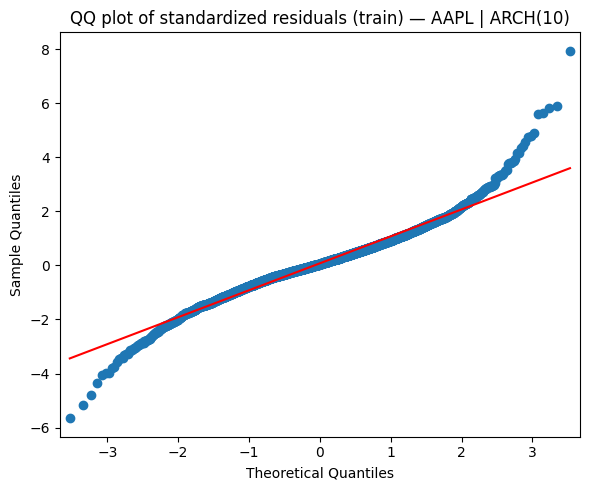


[AAPL] Ljung–Box on standardized residuals (train):
      lb_stat  lb_pvalue
1    0.710167   0.399388
2    2.069653   0.355288
3    2.628697   0.452481
4   10.497977   0.032825
5   11.088160   0.049660
6   13.763624   0.032391
7   14.889946   0.037436
8   20.881598   0.007469
9   20.996020   0.012668
10  21.009276   0.021029

[AAPL] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.305530   0.580436
2   0.475120   0.788549
3   1.009419   0.798973
4   1.011044   0.908117
5   2.500947   0.776352
6   3.451872   0.750362
7   4.955481   0.665396
8   5.947039   0.653164
9   6.394594   0.699868
10  6.940455   0.731054


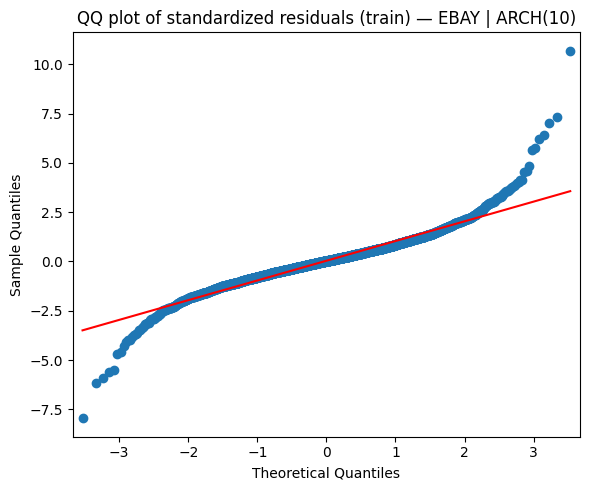


[EBAY] Ljung–Box on standardized residuals (train):
     lb_stat  lb_pvalue
1   5.789040   0.016126
2   5.857976   0.053451
3   5.901814   0.116486
4   5.968834   0.201488
5   6.134161   0.293383
6   6.202354   0.400908
7   6.563493   0.475696
8   6.646336   0.575226
9   6.766170   0.661450
10  6.768782   0.747078

[EBAY] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.739824   0.389717
2   0.809631   0.667100
3   0.841499   0.839517
4   1.131174   0.889295
5   1.161965   0.948474
6   1.623655   0.950862
7   2.204928   0.947633
8   3.202956   0.920983
9   3.811328   0.923386
10  4.823431   0.902656


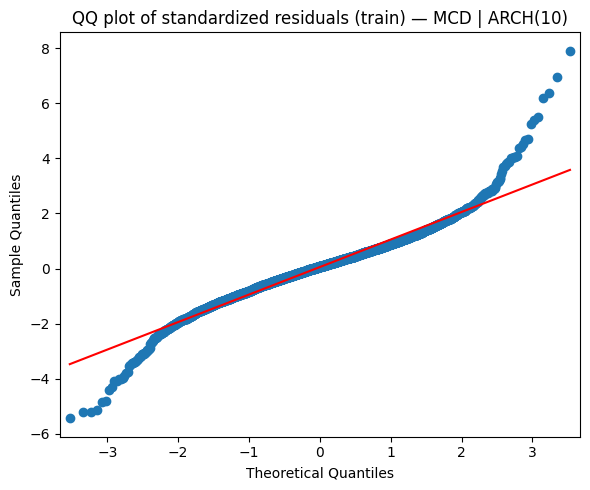


[MCD] Ljung–Box on standardized residuals (train):
      lb_stat  lb_pvalue
1    6.475927   0.010935
2    9.178843   0.010159
3    9.232508   0.026354
4    9.846967   0.043086
5   10.089317   0.072744
6   10.143075   0.118755
7   10.211866   0.176882
8   10.923473   0.206073
9   11.543243   0.240300
10  11.749169   0.302194

[MCD] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   1.209703   0.271391
2   1.925285   0.381882
3   3.482938   0.322982
4   3.782206   0.436283
5   4.684055   0.455641
6   5.998885   0.423315
7   7.040405   0.424685
8   7.776108   0.455641
9   8.679501   0.467369
10  8.746946   0.556276


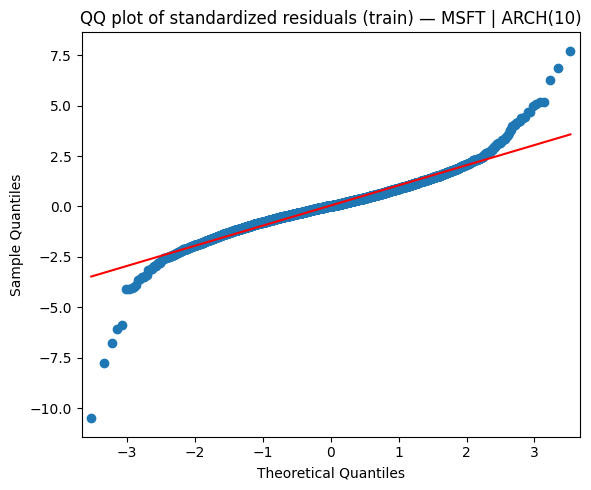


[MSFT] Ljung–Box on standardized residuals (train):
      lb_stat  lb_pvalue
1   11.008367   0.000907
2   11.019813   0.004046
3   11.224936   0.010570
4   12.598726   0.013412
5   16.232073   0.006212
6   19.063887   0.004057
7   19.740176   0.006159
8   24.222431   0.002103
9   24.222829   0.003963
10  26.295951   0.003362

[MSFT] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.790124   0.374063
2   1.034350   0.596202
3   1.094494   0.778403
4   1.876139   0.758527
5   2.678732   0.749369
6   3.421968   0.754321
7   4.051819   0.773790
8   5.244640   0.731137
9   5.429688   0.795359
10  5.607693   0.847077


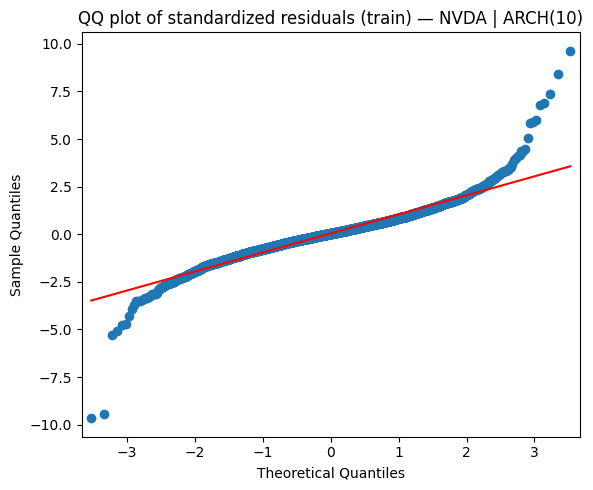


[NVDA] Ljung–Box on standardized residuals (train):
     lb_stat  lb_pvalue
1   0.163518   0.685938
2   0.188290   0.910151
3   1.043243   0.790790
4   1.182209   0.881019
5   1.703260   0.888489
6   3.112821   0.794559
7   3.942672   0.786356
8   5.228360   0.732913
9   5.430010   0.795329
10  8.671295   0.563557

[NVDA] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.244549   0.620939
2   0.524774   0.769213
3   1.236675   0.744222
4   1.881756   0.757496
5   2.187441   0.822648
6   3.571413   0.734446
7   4.940457   0.667230
8   6.372861   0.605542
9   7.436988   0.591720
10  8.313452   0.598249


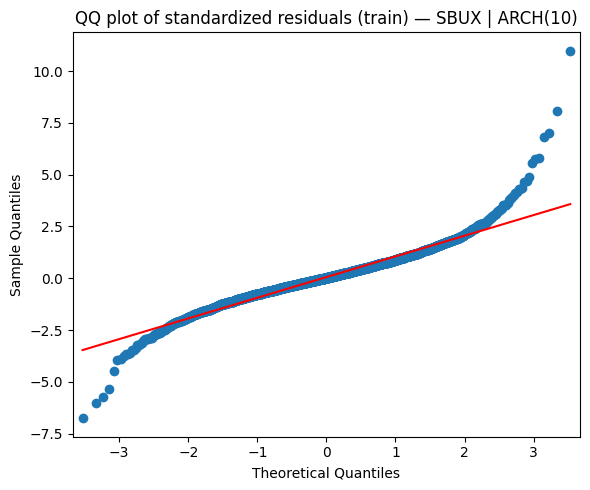


[SBUX] Ljung–Box on standardized residuals (train):
      lb_stat  lb_pvalue
1    4.542404   0.033065
2    5.160871   0.075741
3    6.192651   0.102604
4    6.478599   0.166144
5    6.569379   0.254685
6    7.311459   0.293001
7    9.886176   0.195116
8   10.831455   0.211433
9   11.665603   0.232824
10  12.220466   0.270573

[SBUX] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.671441   0.412550
2   1.638490   0.440764
3   1.734402   0.629313
4   2.332465   0.674865
5   3.595750   0.608952
6   4.556950   0.601755
7   6.224322   0.513814
8   6.539835   0.586993
9   6.830370   0.654775
10  8.280003   0.601507


In [ ]:
# Residual diagnostics for baseline: fit chosen ARCH on full train per ticker

from statsmodels.graphics.gofplots import qqplot

# Helper: pick q for ticker t (use per-ticker dict if available, else global best_q)
def q_for(t):
    if 'best_arch_orders' in globals() and t in best_arch_orders and best_arch_orders[t][0] is not None:
        return best_arch_orders[t][0]
    return best_q  # fallback if you computed a single best_q earlier

std_resid_train = {}  # store standardized residuals per ticker

# Fit per ticker and print tests
for t in returns_train.columns:
    q = q_for(t) or 1
    arch_best = arch_model(returns_train[t] * 100, mean='Zero', vol='ARCH', p=q).fit(disp='off')

    sr = arch_best.std_resid.dropna()   # standardized residuals (train)
    std_resid_train[t] = sr

    # QQ plot (one figure per ticker, same style as yours)
    plt.figure(figsize=(6,5))
    qqplot(sr, line='s', ax=plt.gca())
    plt.title(f"QQ plot of standardized residuals (train) — {t} | ARCH({q})")
    plt.tight_layout()
    plt.show()

    # Ljung–Box tests
    lb_resid = acorr_ljungbox(sr, lags=10, return_df=True)
    lb_sq    = acorr_ljungbox(sr**2, lags=10, return_df=True)

    print(f"\n[{t}] Ljung–Box on standardized residuals (train):")
    print(lb_resid)
    print(f"\n[{t}] Ljung–Box on squared standardized residuals (train):")
    print(lb_sq)



=== Rolling forecasts for AAPL ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for EBAY ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...


/tmp/ipython-input-761875135.py:18: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  res = am.fit(disp='off')


Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for MCD ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for MSFT ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for NVDA ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for SBUX ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...


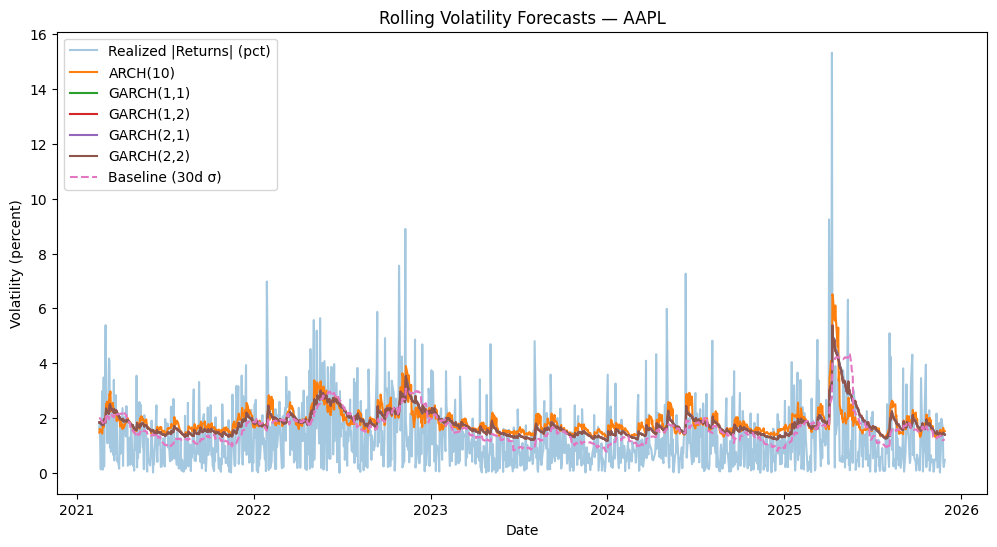


RMSE (percent units):
        Baseline(30d)  ARCH(10)  GARCH(1,1)  GARCH(1,2)  GARCH(2,1)  \
Ticker                                                                
AAPL         1.306511  1.357002    1.321850    1.318974    1.321851   
EBAY         1.646612  1.653070    1.612882    1.607905    1.613340   
MCD          0.773438  0.814287    0.787806    0.788468    0.787806   
MSFT         1.170060  1.208092    1.179204    1.178617    1.179204   
NVDA         2.376768  2.517601    2.395436    2.398190    2.395437   
SBUX         1.678181  1.676721    1.641712    1.643417    1.641710   

        GARCH(2,2)  
Ticker              
AAPL      1.318974  
EBAY      1.608757  
MCD       0.788467  
MSFT      1.178616  
NVDA      2.398190  
SBUX      1.650838  


In [ ]:


# --- 1) Define the rolling forecast function (must be defined BEFORE calling it) ---
def rolling_forecast_volatility(model_constructor, returns_series, train_size, h=1):
    """
    model_constructor: function that returns an arch_model instance with specified params, given data
    returns_series: full returns series (in percent scaling)
    train_size: number of initial observations for training
    h: forecast horizon (1)
    Returns: np.array of forecasted volatilities (std) aligned with the test index
    """
    n = len(returns_series)
    n_test = n - train_size
    fcast_vol = []
    for i in range(n_test):
        train_end = train_size + i
        train_data = returns_series.iloc[:train_end]
        try:
            am = model_constructor(train_data)
            res = am.fit(disp='off')
            fcast = res.forecast(horizon=h, reindex=False)
            var_forecast = fcast.variance.values[-1, -1]  # last forecasted variance
            vol_forecast = np.sqrt(var_forecast)          # std (same units as data)
        except Exception:
            vol_forecast = np.nan
        fcast_vol.append(vol_forecast)
    return np.array(fcast_vol)

# --- 2) Prepare percent-scaled returns per ticker ---
# 'returns' should be your DataFrame of daily returns for ALL tickers (columns = tickers)
returns_percent_df = (returns * 100).dropna()

# Train/test split fraction you already set earlier
train_frac = 0.80

# Helper to get best ARCH order per ticker (if you built best_arch_orders), else fallback to best_q
def q_for(t):
    try:
        if 'best_arch_orders' in globals() and t in best_arch_orders and best_arch_orders[t][0] is not None:
            return best_arch_orders[t][0]
    except Exception:
        pass
    return best_q  # fallback to a single global best_q if you computed only one earlier

# --- 3) Build forecasts per ticker using your model list ---
def make_model_list_for_ticker(t):
    q = q_for(t)
    return [
        (f'ARCH({q})', lambda d, q=q: arch_model(d, mean='Zero', vol='ARCH', p=q)),
        ('GARCH(1,1)', lambda d: arch_model(d, mean='Zero', vol='GARCH', p=1, q=1)),
        ('GARCH(1,2)', lambda d: arch_model(d, mean='Zero', vol='GARCH', p=1, q=2)),
        ('GARCH(2,1)', lambda d: arch_model(d, mean='Zero', vol='GARCH', p=2, q=1)),
        ('GARCH(2,2)', lambda d: arch_model(d, mean='Zero', vol='GARCH', p=2, q=2)),
    ]

fcasts_all   = {}  # dict[ticker] -> dict[model_name] -> np.array
baseline_all = {}  # dict[ticker] -> np.array (30d rolling σ)
realized_all = {}  # dict[ticker] -> pd.Series (|return| percent)
test_idx_all = {}  # dict[ticker] -> DatetimeIndex

for t in returns_percent_df.columns:
    print(f"\n=== Rolling forecasts for {t} ===")
    r_pct = returns_percent_df[t].dropna()
    n = len(r_pct)
    n_train = int(np.floor(train_frac * n))
    test_idx = r_pct.index[n_train:]
    test_idx_all[t] = test_idx

    # model list for this ticker (ARCH order may differ per ticker)
    model_list_t = make_model_list_for_ticker(t)

    # forecasts per model
    fcasts = {}
    for name, constructor in model_list_t:
        print(f"Rolling forecast: {name} ...")
        vols = rolling_forecast_volatility(constructor, r_pct, n_train, h=1)
        fcasts[name] = vols
    fcasts_all[t] = fcasts

    # realized |return| (percent) for test window
    realized_all[t] = r_pct.iloc[n_train:].abs()

    # baseline: 30-day rolling σ aligned to test
    roll_std = []
    for i in range(n_train, n):
        start = max(0, i - 30)
        window = r_pct.iloc[start:i]
        roll_std.append(window.std(ddof=0))  # population std
    baseline_all[t] = np.array(roll_std)

# --- 4) Example plot for the first ticker ---
example_t = returns_percent_df.columns[0]
plt.figure(figsize=(12,6))
plt.plot(test_idx_all[example_t], realized_all[example_t], alpha=0.4, label='Realized |Returns| (pct)')
for name, arr in fcasts_all[example_t].items():
    plt.plot(test_idx_all[example_t], arr, label=name)
plt.plot(test_idx_all[example_t], baseline_all[example_t], linestyle='--', label='Baseline (30d σ)')
plt.title(f'Rolling Volatility Forecasts — {example_t}')
plt.xlabel('Date'); plt.ylabel('Volatility (percent)')
plt.legend(); plt.show()

# --- 5) RMSE table per model per ticker ---
rmse_rows = []
for t in returns_percent_df.columns:
    y = realized_all[t].values
    row = {'Ticker': t, 'Baseline(30d)': np.sqrt(mean_squared_error(y, baseline_all[t]))}
    for name, arr in fcasts_all[t].items():
        row[name] = np.sqrt(mean_squared_error(y, arr))
    rmse_rows.append(row)

rmse_df = pd.DataFrame(rmse_rows).set_index('Ticker').round(6)
print("\nRMSE (percent units):")
print(rmse_df)





Computationally, it is too heavy to search for the best ARCH order for comparison, anyway I used the best order as previously we got it from AIC and  only  use that for comparison ,thats why for other orders is Nan , for example Apple  best order for Arch (29) we got 1.335 for other orders is Nan ,  above one  we used  fixed  q=10 to speed up the process.


=== Rolling forecasts for AAPL ===
  Rolling forecast: ARCH(29) ...
  Rolling forecast: GARCH(1,1) ...
  Rolling forecast: GARCH(1,2) ...
  Rolling forecast: GARCH(2,1) ...
  Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for EBAY ===
  Rolling forecast: ARCH(22) ...
  Rolling forecast: GARCH(1,1) ...
  Rolling forecast: GARCH(1,2) ...
  Rolling forecast: GARCH(2,1) ...


/tmp/ipython-input-4214315164.py:41: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  res = am.fit(disp='off')


  Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for MCD ===
  Rolling forecast: ARCH(28) ...
  Rolling forecast: GARCH(1,1) ...
  Rolling forecast: GARCH(1,2) ...
  Rolling forecast: GARCH(2,1) ...
  Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for MSFT ===
  Rolling forecast: ARCH(27) ...
  Rolling forecast: GARCH(1,1) ...
  Rolling forecast: GARCH(1,2) ...
  Rolling forecast: GARCH(2,1) ...
  Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for NVDA ===
  Rolling forecast: ARCH(29) ...
  Rolling forecast: GARCH(1,1) ...
  Rolling forecast: GARCH(1,2) ...
  Rolling forecast: GARCH(2,1) ...
  Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for SBUX ===
  Rolling forecast: ARCH(23) ...
  Rolling forecast: GARCH(1,1) ...
  Rolling forecast: GARCH(1,2) ...
  Rolling forecast: GARCH(2,1) ...
  Rolling forecast: GARCH(2,2) ...


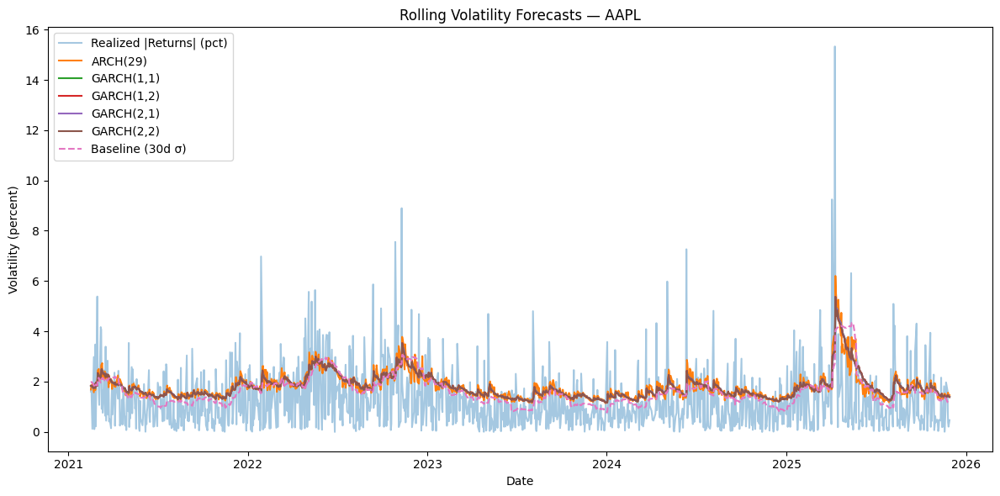


RMSE (percent units):
        Baseline(30d)  ARCH(29)  GARCH(1,1)  GARCH(1,2)  GARCH(2,1)  \
Ticker                                                                
AAPL         1.306511  1.335193    1.321850    1.318974    1.321851   
EBAY         1.646612       NaN    1.612882    1.607905    1.613340   
MCD          0.773438       NaN    0.787806    0.788468    0.787806   
MSFT         1.170060       NaN    1.179204    1.178617    1.179204   
NVDA         2.376768  2.499691    2.395436    2.398190    2.395437   
SBUX         1.678181       NaN    1.641712    1.643417    1.641710   

        GARCH(2,2)  ARCH(22)  ARCH(28)  ARCH(27)  ARCH(23)  
Ticker                                                      
AAPL      1.318974       NaN       NaN       NaN       NaN  
EBAY      1.608757  1.673383       NaN       NaN       NaN  
MCD       0.788467       NaN  0.797762       NaN       NaN  
MSFT      1.178616       NaN       NaN  1.201777       NaN  
NVDA      2.398190       NaN       NaN    

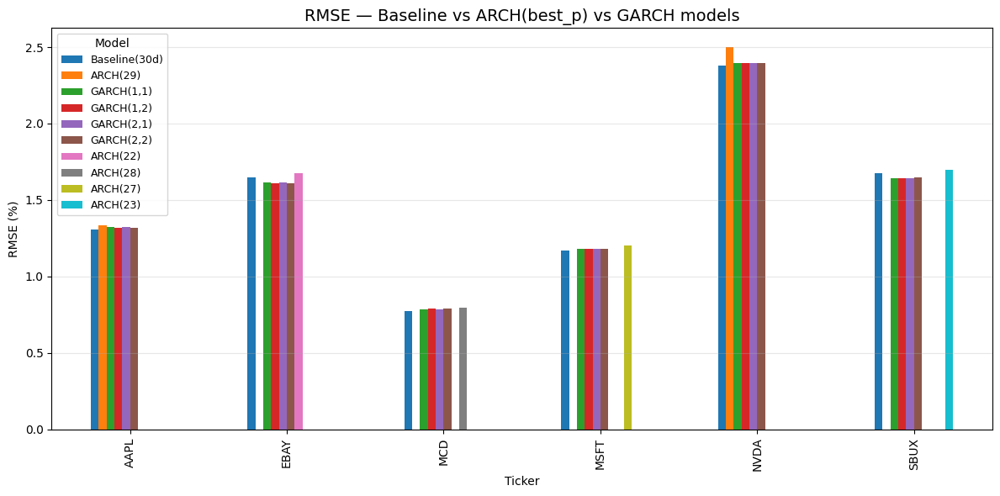

In [ ]:
# =====================================================
# 0) Imports
# =====================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error
from arch import arch_model
from arch.utility.exceptions import ConvergenceWarning
import warnings

pd.set_option("display.float_format", lambda x: f"{x:,.6f}")


# =====================================================
# 1) Robust rolling forecast function
# =====================================================
def rolling_forecast_volatility(model_constructor, returns_series, train_size, h=1):
    """
    model_constructor: function -> arch_model instance (given data)
    returns_series: full returns series (in percent)
    train_size: number of initial observations for training
    h: forecast horizon (1)
    Returns: np.array of forecasted volatilities (std), length = n - train_size
    """
    n = len(returns_series)
    n_test = n - train_size
    fcast_vol = []

    for i in range(n_test):
        train_end = train_size + i
        train_data = returns_series.iloc[:train_end]

        try:
            # Treat convergence warnings as errors so we fall into except
            with warnings.catch_warnings():
                warnings.filterwarnings("error", category=ConvergenceWarning)

                am = model_constructor(train_data)
                res = am.fit(disp='off')

            # Optional: also check convergence flag from arch
            if getattr(res, "convergence", 0) != 0:
                vol_forecast = np.nan
            else:
                fcast = res.forecast(horizon=h, reindex=False)
                var_forecast = fcast.variance.values[-1, -1]  # last forecasted variance
                vol_forecast = np.sqrt(var_forecast)          # std (same units as data)

        except (ConvergenceWarning, Exception):
            vol_forecast = np.nan

        fcast_vol.append(vol_forecast)

    return np.array(fcast_vol)


# =====================================================
# 2) Returns in percent & train/test split
# =====================================================
# 'returns' must be defined before this: DataFrame of daily returns (not %),
# index = dates, columns = tickers.
returns_percent_df = (returns * 100).dropna()

train_frac = 0.80  # 80% train, 20% test


# =====================================================
# 3) Best ARCH order per ticker (from AIC)
# =====================================================
best_p = {
    'SBUX': 23,
    'NVDA': 29,
    'MSFT': 27,
    'EBAY': 22,
    'MCD': 28,
    'AAPL': 29,
}

def q_for(ticker):
    """Return best ARCH order for a ticker (from your AIC results)."""
    return best_p.get(ticker, 1)


# =====================================================
# 4) Model list per ticker (ARCH_best + GARCH variants)
# =====================================================
def make_model_list_for_ticker(t):
    q = q_for(t)
    return [
        (f'ARCH({q})',   lambda d, q=q: arch_model(d, mean='Zero', vol='ARCH', p=q)),
        ('GARCH(1,1)',   lambda d: arch_model(d, mean='Zero', vol='GARCH', p=1, q=1)),
        ('GARCH(1,2)',   lambda d: arch_model(d, mean='Zero', vol='GARCH', p=1, q=2)),
        ('GARCH(2,1)',   lambda d: arch_model(d, mean='Zero', vol='GARCH', p=2, q=1)),
        ('GARCH(2,2)',   lambda d: arch_model(d, mean='Zero', vol='GARCH', p=2, q=2)),
    ]


# =====================================================
# 5) Rolling forecasts, realized |return|, baseline
# =====================================================
fcasts_all   = {}  # dict[ticker] -> dict[model_name] -> np.array
baseline_all = {}  # dict[ticker] -> np.array (30d rolling σ)
realized_all = {}  # dict[ticker] -> pd.Series (|return| percent)
test_idx_all = {}  # dict[ticker] -> DatetimeIndex (test part)

for t in returns_percent_df.columns:
    print(f"\n=== Rolling forecasts for {t} ===")
    r_pct = returns_percent_df[t].dropna()
    n = len(r_pct)
    n_train = int(np.floor(train_frac * n))

    # Test index
    test_idx = r_pct.index[n_train:]
    test_idx_all[t] = test_idx

    # Ticker-specific model list
    model_list_t = make_model_list_for_ticker(t)

    # Forecasts per model
    fcasts = {}
    for name, constructor in model_list_t:
        print(f"  Rolling forecast: {name} ...")
        vols = rolling_forecast_volatility(constructor, r_pct, n_train, h=1)
        fcasts[name] = vols
    fcasts_all[t] = fcasts

    # Realized |return| (percent) on test window
    realized_all[t] = r_pct.iloc[n_train:].abs()

    # Baseline: 30-day rolling σ aligned to test
    roll_std = []
    for i in range(n_train, n):
        start = max(0, i - 30)
        window = r_pct.iloc[start:i]
        roll_std.append(window.std(ddof=0))  # population std
    baseline_all[t] = np.array(roll_std)


# =====================================================
# 6) Example plot for the first ticker
# =====================================================
example_t = returns_percent_df.columns[0]

plt.figure(figsize=(12, 6))
plt.plot(
    test_idx_all[example_t],
    realized_all[example_t],
    alpha=0.4,
    label='Realized |Returns| (pct)'
)

for name, arr in fcasts_all[example_t].items():
    plt.plot(test_idx_all[example_t], arr, label=name)

plt.plot(
    test_idx_all[example_t],
    baseline_all[example_t],
    linestyle='--',
    label='Baseline (30d σ)'
)

plt.title(f'Rolling Volatility Forecasts — {example_t}')
plt.xlabel('Date')
plt.ylabel('Volatility (percent)')
plt.legend()
plt.tight_layout()
plt.show()


# =====================================================
# 7) RMSE table per model per ticker (NaN-safe)
# =====================================================
rmse_rows = []

for t in returns_percent_df.columns:
    y = realized_all[t].values  # true |returns| in percent

    # Baseline: no NaNs by construction
    rmse_base = float(np.sqrt(mean_squared_error(y, baseline_all[t])))
    row = {'Ticker': t, 'Baseline(30d)': rmse_base}

    for name, arr in fcasts_all[t].items():
        arr = np.asarray(arr)
        mask = ~np.isnan(arr)
        if mask.sum() == 0:
            rmse = np.nan
        else:
            rmse = float(np.sqrt(mean_squared_error(y[mask], arr[mask])))
        row[name] = rmse

    rmse_rows.append(row)

rmse_df = pd.DataFrame(rmse_rows).set_index('Ticker').round(6)
print("\nRMSE (percent units):")
print(rmse_df)


# =====================================================
# 8) Bar plot of RMSEs
# =====================================================
plt.figure(figsize=(12, 6))
rmse_df.plot(kind="bar", ax=plt.gca())

plt.title("RMSE — Baseline vs ARCH(best_p) vs GARCH models", fontsize=14)
plt.xlabel("Ticker")
plt.ylabel("RMSE (%)")
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model", fontsize=9)
plt.tight_layout()
plt.show()


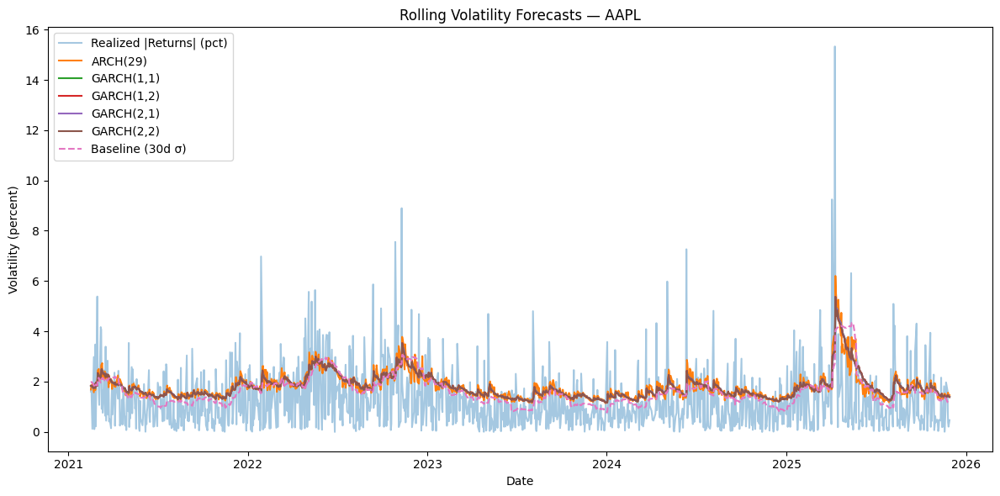

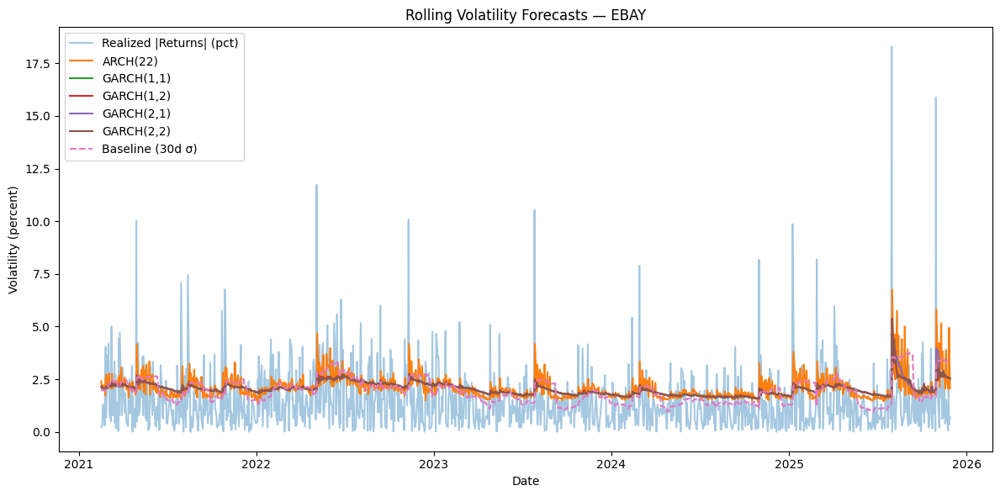

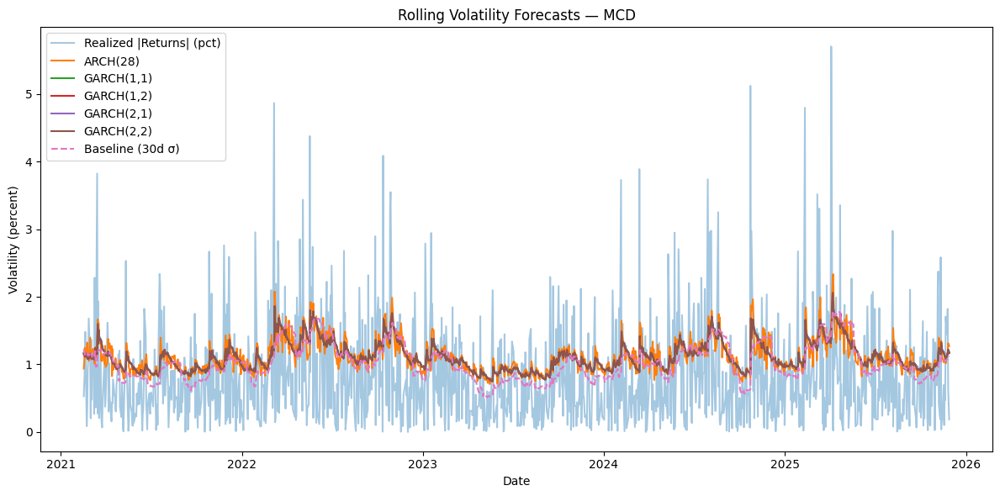

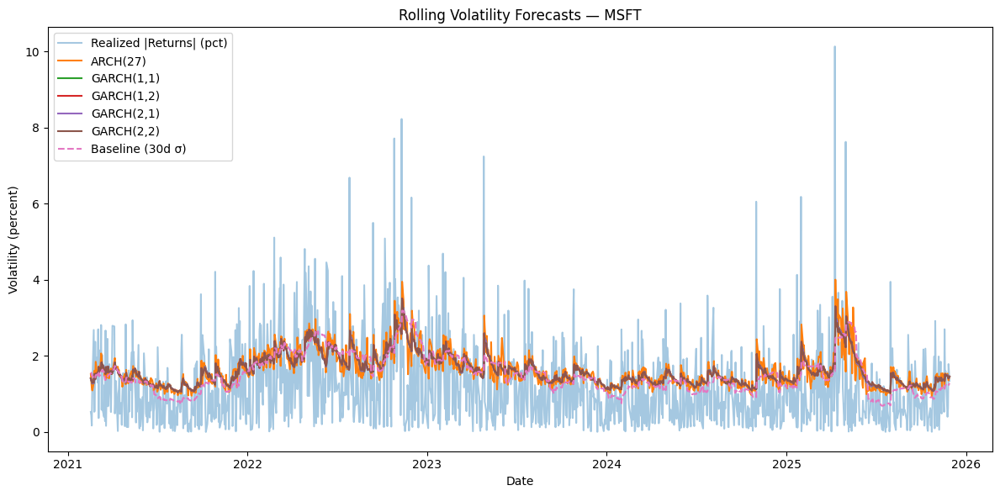

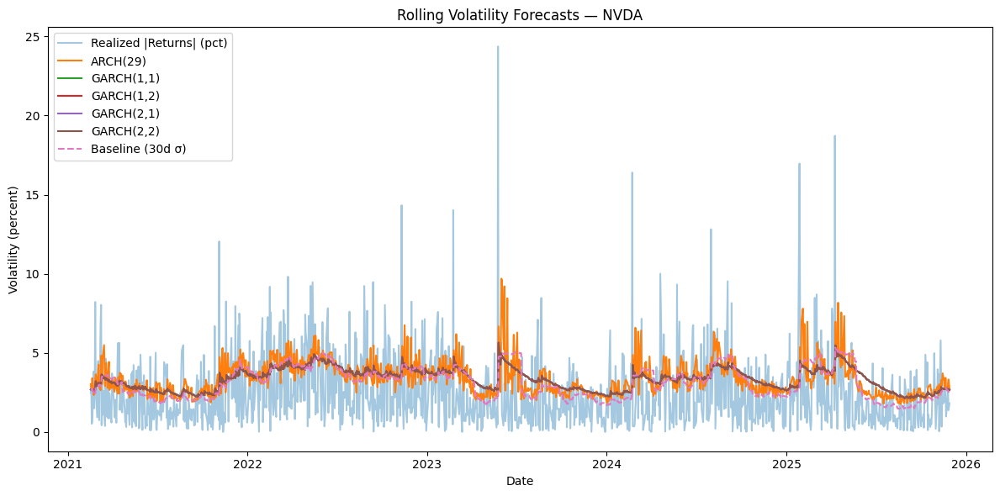

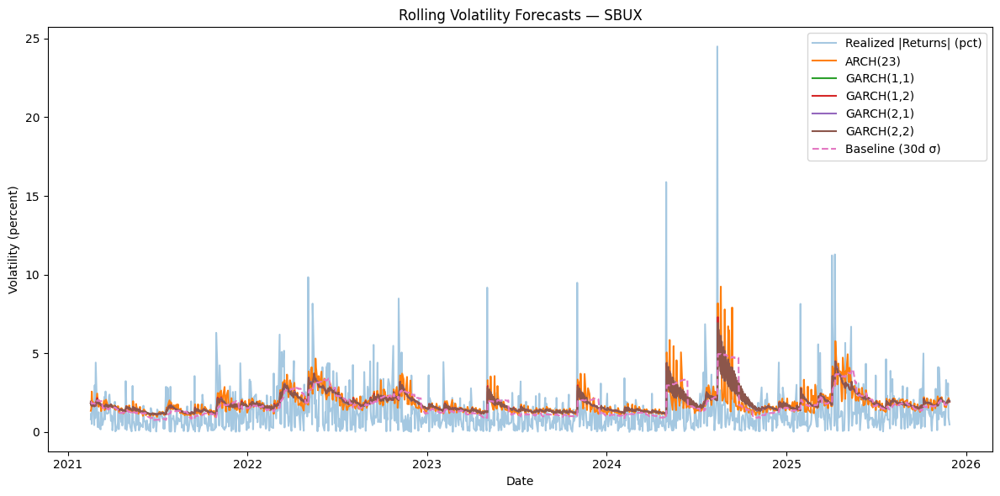

In [ ]:
for example_t in returns_percent_df.columns:
    plt.figure(figsize=(12,6))
    # Realized
    plt.plot(test_idx_all[example_t], realized_all[example_t],
             alpha=0.4, label='Realized |Returns| (pct)')

    # All forecasts ( GARCH,)
    for name, arr in fcasts_all[example_t].items():
        plt.plot(test_idx_all[example_t], arr, label=name)

    # Baseline
    plt.plot(test_idx_all[example_t],
             baseline_all[example_t],
             linestyle='--', label='Baseline (30d σ)')

    plt.title(f'Rolling Volatility Forecasts — {example_t}')
    plt.xlabel('Date')
    plt.ylabel('Volatility (percent)')
    plt.legend()
    plt.tight_layout()
    plt.show()



=== Plots & metrics for AAPL ===


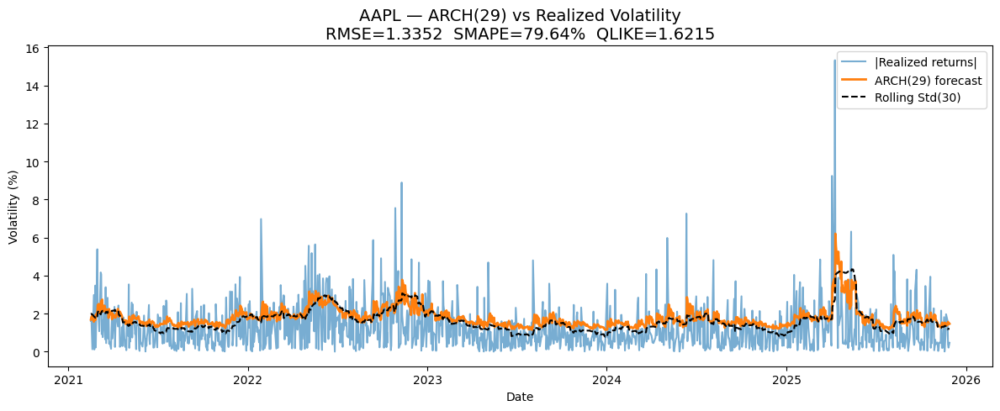

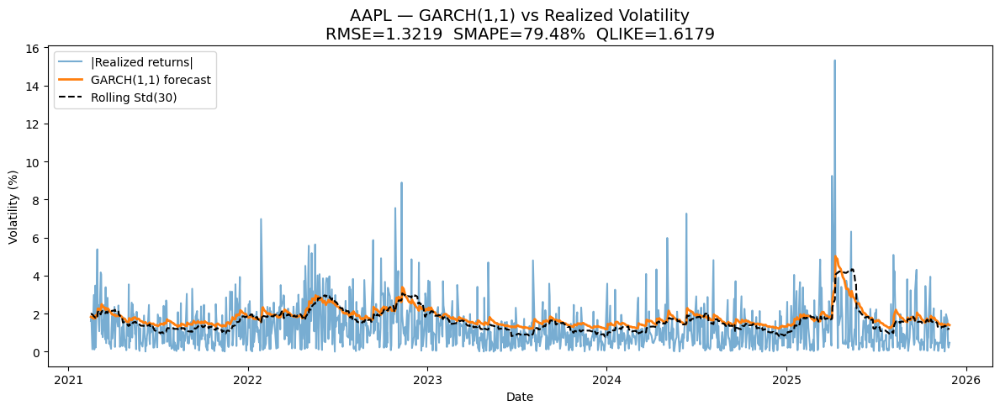

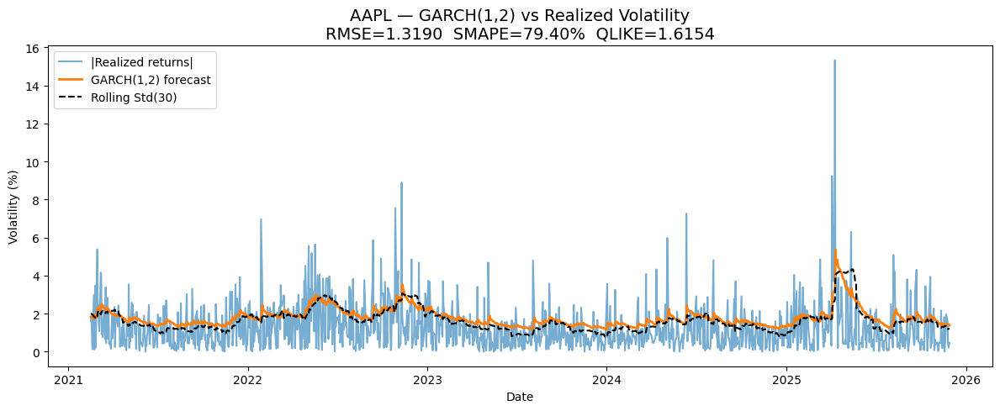

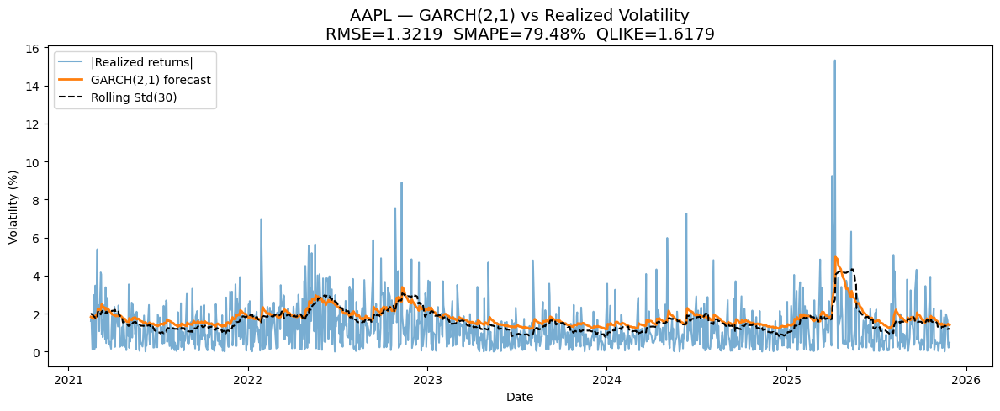

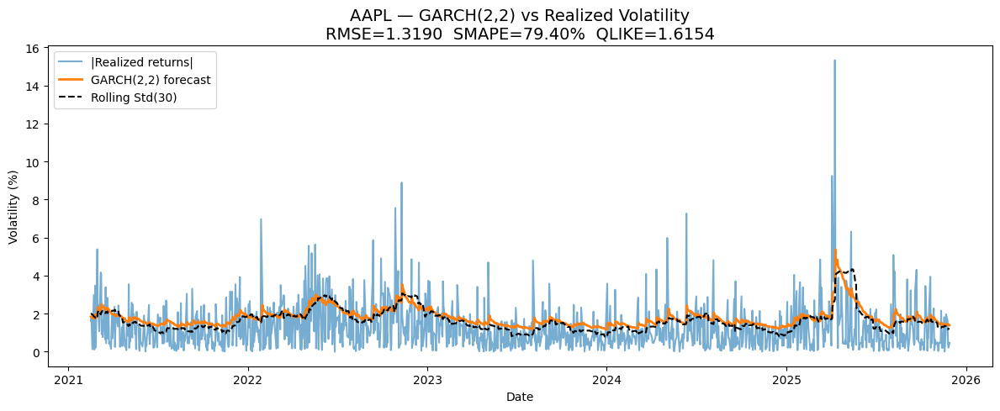


=== Plots & metrics for EBAY ===


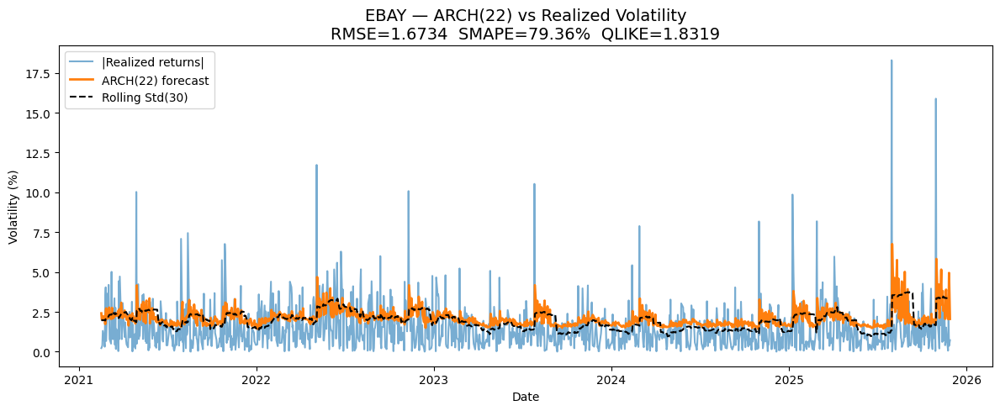

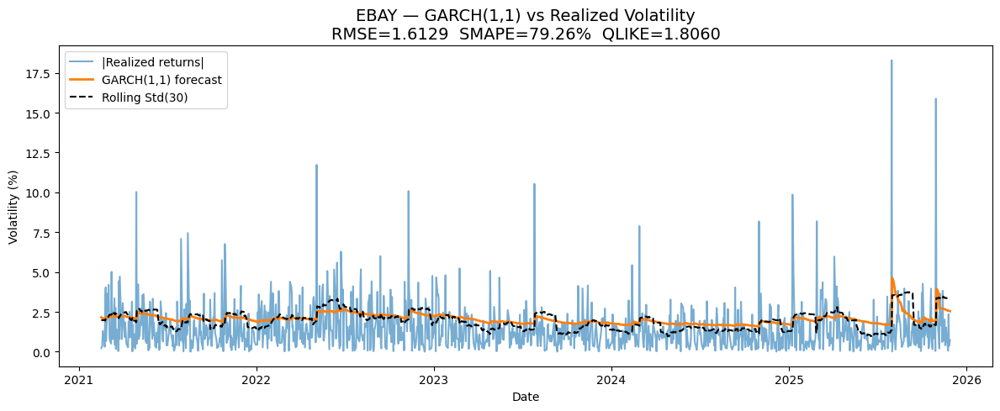

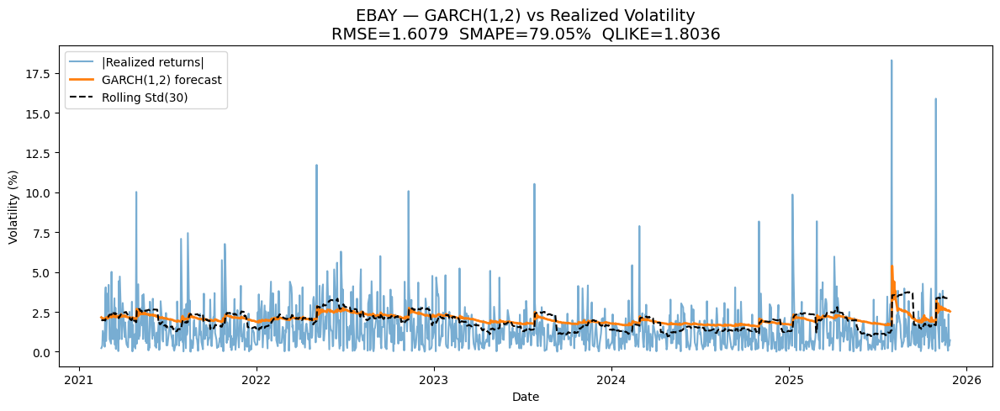

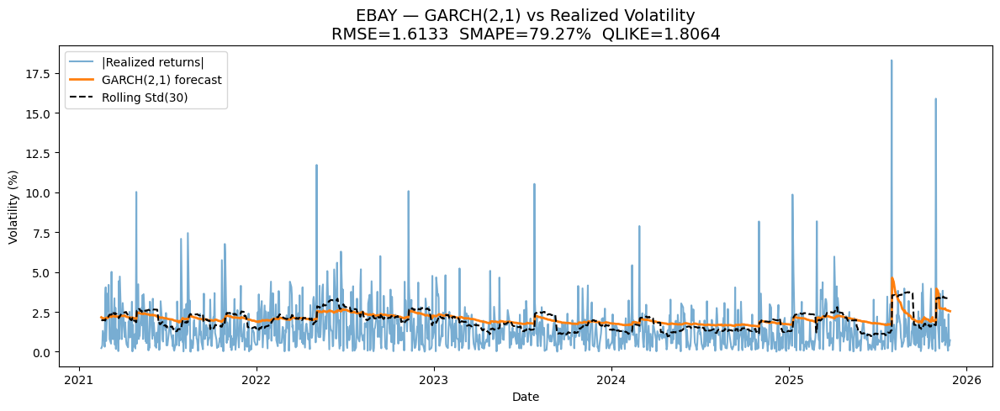

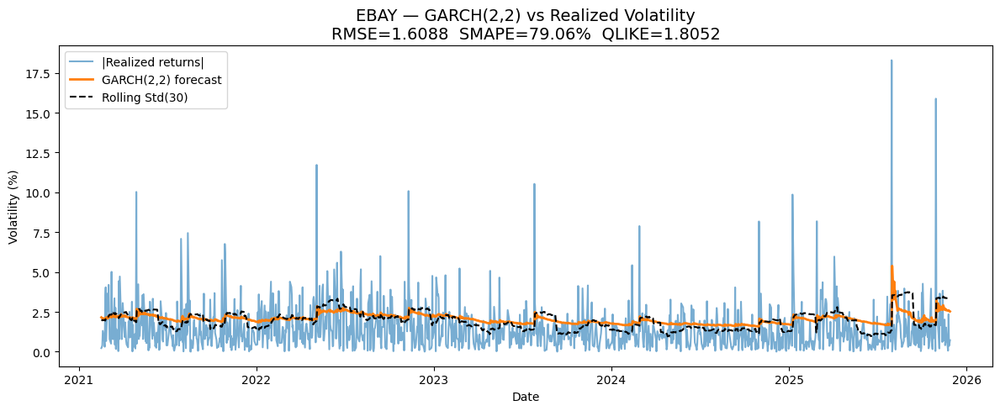


=== Plots & metrics for MCD ===


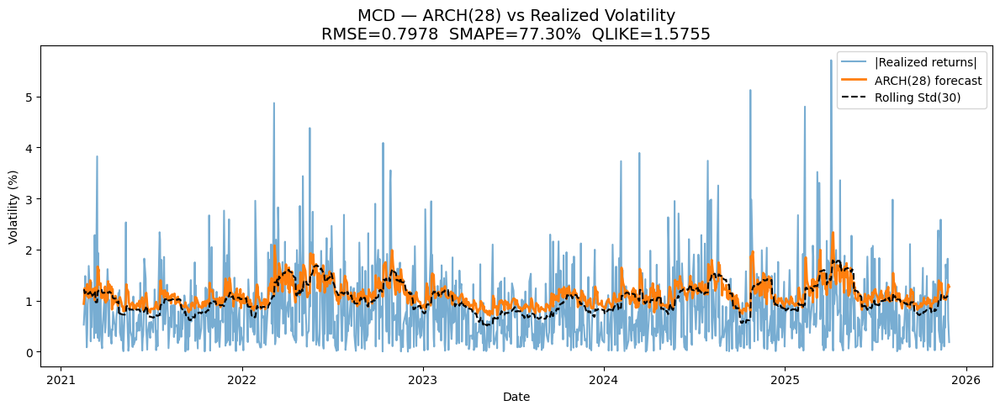

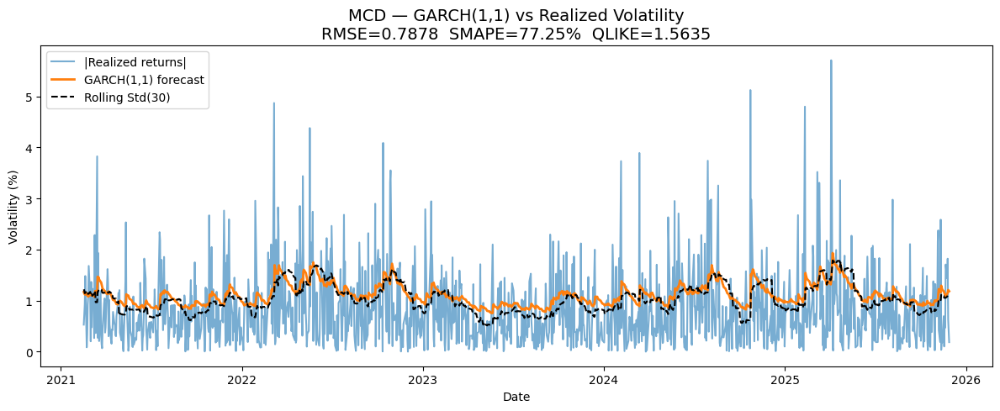

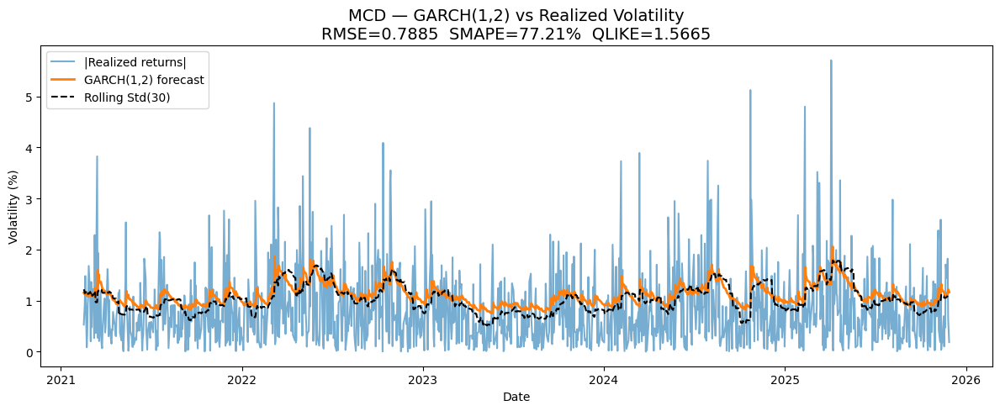

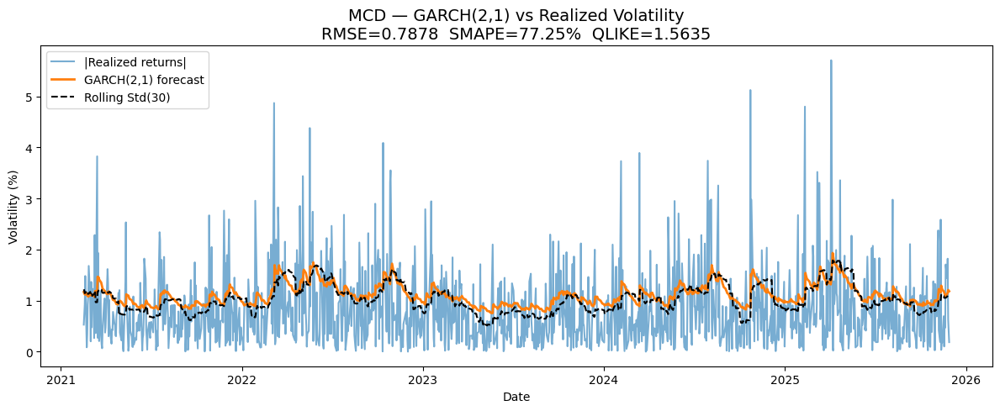

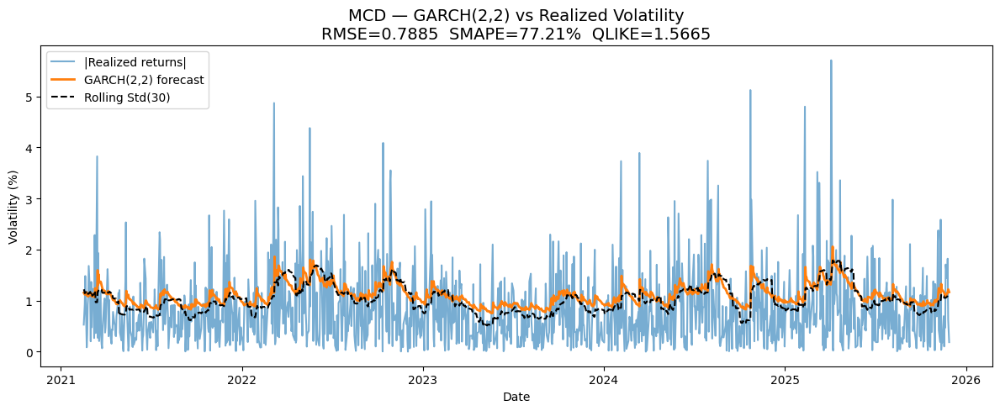


=== Plots & metrics for MSFT ===


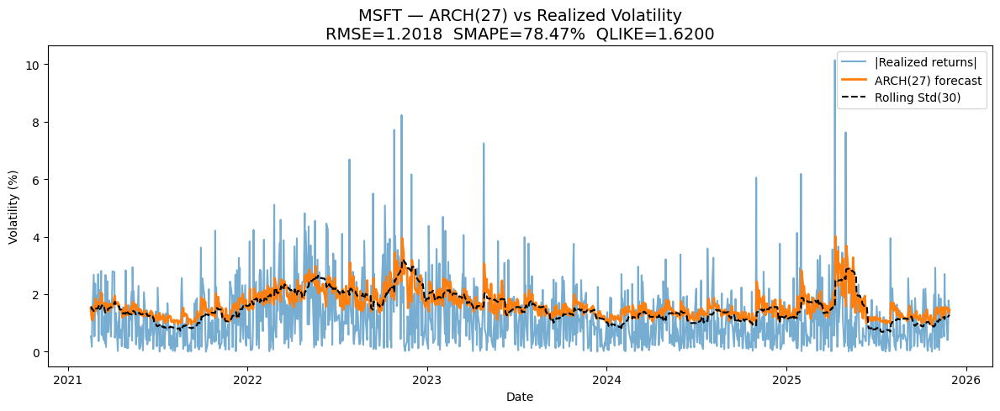

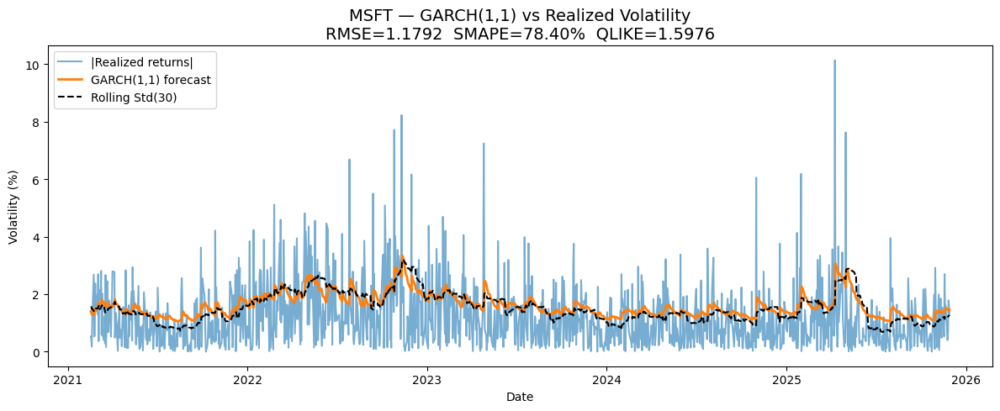

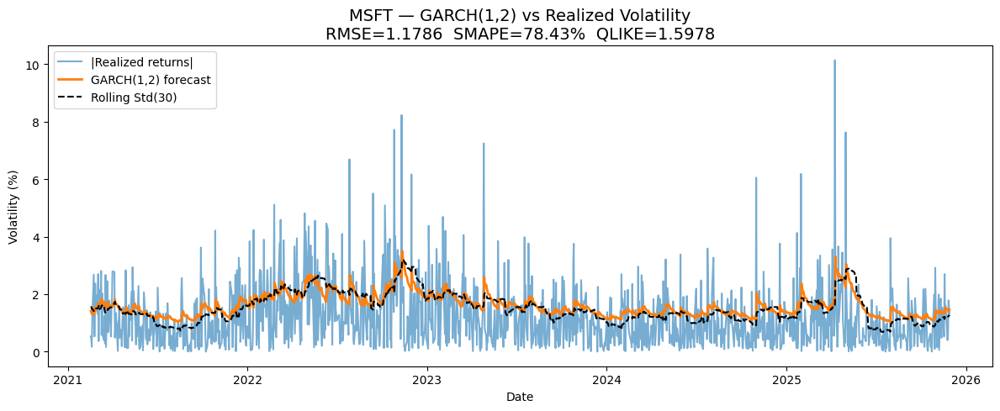

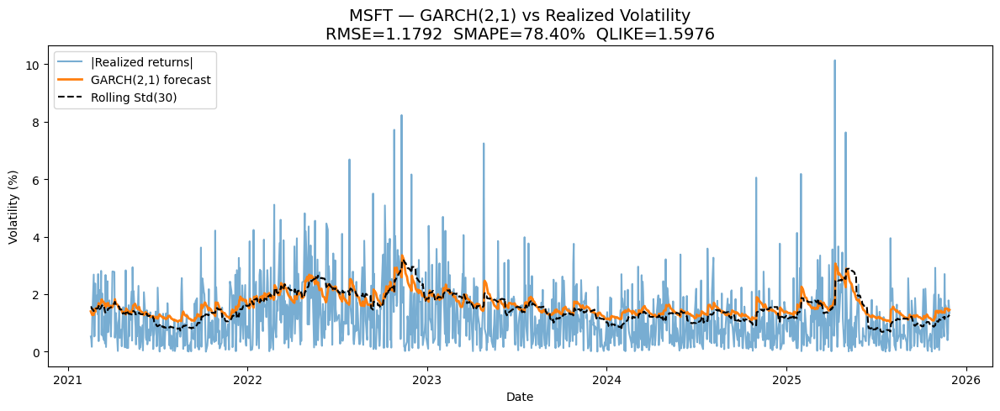

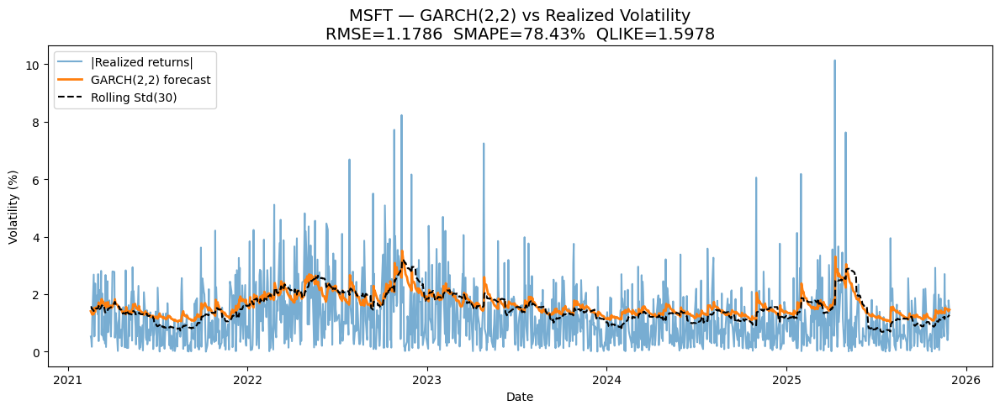


=== Plots & metrics for NVDA ===


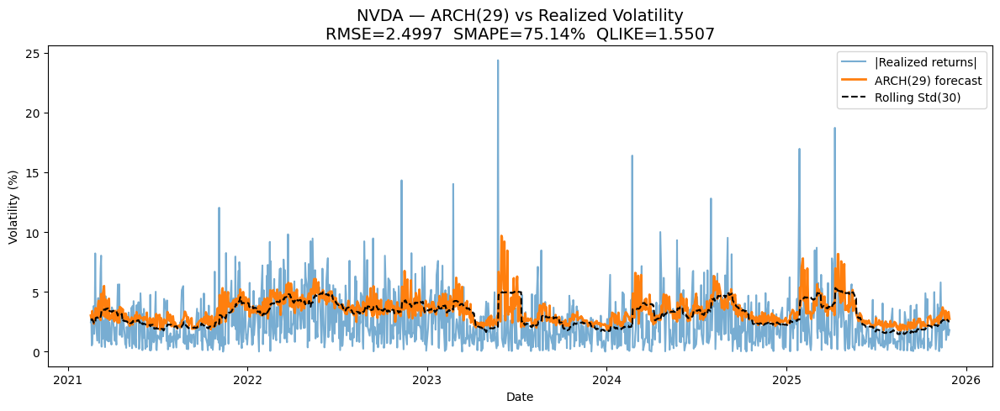

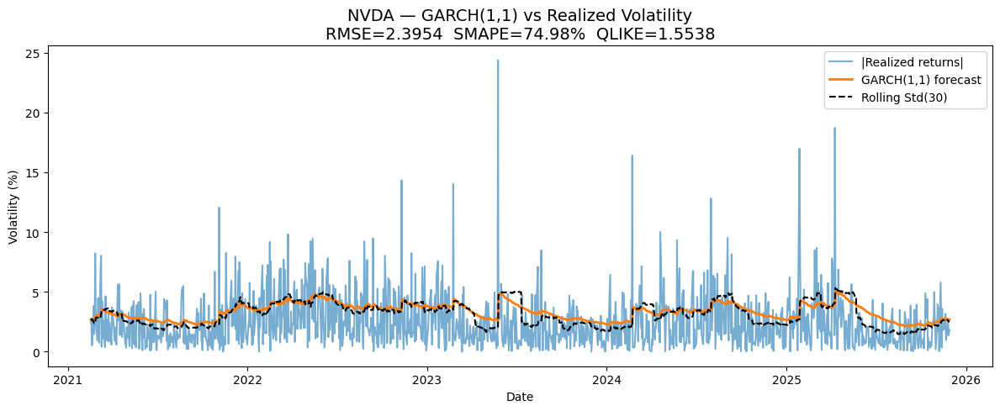

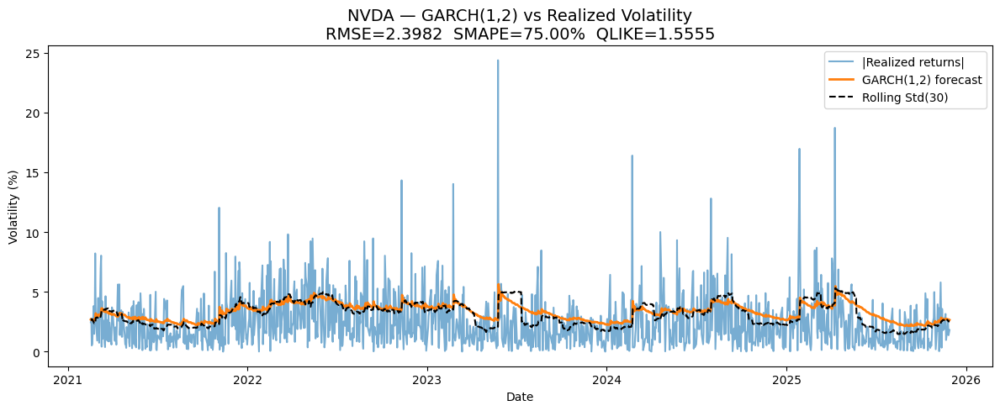

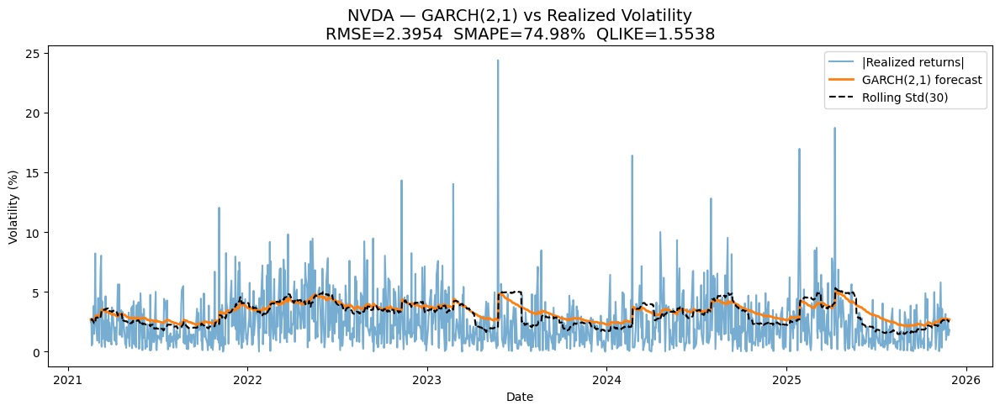

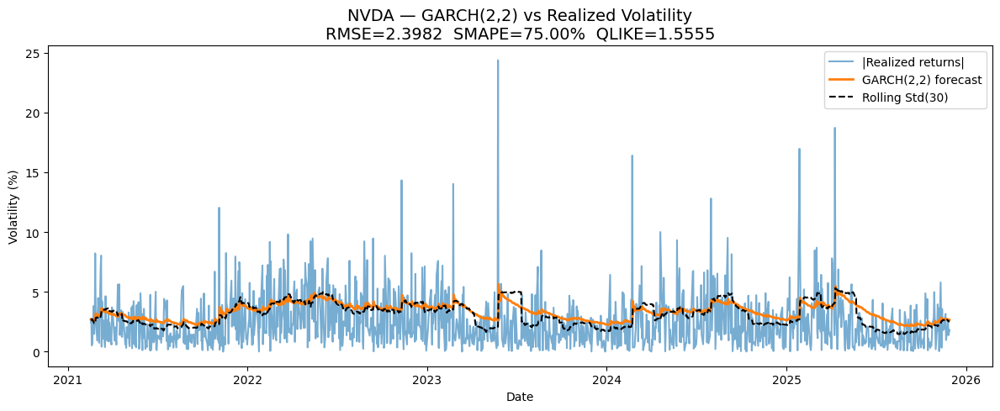


=== Plots & metrics for SBUX ===


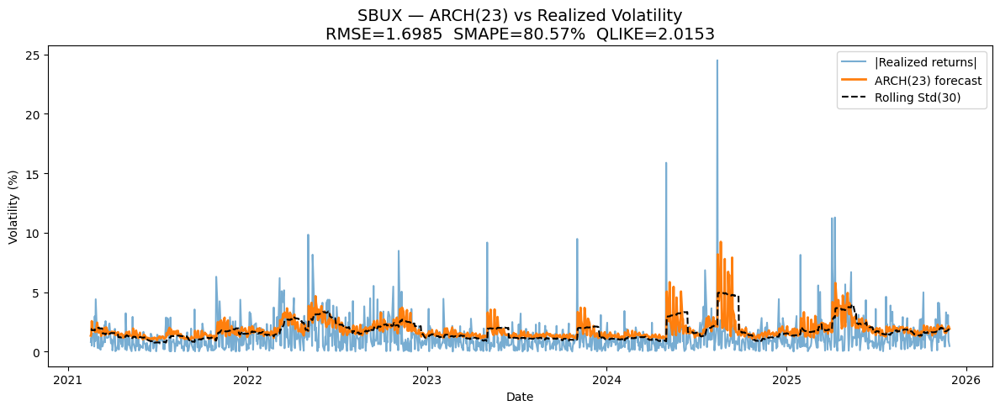

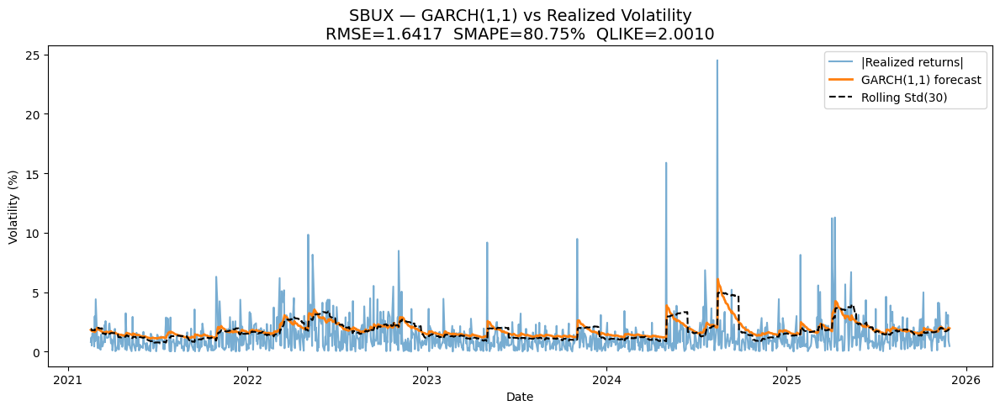

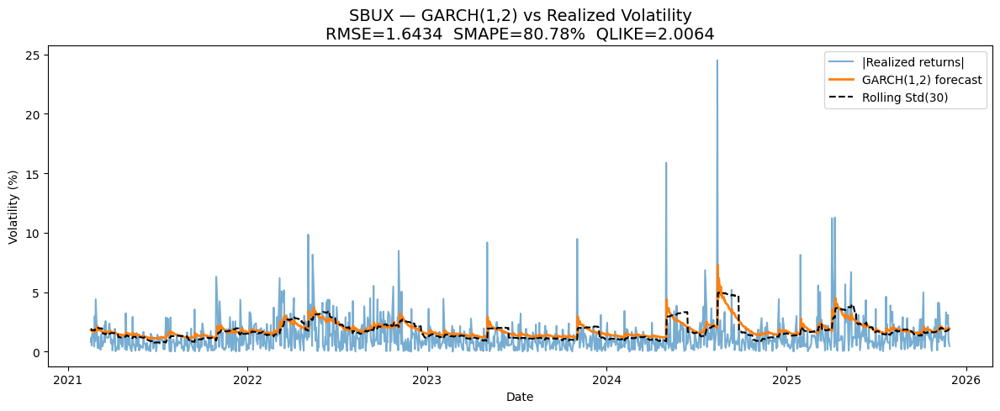

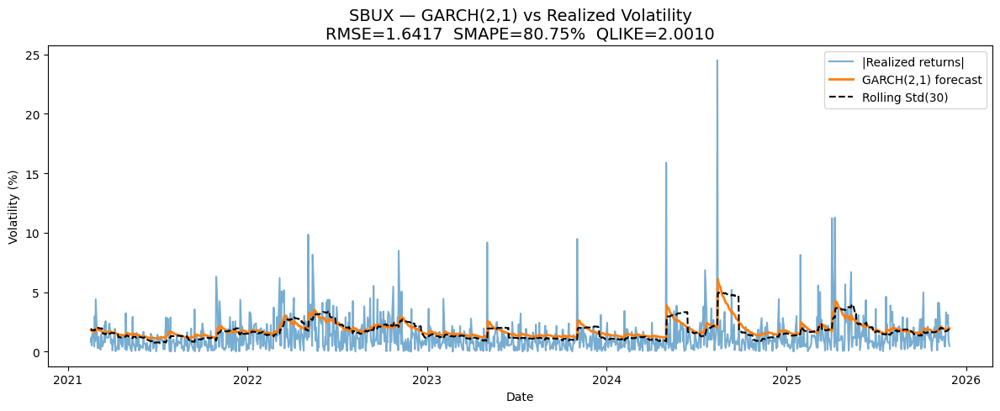

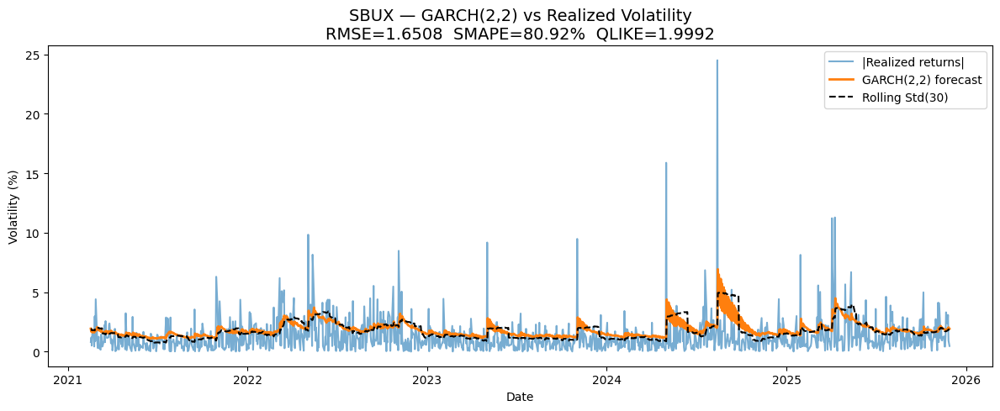

In [ ]:

# --- Robust metrics ---
def smape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = (np.abs(y_true) + np.abs(y_pred)) / 2.0 + eps
    return 100 * np.mean(np.abs(y_true - y_pred) / denom)

def qlike(vol_true, vol_pred, eps=1e-12):
    # Good for volatility/variance forecasting
    v_t = np.square(np.asarray(vol_true)) + eps
    v_p = np.square(np.asarray(vol_pred)) + eps
    r = v_t / v_p
    return np.mean(r - np.log(r) - 1.0)

for t in returns_percent_df.columns:
    print(f"\n=== Plots & metrics for {t} ===")
    y = realized_all[t].values                    # |returns| in percent (test)
    idx = test_idx_all[t]                         # test index
    base = baseline_all[t]                        # 30d baseline (percent)

    for name, yhat in fcasts_all[t].items():      # model -> np.array (percent)
        # Drop NaNs just in case
        mask = ~np.isnan(yhat)
        y_eval   = y[mask]
        yhat_eval = yhat[mask]
        idx_eval  = idx[mask]
        base_eval = base[mask]

        rmse  = np.sqrt(mean_squared_error(y_eval, yhat_eval))
        smape_val = smape(y_eval, yhat_eval)
        qlike_val = qlike(y_eval, yhat_eval)   # optional, but useful for vol

        plt.figure(figsize=(12,5))
        plt.plot(idx_eval, y_eval, label='|Realized returns|', alpha=0.6)
        plt.plot(idx_eval, yhat_eval, label=f'{name} forecast', linewidth=2)
        plt.plot(idx_eval, base_eval, label='Rolling Std(30)',
                 linestyle='--', color='black')

        plt.title(
            f"{t} — {name} vs Realized Volatility\n"
            f"RMSE={rmse:.4f}  SMAPE={smape_val:.2f}%  QLIKE={qlike_val:.4f}",
            fontsize=14
        )
        plt.xlabel("Date"); plt.ylabel("Volatility (%)")
        plt.legend(); plt.tight_layout(); plt.show()


In [ ]:

rows = []
for t in returns_percent_df.columns:
    y = realized_all[t].values                  # |returns| (percent)
    base = np.asarray(baseline_all[t])         # baseline (percent)

    # models
    for name, yhat in fcasts_all[t].items():
        yhat = np.asarray(yhat)
        mask = ~np.isnan(yhat)
        rmse = np.sqrt(mean_squared_error(y[mask], yhat[mask]))
        rows.append({'Ticker': t, 'Model': name, 'RMSE': rmse})

    # baseline
    L = min(len(y), len(base))
    rmse_base = np.sqrt(mean_squared_error(y[:L], base[:L]))
    rows.append({'Ticker': t, 'Model': 'RollingStd(30)', 'RMSE': rmse_base})

perf_df = pd.DataFrame(rows)
# Wide table: one row per ticker, columns = models
perf_wide = perf_df.pivot(index='Ticker', columns='Model', values='RMSE').sort_index()
print("\nRMSE (percent units):")
print(perf_wide.round(6))



RMSE (percent units):
Model   ARCH(22)  ARCH(23)  ARCH(27)  ARCH(28)  ARCH(29)  GARCH(1,1)  \
Ticker                                                                 
AAPL         NaN       NaN       NaN       NaN  1.335193    1.321850   
EBAY    1.673383       NaN       NaN       NaN       NaN    1.612882   
MCD          NaN       NaN       NaN  0.797762       NaN    0.787806   
MSFT         NaN       NaN  1.201777       NaN       NaN    1.179204   
NVDA         NaN       NaN       NaN       NaN  2.499691    2.395436   
SBUX         NaN  1.698458       NaN       NaN       NaN    1.641712   

Model   GARCH(1,2)  GARCH(2,1)  GARCH(2,2)  RollingStd(30)  
Ticker                                                      
AAPL      1.318974    1.321851    1.318974        1.306511  
EBAY      1.607905    1.613340    1.608757        1.646612  
MCD       0.788468    0.787806    0.788467        0.773438  
MSFT      1.178617    1.179204    1.178616        1.170060  
NVDA      2.398190    2.395437    

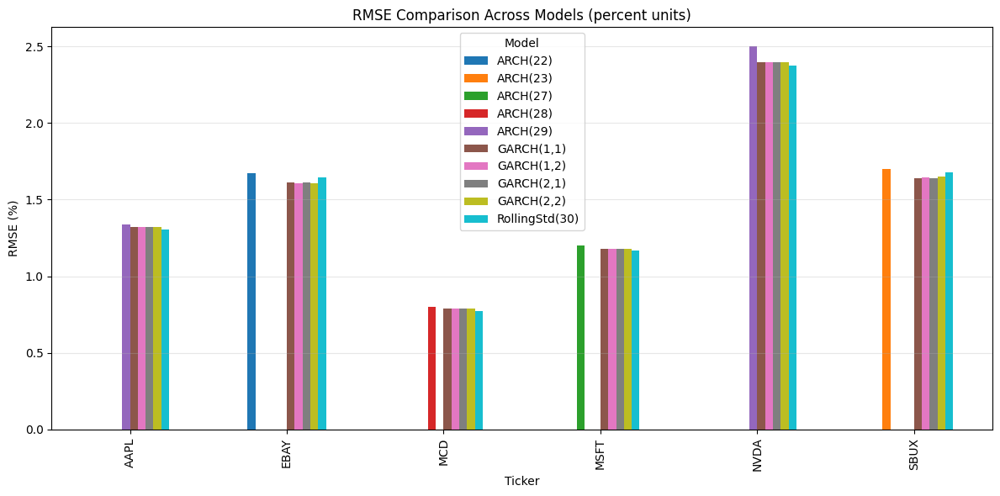

In [ ]:
import matplotlib.pyplot as plt

perf_wide.plot(kind='bar', figsize=(12, 6),)

plt.title('RMSE Comparison Across Models (percent units)')
plt.xlabel('Ticker')
plt.ylabel('RMSE (%)')
plt.grid(axis='y', alpha=0.3)
plt.legend(title='Model')
plt.tight_layout()
plt.show()


# **LSTM VOLITILITY**

In [ ]:
# Uses your returns_percent_df from step 8
vol_targets = {t: returns_percent_df[t].abs().dropna() for t in tickers}


In [ ]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

lookback   = 10
train_frac = 0.80  # match your GARCH split

def make_windows_1feat(arr_2d, L):
    X, y = [], []
    for i in range(L, len(arr_2d)):
        X.append(arr_2d[i-L:i, 0])
        y.append(arr_2d[i, 0])
    return np.array(X).reshape(-1, L, 1), np.array(y).reshape(-1, 1)

Xtr_vol, Ytr_vol = {}, {}
Xte_vol, Yte_vol = {}, {}
scalers_vol      = {}
train_lens_vol   = {}
idx_tests_vol    = {}

for t in tickers:
    y_raw = vol_targets[t].values.reshape(-1,1)     # |r| in percent (>=0)
    scaler = MinMaxScaler((0,1))                    # nonnegative target
    y_sc   = scaler.fit_transform(y_raw)
    scalers_vol[t] = scaler

    N = len(y_sc)
    n_train = max(lookback+1, int(np.floor(train_frac * N)))
    train_lens_vol[t] = n_train

    Xtr, Ytr = make_windows_1feat(y_sc[:n_train, :], lookback)
    Xte, Yte = make_windows_1feat(y_sc[n_train - lookback:, :], lookback)

    Xtr_vol[t], Ytr_vol[t] = Xtr, Ytr
    Xte_vol[t], Yte_vol[t] = Xte, Yte

    # test index aligned to Yte
    idx_tests_vol[t] = vol_targets[t].index[n_train:]
    print(f"{t}: Xtr{Xtr.shape} Ytr{Ytr.shape} | Xte{Xte.shape} Yte{Yte.shape} | N={N}, n_train={n_train}")


AAPL: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
MSFT: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
NVDA: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
EBAY: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
MCD: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
SBUX: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

models_vol = {}

for t in tickers:
    X_tr, Y_tr = Xtr_vol[t], Ytr_vol[t]
    if X_tr.size == 0:
        print(f"{t}: skipped (no train windows)")
        continue

    m = Sequential([
        LSTM(64, input_shape=(lookback,1), return_sequences=False),
        Dropout(0.2),
        Dense(1)  # predict next-day |r|% (scaled)
    ])
    m.compile(optimizer='adam', loss='mse')

    es = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)
    m.fit(X_tr, Y_tr, validation_split=0.1,
          epochs=60, batch_size=64,
          callbacks=[es], shuffle=False, verbose=0)

    models_vol[t] = m
    print(f"{t}: volatility LSTM trained")


AAPL: volatility LSTM trained
MSFT: volatility LSTM trained
NVDA: volatility LSTM trained
EBAY: volatility LSTM trained
MCD: volatility LSTM trained
SBUX: volatility LSTM trained


AAPL: LSTM volatility RMSE (|return|%): 1.202188


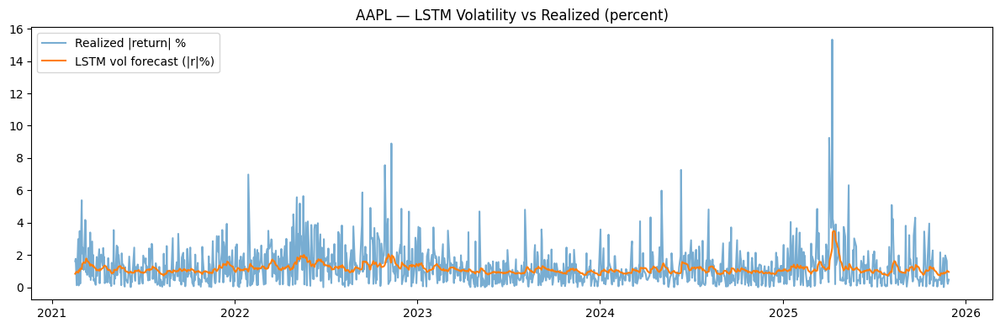

MSFT: LSTM volatility RMSE (|return|%): 1.094611


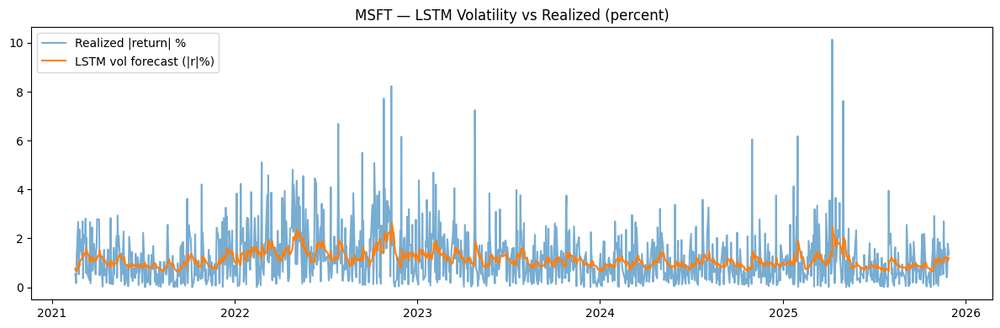

NVDA: LSTM volatility RMSE (|return|%): 2.242446


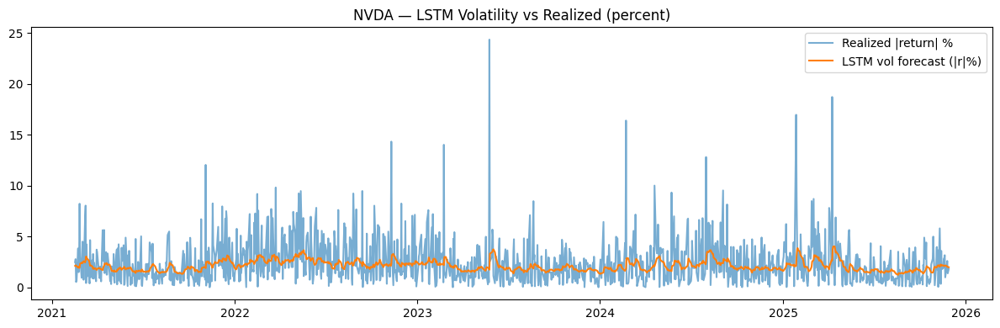

EBAY: LSTM volatility RMSE (|return|%): 1.486530


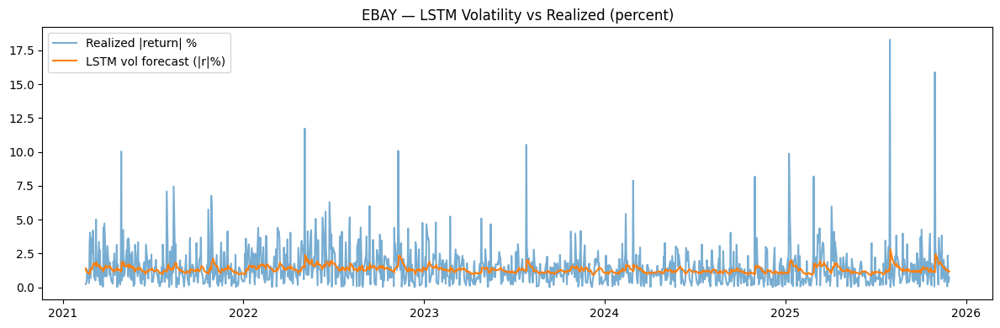

MCD: LSTM volatility RMSE (|return|%): 0.721864


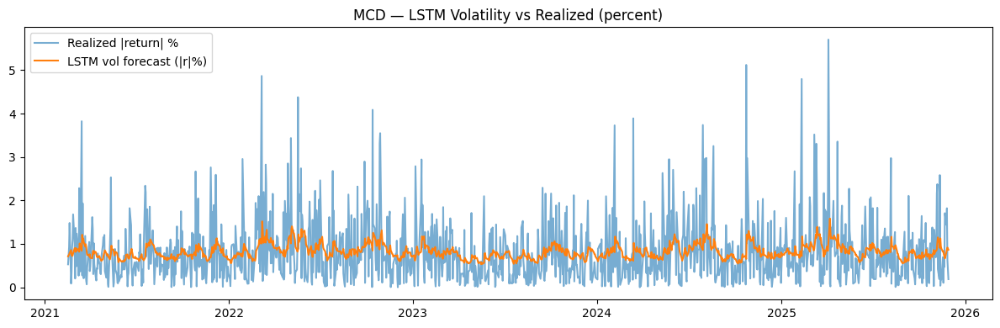

SBUX: LSTM volatility RMSE (|return|%): 1.490109


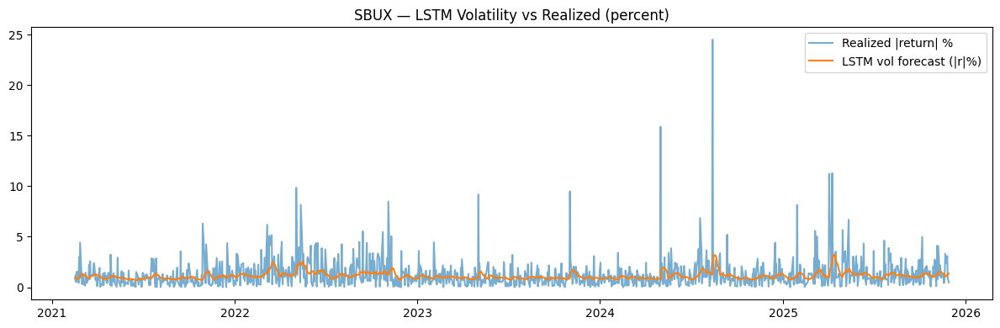


LSTM volatility RMSE (percent units):
AAPL   1.202188
EBAY   1.486530
MCD    0.721864
MSFT   1.094611
NVDA   2.242446
SBUX   1.490109
dtype: float64


In [ ]:
#Predict, inverse-transform to percent units, evaluate vs realized
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd

lstm_vol_pred = {}   # predicted |r|% (percent)
lstm_vol_true = {}
lstm_vol_rmse = {}

for t in tickers:
    if t not in models_vol:
        continue

    X_te, Y_te = Xte_vol[t], Yte_vol[t]
    scaler     = scalers_vol[t]
    idx        = idx_tests_vol[t]

    # predict (scaled) -> inverse to percent
    yhat_sc = models_vol[t].predict(X_te, verbose=0)
    yhat    = scaler.inverse_transform(yhat_sc)
    ytrue   = scaler.inverse_transform(Y_te)

    m = min(len(ytrue), len(yhat))
    yhat, ytrue = yhat[:m], ytrue[:m]
    lstm_vol_pred[t], lstm_vol_true[t] = yhat, ytrue

    rmse = float(np.sqrt(mean_squared_error(ytrue, yhat)))
    lstm_vol_rmse[t] = rmse
    print(f"{t}: LSTM volatility RMSE (|return|%): {rmse:.6f}")

    # quick plot
    plt.figure(figsize=(12,4))
    plt.plot(idx[:m], ytrue[:m], label='Realized |return| %', alpha=0.6)
    plt.plot(idx[:m], yhat[:m],  label='LSTM vol forecast (|r|%)', linewidth=1.5)
    plt.title(f"{t} — LSTM Volatility vs Realized (percent)")
    plt.legend(); plt.tight_layout(); plt.show()

print("\nLSTM volatility RMSE (percent units):")
print(pd.Series(lstm_vol_rmse).sort_index().round(6))



Volatility RMSE comparison (percent units):
       Best_GARCH_Name  Best_GARCH_RMSE  LSTM_vol_RMSE  RollingStd30_RMSE
Ticker                                                                   
AAPL        GARCH(1,2)         1.318974       1.202188           1.306511
EBAY        GARCH(1,2)         1.607905       1.486530           1.646612
MCD         GARCH(1,1)         0.787806       0.721864           0.773438
MSFT        GARCH(2,2)         1.178616       1.094611           1.170060
NVDA        GARCH(1,1)         2.395436       2.242446           2.376768
SBUX        GARCH(2,1)         1.641710       1.490109           1.678181

Improvements (%): positive means LSTM better
        LSTM_vs_BestGARCH_impr_%  LSTM_vs_Baseline_impr_%
Ticker                                                   
AAPL                    8.850000                 7.980000
EBAY                    7.550000                 9.720000
MCD                     8.370000                 6.670000
MSFT                    7.1

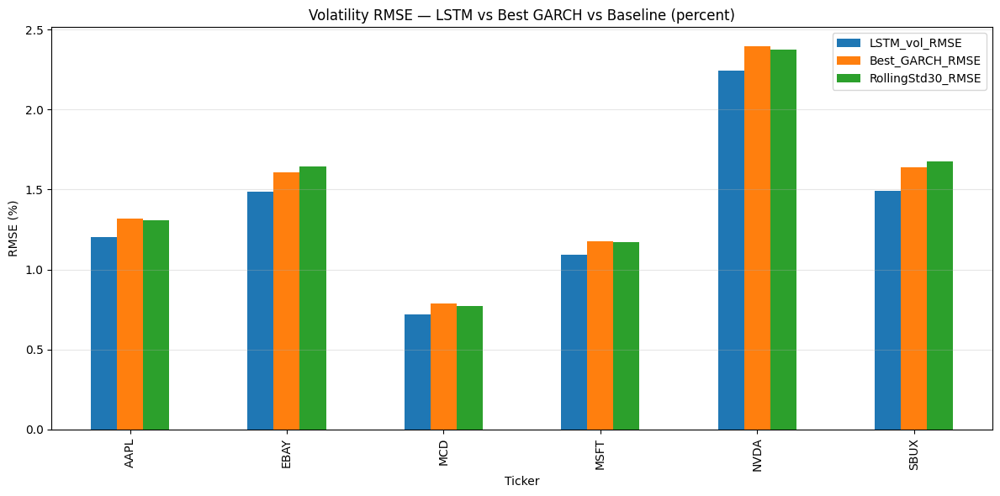

AAPL: Best GARCH = GARCH(1,2) (RMSE=1.318974)
EBAY: Best GARCH = GARCH(1,2) (RMSE=1.607905)
MCD: Best GARCH = GARCH(1,1) (RMSE=0.787806)
MSFT: Best GARCH = GARCH(2,2) (RMSE=1.178616)
NVDA: Best GARCH = GARCH(1,1) (RMSE=2.395436)
SBUX: Best GARCH = GARCH(2,1) (RMSE=1.641710)


In [ ]:
# === Build a clean comparison table ===
rows = []
for t in tickers:
    # Best GARCH for this ticker
    best_name, best_rmse = None, np.inf
    if t in fcasts_all:
        y_true = realized_all[t].values
        for name, yhat in fcasts_all[t].items():
            yhat = np.asarray(yhat)
            m = min(len(y_true), len(yhat))
            rmse_g = float(np.sqrt(mean_squared_error(y_true[:m], yhat[:m])))
            if rmse_g < best_rmse:
                best_rmse, best_name = rmse_g, name

    # Baseline
    y_true = realized_all[t].values
    base   = np.asarray(baseline_all[t])
    m2 = min(len(base), len(y_true))
    rmse_b = float(np.sqrt(mean_squared_error(y_true[:m2], base[:m2])))

    # LSTM vol (may be missing if not trained)
    rmse_lstm = lstm_vol_rmse.get(t, np.nan)

    rows.append({
        "Ticker": t,
        "Best_GARCH_Name": best_name,
        "Best_GARCH_RMSE": best_rmse,
        "LSTM_vol_RMSE": rmse_lstm,
        "RollingStd30_RMSE": rmse_b
    })

comp = pd.DataFrame(rows).set_index("Ticker").sort_index()
print("\nVolatility RMSE comparison (percent units):")
print(comp.round(6))

# === Optional: show % improvement of LSTM over best GARCH and baseline ===
comp["LSTM_vs_BestGARCH_impr_%"] = 100.0 * (comp["Best_GARCH_RMSE"] - comp["LSTM_vol_RMSE"]) / comp["Best_GARCH_RMSE"]
comp["LSTM_vs_Baseline_impr_%"] = 100.0 * (comp["RollingStd30_RMSE"] - comp["LSTM_vol_RMSE"]) / comp["RollingStd30_RMSE"]
print("\nImprovements (%): positive means LSTM better")
print(comp[["LSTM_vs_BestGARCH_impr_%", "LSTM_vs_Baseline_impr_%"]].round(2))

# === Bar plot with 3 comparable bars per ticker ===
ax = comp[["LSTM_vol_RMSE","Best_GARCH_RMSE","RollingStd30_RMSE"]].plot(kind="bar", figsize=(12,6))
ax.set_title("Volatility RMSE — LSTM vs Best GARCH vs Baseline (percent)")
ax.set_xlabel("Ticker"); ax.set_ylabel("RMSE (%)")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout(); plt.show()

# === (Optional) annotate which GARCH won per ticker ===
for t, row in comp.iterrows():
    print(f"{t}: Best GARCH = {row['Best_GARCH_Name']} (RMSE={row['Best_GARCH_RMSE']:.6f})")


In [ ]:
comp = pd.DataFrame(rows).set_index("Ticker").sort_index()
print(comp.round(6))


       Best_GARCH_Name  Best_GARCH_RMSE  LSTM_vol_RMSE  RollingStd30_RMSE
Ticker                                                                   
AAPL        GARCH(1,2)         1.318974       1.202188           1.306511
EBAY        GARCH(1,2)         1.607905       1.486530           1.646612
MCD         GARCH(1,1)         0.787806       0.721864           0.773438
MSFT        GARCH(2,2)         1.178616       1.094611           1.170060
NVDA        GARCH(1,1)         2.395436       2.242446           2.376768
SBUX        GARCH(2,1)         1.641710       1.490109           1.678181


In [ ]:
# === 1) Dict: best GARCH model name per ticker, from 'comp' ===
# comp.index = tickers; comp["Best_GARCH_Name"] = e.g. "GARCH(2,1)"

best_garch_name = comp["Best_GARCH_Name"].to_dict()
print("Best GARCH per ticker:")
for t, name in best_garch_name.items():
    print(f"{t}: {name}")


Best GARCH per ticker:
AAPL: GARCH(1,2)
EBAY: GARCH(1,2)
MCD: GARCH(1,1)
MSFT: GARCH(2,2)
NVDA: GARCH(1,1)
SBUX: GARCH(2,1)


# **HYBRID MODEL Y^=Weight* LSTM+weight*Garch**

Option A — Convex blend (simple & robust) Constraint weights to a convex combo:
w∈[0,1], 𝑣=𝑤⋅𝑣^LSTM+(1−𝑤)⋅𝑣^GARCH Pick 𝑤 that minimises MSE on a fit slice (first 30% of your test window), then evaluate on the remaining 70%.

In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

hybrid_info = {}  # store weights & RMSEs per ticker

def align_three(idx_lstm, yhat_lstm, idx_garch, yhat_garch, y_true_series):
    df = pd.DataFrame(
        {"lstm": np.asarray(yhat_lstm).ravel()},
        index=idx_lstm
    ).join(
        pd.DataFrame({"garch": np.asarray(yhat_garch).ravel()}, index=idx_garch),
        how="inner"
    ).join(
        y_true_series.rename("y_true"),
        how="inner"
    ).dropna()

    return (
        df.index,
        df["y_true"].values.reshape(-1, 1),
        df["lstm"].values.reshape(-1, 1),
        df["garch"].values.reshape(-1, 1),
    )

def choose_w_grid(y_fit, x1_fit, x2_fit, step=0.01):
    best_w, best_rmse = 0.5, np.inf
    for w in np.arange(0.0, 1.0 + step/2, step):
        yhat = w * x1_fit + (1.0 - w) * x2_fit
        rmse = float(np.sqrt(mean_squared_error(y_fit, yhat)))
        if rmse < best_rmse:
            best_rmse, best_w = rmse, float(w)
    return best_w, 1.0 - best_w, best_rmse


for t in tickers:
    # --- LSTM pieces (volatility) ---
    if t not in lstm_vol_pred:
        print(f"{t}: no LSTM-vol — skipping")
        continue
    idx_lstm  = idx_tests_vol[t]      # test indices for LSTM
    yhat_lstm = lstm_vol_pred[t]      # LSTM vol forecasts

    # --- choose best GARCH model name for this ticker ---
    garch_name = best_garch_name.get(t, None)
    if garch_name is None:
        print(f"{t}: no Best_GARCH_Name in comp — skipping")
        continue

    # --- GARCH forecast (percent) & dates ---
    if t not in fcasts_all or garch_name not in fcasts_all[t]:
        print(f"{t}: no {garch_name} forecasts stored for {t} — skipping")
        continue
    idx_garch  = test_idx_all[t]              # GARCH test index
    yhat_garch = fcasts_all[t][garch_name]    # GARCH(p,q) vol forecasts

    # --- Realized target (|return| in percent) ---
    y_true_ser = realized_all[t]

    # --- Align on common dates ---
    dates, y_true, x_lstm, x_garch = align_three(
        idx_lstm, yhat_lstm, idx_garch, yhat_garch, y_true_ser
    )
    m = len(dates)
    if m < 50:
        print(f"{t}: too few aligned points ({m}) — skipping")
        continue

    # --- Split aligned test data into fit / eval (no leakage) ---
    k = max(10, int(0.30 * m))   # ~30% for weight estimation, rest for evaluation

    y_fit,  y_eval   = y_true[:k],  y_true[k:]
    x_lstm_fit, x_lstm_ev = x_lstm[:k],  x_lstm[k:]
    x_garc_fit, x_garc_ev = x_garch[:k], x_garch[k:]

    # --- Find convex weights on the fit slice ---
    w_lstm, w_garch, rmse_fit = choose_w_grid(
        y_fit, x_lstm_fit, x_garc_fit, step=0.01
    )

    # --- Evaluate on evaluation slice ---
    rmse_lstm  = float(np.sqrt(mean_squared_error(y_eval, x_lstm_ev)))
    rmse_garch = float(np.sqrt(mean_squared_error(y_eval, x_garc_ev)))
    yhyb_ev    = w_lstm * x_lstm_ev + w_garch * x_garc_ev
    rmse_hyb   = float(np.sqrt(mean_squared_error(y_eval, yhyb_ev)))

    hybrid_info[t] = {
        "Best_GARCH_Name": garch_name,
        "w_lstm": w_lstm,
        "w_garch": w_garch,
        "rmse_fit": rmse_fit,
        "rmse_eval_lstm": rmse_lstm,
        "rmse_eval_garch": rmse_garch,
        "rmse_eval_hybrid": rmse_hyb,
    }

    print(
        f"{t}: Best GARCH={garch_name}, "
        f"w_lstm={w_lstm:.2f}, w_garch={w_garch:.2f} | "
        f"eval RMSE — LSTM {rmse_lstm:.4f}, GARCH {rmse_garch:.4f}, HYBRID {rmse_hyb:.4f}"
    )


AAPL: Best GARCH=GARCH(1,2), w_lstm=0.66, w_garch=0.34 | eval RMSE — LSTM 1.2294, GARCH 1.3672, HYBRID 1.2310
MSFT: Best GARCH=GARCH(2,2), w_lstm=0.73, w_garch=0.27 | eval RMSE — LSTM 1.1206, GARCH 1.2176, HYBRID 1.1229
NVDA: Best GARCH=GARCH(1,1), w_lstm=0.56, w_garch=0.44 | eval RMSE — LSTM 2.2880, GARCH 2.4861, HYBRID 2.2823
EBAY: Best GARCH=GARCH(1,2), w_lstm=0.66, w_garch=0.34 | eval RMSE — LSTM 1.4603, GARCH 1.6080, HYBRID 1.4695
MCD: Best GARCH=GARCH(1,1), w_lstm=0.97, w_garch=0.03 | eval RMSE — LSTM 0.7250, GARCH 0.7924, HYBRID 0.7252
SBUX: Best GARCH=GARCH(2,1), w_lstm=0.75, w_garch=0.25 | eval RMSE — LSTM 1.5835, GARCH 1.7574, HYBRID 1.5865


In [ ]:
hybrid_df = pd.DataFrame(hybrid_info).T  # index = ticker
hybrid_df = hybrid_df[
    ["Best_GARCH_Name", "w_lstm", "w_garch",
     "rmse_eval_lstm", "rmse_eval_garch", "rmse_eval_hybrid"]
].sort_index()

print("\nHybrid LSTM + Best GARCH results (RMSE in percent units):")
print(hybrid_df.round(6))



Hybrid LSTM + Best GARCH results (RMSE in percent units):
     Best_GARCH_Name   w_lstm  w_garch rmse_eval_lstm rmse_eval_garch  \
AAPL      GARCH(1,2) 0.660000 0.340000       1.229432        1.367195   
EBAY      GARCH(1,2) 0.660000 0.340000       1.460285        1.607965   
MCD       GARCH(1,1) 0.970000 0.030000       0.725024        0.792420   
MSFT      GARCH(2,2) 0.730000 0.270000       1.120551        1.217583   
NVDA      GARCH(1,1) 0.560000 0.440000       2.287969        2.486096   
SBUX      GARCH(2,1) 0.750000 0.250000       1.583467        1.757423   

     rmse_eval_hybrid  
AAPL         1.231027  
EBAY         1.469475  
MCD          0.725187  
MSFT         1.122912  
NVDA         2.282287  
SBUX         1.586515  


In [ ]:
hybrid_df["Hybrid_vs_LSTM_impr_%"]  = 100.0 * (hybrid_df["rmse_eval_lstm"]  - hybrid_df["rmse_eval_hybrid"]) / hybrid_df["rmse_eval_lstm"]
hybrid_df["Hybrid_vs_GARCH_impr_%"] = 100.0 * (hybrid_df["rmse_eval_garch"] - hybrid_df["rmse_eval_hybrid"]) / hybrid_df["rmse_eval_garch"]

print("\nImprovements of Hybrid over components (%):")
print(hybrid_df[["Hybrid_vs_LSTM_impr_%", "Hybrid_vs_GARCH_impr_%"]].round(2))



Improvements of Hybrid over components (%):
     Hybrid_vs_LSTM_impr_% Hybrid_vs_GARCH_impr_%
AAPL             -0.129747               9.959644
EBAY             -0.629330               8.612775
MCD              -0.022432               8.484577
MSFT             -0.210700               7.775335
NVDA              0.248322               8.197933
SBUX             -0.192510               9.724886


<Figure size 1400x700 with 0 Axes>

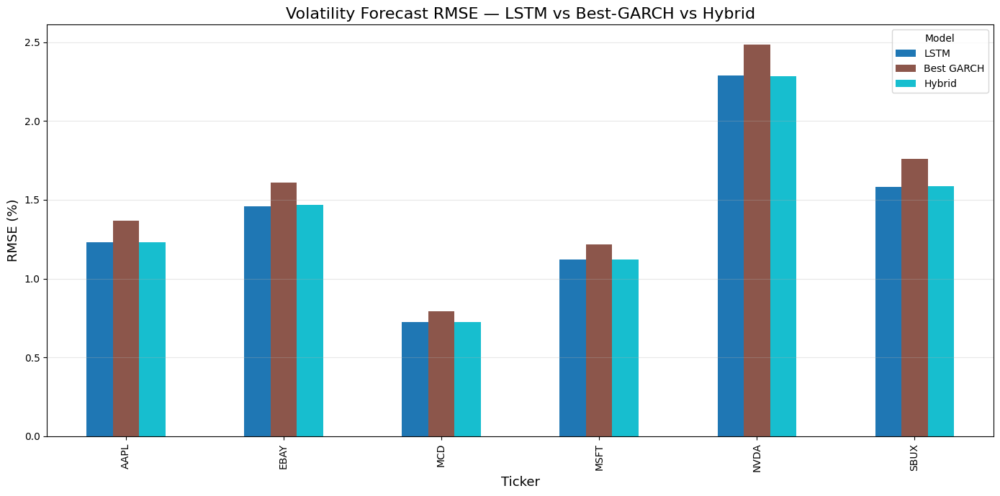

In [ ]:

plt.figure(figsize=(14, 7))

hybrid_df[[
    "rmse_eval_lstm",
    "rmse_eval_garch",
    "rmse_eval_hybrid"
]].plot(
    kind="bar",
    figsize=(14, 7),
    colormap="tab10"
)

plt.title("Volatility Forecast RMSE — LSTM vs Best-GARCH vs Hybrid", fontsize=16)
plt.xlabel("Ticker", fontsize=13)
plt.ylabel("RMSE (%)", fontsize=13)
plt.grid(axis='y', alpha=0.3)
plt.legend(["LSTM", "Best GARCH", "Hybrid"], title="Model")
plt.tight_layout()
plt.show()


**Simple linear regression **v^thyb​=β1​⋅v^tLSTM​+β2​⋅v^tGARCH​

---



In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

hybrid_info_ols = {}

for t in tickers:

    # ---- 1. Check LSTM ----
    if t not in lstm_vol_pred:
        print(f"{t}: no LSTM-vol — skipping")
        continue

    # ---- 2. Best GARCH per ticker ----
    garch_name = best_garch_name.get(t, None)
    if garch_name is None:
        print(f"{t}: no Best_GARCH for {t} — skipping")
        continue

    if t not in fcasts_all or garch_name not in fcasts_all[t]:
        print(f"{t}: no {garch_name} forecasts for {t} — skipping")
        continue

    # ---- 3. Extract series ----
    idx_lstm   = idx_tests_vol[t]
    yhat_lstm  = lstm_vol_pred[t]
    idx_garch  = test_idx_all[t]
    yhat_garch = fcasts_all[t][garch_name]
    y_true_ser = realized_all[t]

    # ---- 4. Align (intersection of dates) ----
    dates, y_true, x1, x2 = align_three(
        idx_lstm, yhat_lstm,
        idx_garch, yhat_garch,
        y_true_ser
    )

    m = len(dates)
    if m < 50:
        print(f"{t}: too few data points ({m}) — skipping")
        continue

    # ---- 5. Train/test splitting ----
    k = max(10, int(m * 0.30))  # 30% fit / 70% eval

    X_fit = np.hstack([x1[:k], x2[:k]])
    y_fit = y_true[:k]

    X_ev  = np.hstack([x1[k:], x2[k:]])
    y_ev  = y_true[k:]

    # ---- 6. Fit simple Linear Regression (no intercept) ----
    lr = LinearRegression(fit_intercept=False)
    lr.fit(X_fit, y_fit.ravel())

    b1, b2 = float(lr.coef_[0]), float(lr.coef_[1])

    # ---- 7. Evaluate Models ----
    # LSTM only
    rmse_l = float(np.sqrt(mean_squared_error(y_ev, x1[k:])))
    # GARCH only
    rmse_g = float(np.sqrt(mean_squared_error(y_ev, x2[k:])))
    # Hybrid prediction
    yhat_h = X_ev @ np.array([b1, b2]).reshape(-1, 1)
    rmse_h = float(np.sqrt(mean_squared_error(y_ev, yhat_h)))

    # ---- 8. Store ----
    hybrid_info_ols[t] = {
        "Best_GARCH_Name": garch_name,
        "b_lstm": b1,
        "b_garch": b2,
        "rmse_eval_lstm": rmse_l,
        "rmse_eval_garch": rmse_g,
        "rmse_eval_hybrid": rmse_h
    }

    print(f"{t}: OLS β_lstm={b1:.3f}, β_garch={b2:.3f} | RMSE — LSTM {rmse_l:.4f}, GARCH {rmse_g:.4f}, HYBRID {rmse_h:.4f}")


AAPL: OLS β_lstm=0.051, β_garch=0.726 | RMSE — LSTM 1.2294, GARCH 1.3672, HYBRID 1.2369
MSFT: OLS β_lstm=0.335, β_garch=0.548 | RMSE — LSTM 1.1206, GARCH 1.2176, HYBRID 1.1225
NVDA: OLS β_lstm=0.074, β_garch=0.754 | RMSE — LSTM 2.2880, GARCH 2.4861, HYBRID 2.2950
EBAY: OLS β_lstm=0.174, β_garch=0.646 | RMSE — LSTM 1.4603, GARCH 1.6080, HYBRID 1.4714
MCD: OLS β_lstm=0.132, β_garch=0.627 | RMSE — LSTM 0.7250, GARCH 0.7924, HYBRID 0.7214
SBUX: OLS β_lstm=0.506, β_garch=0.403 | RMSE — LSTM 1.5835, GARCH 1.7574, HYBRID 1.5903


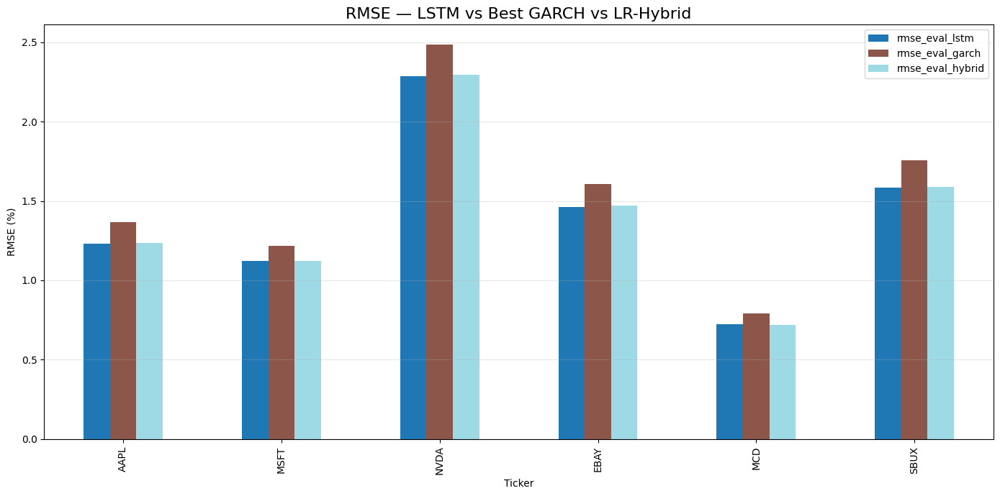

In [ ]:
ols_df = pd.DataFrame(hybrid_info_ols).T

ols_df = ols_df[[
    "rmse_eval_lstm",
    "rmse_eval_garch",
    "rmse_eval_hybrid"
]]

ols_df.plot(kind="bar", figsize=(14,7), colormap="tab20")
plt.title("RMSE — LSTM vs Best GARCH vs LR-Hybrid", fontsize=16)
plt.xlabel("Ticker")
plt.ylabel("RMSE (%)")
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


**Gradient-based convex weights**

In [ ]:

best_garch_name = comp["Best_GARCH_Name"].to_dict()

def project_to_simplex(w):
    """
    Project vector w (R^d) to the probability simplex:
       w_i >= 0, sum(w_i) = 1
    Using the algorithm by Wang & Carreira-Perpinan (2013).
    """
    w = np.array(w, dtype=float)
    if w.ndim == 1:
        w = w.reshape(-1)
    else:
        raise ValueError("w should be a 1D array")

    # sort in descending order
    u = np.sort(w)[::-1]
    cssv = np.cumsum(u)
    rho = np.nonzero(u * np.arange(1, len(u)+1) > (cssv - 1))[0][-1]
    theta = (cssv[rho] - 1.0) / (rho + 1.0)
    w_proj = np.maximum(w - theta, 0.0)
    return w_proj


In [ ]:
grad_hybrid_results = {}

def align_three(idx_lstm, yhat_lstm,
                idx_garch, yhat_garch,
                y_true_series):
    """
    Align LSTM, GARCH forecasts and true |returns| on common dates.
    (We will add RollingStd later using same date index.)
    """
    df = (
        pd.DataFrame({"lstm": np.asarray(yhat_lstm).ravel()}, index=idx_lstm)
        .join(
            pd.DataFrame({"garch": np.asarray(yhat_garch).ravel()}, index=idx_garch),
            how="inner"
        )
        .join(
            y_true_series.rename("y_true"),
            how="inner"
        )
        .dropna()
    )
    dates = df.index
    y_true = df["y_true"].values.reshape(-1, 1)
    x_lstm = df["lstm"].values.reshape(-1, 1)
    x_garch = df["garch"].values.reshape(-1, 1)
    return dates, y_true, x_lstm, x_garch

for t in tickers:
    # Need LSTM forecasts
    if t not in lstm_vol_pred:
        print(f"{t}: no LSTM-vol — skipping")
        continue

    # Best GARCH for this ticker
    gname = best_garch_name.get(t, None)
    if gname is None or t not in fcasts_all or gname not in fcasts_all[t]:
        print(f"{t}: no best GARCH forecasts — skipping")
        continue

    idx_lstm, yh_lstm = idx_tests_vol[t], lstm_vol_pred[t]
    idx_garch, yh_garch = test_idx_all[t], fcasts_all[t][gname]
    y_true_ser = realized_all[t]   # |returns| in percent

    # Align LSTM, GARCH, y_true
    dates, y_true, x_lstm, x_garch = align_three(
        idx_lstm, yh_lstm, idx_garch, yh_garch, y_true_ser
    )
    m = len(dates)
    if m < 60:
        print(f"{t}: too few aligned points ({m}) — skipping")
        continue

    # Align RollingStd(30) to those dates
    base = np.asarray(baseline_all[t]).flatten()
    base_ser = pd.Series(base, index=test_idx_all[t])
    base_aligned = base_ser.reindex(dates).values.reshape(-1, 1)

    # Build feature matrix X = [LSTM, GARCH, Baseline]
    X = np.hstack([x_lstm, x_garch, base_aligned])
    y = y_true.ravel()

    # Split 30% / 70% on aligned test window (no leakage)
    k = max(10, int(0.30 * m))
    X_fit, y_fit = X[:k], y[:k]
    X_ev,  y_ev  = X[k:], y[k:]

    # ------ Gradient Descent on MSE for weights (convex) ------

    d = X_fit.shape[1]  # number of models (3)
    w = np.ones(d) / d  # start with equal weights
    lr = 0.05           # learning rate
    n_steps = 500       # iterations

    for step in range(n_steps):
        # predictions on fit slice
        y_pred_fit = X_fit @ w
        # gradient dL/dw_j = 2/n * sum( (y_pred - y)*x_j )
        residual = y_pred_fit - y_fit
        grad = (2.0 / len(y_fit)) * (X_fit.T @ residual)
        # gradient descent update
        w -= lr * grad
        # project back to simplex: non-negative, sum=1
        w = project_to_simplex(w)

    # final weights
    w_lstm, w_garch, w_base = w.tolist()

    # ------ Evaluate on the remaining 70% ------

    yhat_h = X_ev @ w
    rmse_h = float(np.sqrt(mean_squared_error(y_ev, yhat_h)))

    # Component RMSEs on eval slice
    rmse_l = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 0])))  # LSTM
    rmse_g = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 1])))  # GARCH
    rmse_b = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 2])))  # Baseline

    grad_hybrid_results[t] = {
        "Best_GARCH_Name": gname,
        "weights_[LSTM,GARCH,Baseline]": w.tolist(),
        "rmse_eval_hybrid": rmse_h,
        "rmse_eval_lstm": rmse_l,
        "rmse_eval_garch": rmse_g,
        "rmse_eval_baseline": rmse_b,
        "n_eval": len(y_ev)
    }

    print(
        f"{t}: GD-hybrid weights = [LSTM={w_lstm:.3f}, GARCH={w_garch:.3f}, Base={w_base:.3f}] | "
        f"RMSE — LSTM {rmse_l:.4f}, GARCH {rmse_g:.4f}, Base {rmse_b:.4f}, HYBRID {rmse_h:.4f}"
    )


AAPL: GD-hybrid weights = [LSTM=0.609, GARCH=0.048, Base=0.343] | RMSE — LSTM 1.2294, GARCH 1.3672, Base 1.3598, HYBRID 1.2345
MSFT: GD-hybrid weights = [LSTM=0.652, GARCH=0.000, Base=0.348] | RMSE — LSTM 1.1206, GARCH 1.2176, Base 1.2111, HYBRID 1.1218
NVDA: GD-hybrid weights = [LSTM=0.538, GARCH=0.061, Base=0.401] | RMSE — LSTM 2.2880, GARCH 2.4861, Base 2.4650, HYBRID 2.2835
EBAY: GD-hybrid weights = [LSTM=0.657, GARCH=0.343, Base=0.000] | RMSE — LSTM 1.4603, GARCH 1.6080, Base 1.6474, HYBRID 1.4698
MCD: GD-hybrid weights = [LSTM=0.874, GARCH=0.000, Base=0.126] | RMSE — LSTM 0.7250, GARCH 0.7924, Base 0.7767, HYBRID 0.7252
SBUX: GD-hybrid weights = [LSTM=0.746, GARCH=0.254, Base=0.000] | RMSE — LSTM 1.5835, GARCH 1.7574, Base 1.7969, HYBRID 1.5868


In [ ]:
w_rows = []
for t, d in grad_hybrid_results.items():
    wl, wg, wb = d["weights_[LSTM,GARCH,Baseline]"]
    w_rows.append({
        "Ticker": t,
        "w_LSTM": wl,
        "w_GARCH": wg,
        "w_Baseline": wb
    })
df_w = pd.DataFrame(w_rows).set_index("Ticker").sort_index()
print("\nConvex weights from gradient descent:")
print(df_w.round(3))



Convex weights from gradient descent:
         w_LSTM  w_GARCH  w_Baseline
Ticker                              
AAPL   0.609000 0.048000    0.343000
EBAY   0.657000 0.343000    0.000000
MCD    0.874000 0.000000    0.126000
MSFT   0.652000 0.000000    0.348000
NVDA   0.538000 0.061000    0.401000
SBUX   0.746000 0.254000    0.000000


           LSTM    GARCH  Baseline  GD_Hybrid
Ticker                                       
AAPL   1.229432 1.367195  1.359772   1.234519
EBAY   1.460285 1.607965  1.647418   1.469765
MCD    0.725024 0.792420  0.776715   0.725245
MSFT   1.120551 1.217583  1.211106   1.121823
NVDA   2.287969 2.486096  2.465012   2.283535
SBUX   1.583467 1.757423  1.796909   1.586808


<Figure size 1000x500 with 0 Axes>

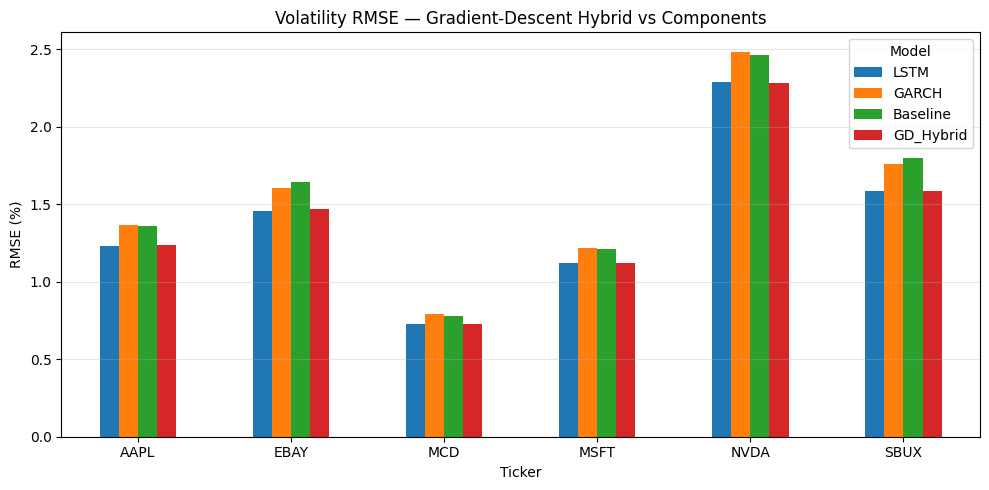

In [ ]:
# Build DataFrame for plotting
rows = []
for t, d in grad_hybrid_results.items():
    rows.append({
        "Ticker": t,
        "LSTM": d["rmse_eval_lstm"],
        "GARCH": d["rmse_eval_garch"],
        "Baseline": d["rmse_eval_baseline"],
        "GD_Hybrid": d["rmse_eval_hybrid"],
    })
df_gd = pd.DataFrame(rows).set_index("Ticker").sort_index()
print(df_gd.round(6))

# Grouped bar chart
plt.figure(figsize=(10,5))
df_gd.plot(kind="bar", figsize=(10,5))
plt.title("Volatility RMSE — Gradient-Descent Hybrid vs Components")
plt.ylabel("RMSE (%)"); plt.xlabel("Ticker")
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model")
plt.tight_layout()
plt.show()


In [ ]:
#Option  — If you need actual weights: Non-negative least squares (NNLS) or positive LinearRegression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

weights_results = {}

for t in tickers:
    # Need LSTM forecasts
    if t not in lstm_vol_pred:
        print(f"{t}: no LSTM-vol — skipping")
        continue

    # Best GARCH model for this ticker
    garch_name = best_garch_name.get(t, None)
    if garch_name is None:
        print(f"{t}: no Best_GARCH_Name in comp — skipping")
        continue

    if t not in fcasts_all or garch_name not in fcasts_all[t]:
        print(f"{t}: no {garch_name} forecasts for {t} — skipping")
        continue

    # Get series
    idx_lstm, yh_lstm = idx_tests_vol[t], lstm_vol_pred[t]
    idx_garch, yh_garch = test_idx_all[t], fcasts_all[t][garch_name]
    y_true_ser = realized_all[t]

    # Align LSTM, GARCH, realized
    dates, y_true, x1, x2 = align_three(idx_lstm, yh_lstm, idx_garch, yh_garch, y_true_ser)
    m = len(dates)
    if m < 60:
        print(f"{t}: too few aligned points ({m}) — skipping")
        continue

    # Align baseline (RollingStd(30)) to the same dates
    base_ser = pd.Series(np.asarray(baseline_all[t]).ravel(), index=test_idx_all[t])
    base_aligned = base_ser.reindex(dates).values.reshape(-1, 1)

    # X = [LSTM, GARCH, RollingStd]
    X = np.hstack([x1, x2, base_aligned])
    y = y_true.ravel()

    # 30% / 70% split on aligned test window
    k = max(10, int(0.30 * m))
    X_fit, y_fit = X[:k], y[:k]
    X_ev,  y_ev  = X[k:], y[k:]

    # Non-negative linear regression (no intercept)
    reg = LinearRegression(positive=True, fit_intercept=False)
    reg.fit(X_fit, y_fit)
    coefs = reg.coef_.astype(float)   # [w_LSTM_raw, w_GARCH_raw, w_Base_raw]  >= 0

    # Normalize to convex weights (sum = 1)
    s = coefs.sum() if coefs.sum() > 0 else 1.0
    w = coefs / s    # final convex weights

    # Hybrid prediction
    yhat_h = X_ev @ w
    rmse_h = float(np.sqrt(mean_squared_error(y_ev, yhat_h)))

    # Individual components on eval slice
    rmse_l = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 0])))  # LSTM
    rmse_g = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 1])))  # GARCH
    rmse_b = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 2])))  # Baseline

    weights_results[t] = {
        "Best_GARCH_Name": garch_name,
        "weights_convex_[LSTM,GARCH,Base]": w.tolist(),
        "rmse_eval_hybrid": rmse_h,
        "rmse_eval_lstm": rmse_l,
        "rmse_eval_garch": rmse_g,
        "rmse_eval_base": rmse_b
    }

    print(
        f"{t}: Best GARCH={garch_name} | "
        f"weights(convex)={w} | RMSE — "
        f"LSTM {rmse_l:.4f}, GARCH {rmse_g:.4f}, "
        f"Base {rmse_b:.4f}, Hybrid {rmse_h:.4f}"
    )


AAPL: Best GARCH=GARCH(1,2) | weights(convex)=[0.46690593 0.18726821 0.34582586] | RMSE — LSTM 1.2294, GARCH 1.3672, Base 1.3598, Hybrid 1.2504
MSFT: Best GARCH=GARCH(2,2) | weights(convex)=[0.49772939 0.         0.50227061] | RMSE — LSTM 1.1206, GARCH 1.2176, Base 1.2111, Hybrid 1.1331
NVDA: Best GARCH=GARCH(1,1) | weights(convex)=[0.1748783  0.44431178 0.38080992] | RMSE — LSTM 2.2880, GARCH 2.4861, Base 2.4650, Hybrid 2.3826
EBAY: Best GARCH=GARCH(1,2) | weights(convex)=[0.21232332 0.78767668 0.        ] | RMSE — LSTM 1.4603, GARCH 1.6080, Base 1.6474, Hybrid 1.5474
MCD: Best GARCH=GARCH(1,1) | weights(convex)=[0.17381162 0.82618838 0.        ] | RMSE — LSTM 0.7250, GARCH 0.7924, Base 0.7767, Hybrid 0.7721
SBUX: Best GARCH=GARCH(2,1) | weights(convex)=[0.55625442 0.44374558 0.        ] | RMSE — LSTM 1.5835, GARCH 1.7574, Base 1.7969, Hybrid 1.6083



NNLS Hybrid RMSE:
           LSTM    GARCH  Baseline   Hybrid
Ticker                                     
AAPL   1.229432 1.367195  1.359772 1.250397
EBAY   1.460285 1.607965  1.647418 1.547447
MCD    0.725024 0.792420  0.776715 0.772125
MSFT   1.120551 1.217583  1.211106 1.133075
NVDA   2.287969 2.486096  2.465012 2.382598
SBUX   1.583467 1.757423  1.796909 1.608325

Convex Weights (sum to 1):
         w_LSTM  w_GARCH   w_Base
Ticker                           
AAPL   0.467000 0.187000 0.346000
EBAY   0.212000 0.788000 0.000000
MCD    0.174000 0.826000 0.000000
MSFT   0.498000 0.000000 0.502000
NVDA   0.175000 0.444000 0.381000
SBUX   0.556000 0.444000 0.000000


<Figure size 1000x500 with 0 Axes>

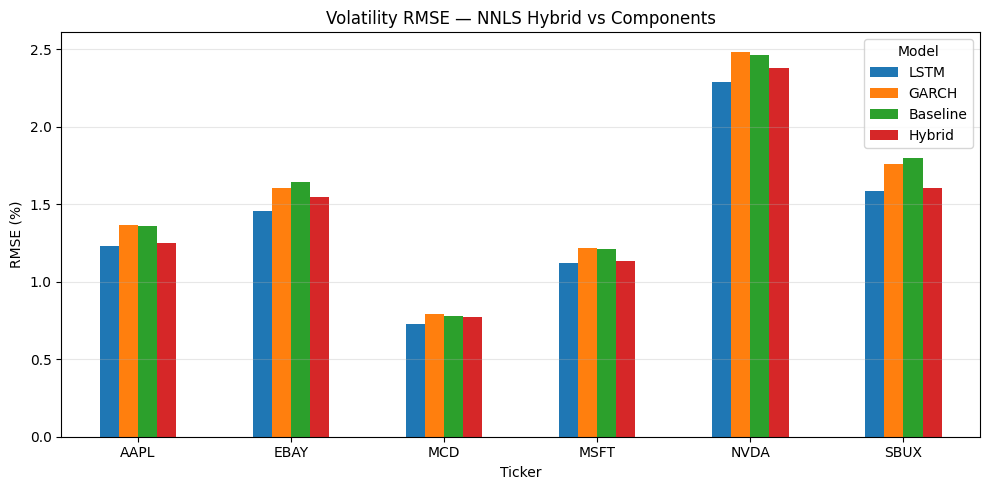

<Figure size 1000x500 with 0 Axes>

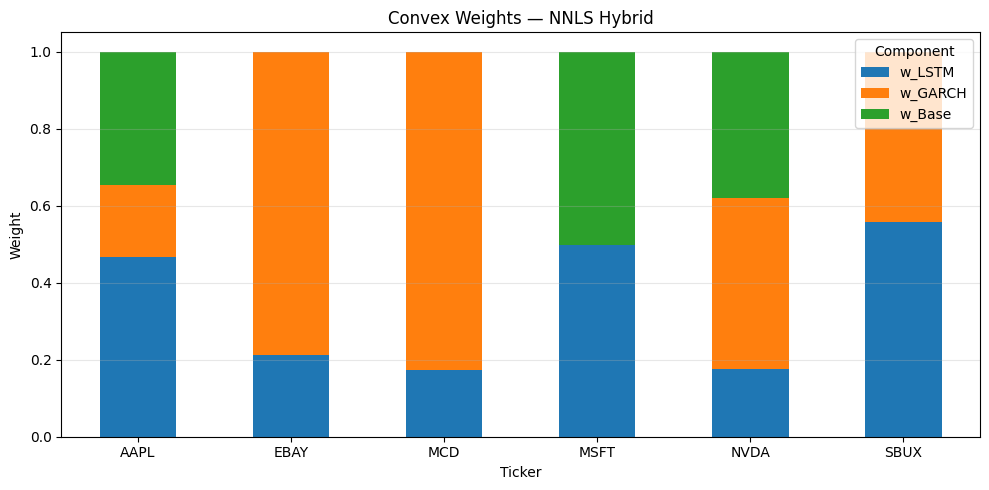

In [ ]:
# ---- RMSE comparison from weights_results ----
rows = []
w_rows = []
for t, d in weights_results.items():
    rows.append({
        "Ticker": t,
        "LSTM": d["rmse_eval_lstm"],
        "GARCH": d["rmse_eval_garch"],
        "Baseline": d["rmse_eval_base"],
        "Hybrid": d["rmse_eval_hybrid"],
    })
    # convex weights in order [LSTM, GARCH, Base]
    w = d["weights_convex_[LSTM,GARCH,Base]"]
    w_rows.append({"Ticker": t, "w_LSTM": w[0], "w_GARCH": w[1], "w_Base": w[2]})

df_w = pd.DataFrame(rows).set_index("Ticker").sort_index()
df_wts = pd.DataFrame(w_rows).set_index("Ticker").sort_index()

print("\nNNLS Hybrid RMSE:")
print(df_w.round(6))
print("\nConvex Weights (sum to 1):")
print(df_wts.round(3))

# ---- RMSE grouped bar ----
plt.figure(figsize=(10,5))
df_w.plot(kind="bar", figsize=(10,5))
plt.title("Volatility RMSE — NNLS Hybrid vs Components")
plt.ylabel("RMSE (%)"); plt.xlabel("Ticker")
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model")
plt.tight_layout()
plt.show()

# ---- Weights stacked bar (per ticker) ----
plt.figure(figsize=(10,5))
df_wts.plot(kind="bar", stacked=True, figsize=(10,5))
plt.title("Convex Weights — NNLS Hybrid")
plt.ylabel("Weight"); plt.xlabel("Ticker")
plt.ylim(0, 1.05)
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Component")
plt.tight_layout()
plt.show()


In [ ]:

all_weights = []

for t in tickers:

    row = {"Ticker": t}

    # --- Option A: Convex blend ---
    if t in hybrid_info:   # from Option A
        row["A_LSTM"]  = hybrid_info[t]["w_lstm"]
        row["A_GARCH"] = hybrid_info[t]["w_garch"]
    else:
        row["A_LSTM"] = row["A_GARCH"] = np.nan

    # --- Option C: Positive Linear Regression (NNLS-like) ---
    if t in weights_results:
        w = weights_results[t]["weights_convex_[LSTM,GARCH,Base]"]
        row["C_LSTM"]  = w[0]
        row["C_GARCH"] = w[1]
        row["C_BASE"]  = w[2]
    else:
        row["C_LSTM"] = row["C_GARCH"] = row["C_BASE"] = np.nan


    all_weights.append(row)

weights_df = pd.DataFrame(all_weights).set_index("Ticker")
print(weights_df.round(4))


         A_LSTM  A_GARCH   C_LSTM  C_GARCH   C_BASE
Ticker                                             
AAPL   0.660000 0.340000 0.466900 0.187300 0.345800
MSFT   0.730000 0.270000 0.497700 0.000000 0.502300
NVDA   0.560000 0.440000 0.174900 0.444300 0.380800
EBAY   0.660000 0.340000 0.212300 0.787700 0.000000
MCD    0.970000 0.030000 0.173800 0.826200 0.000000
SBUX   0.750000 0.250000 0.556300 0.443700 0.000000


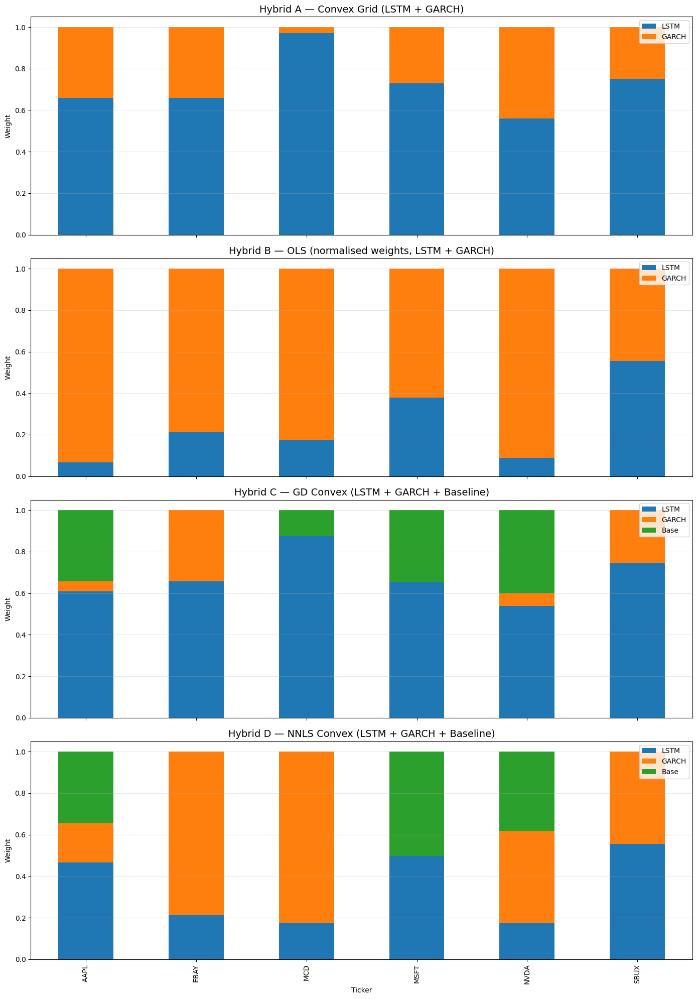

In [ ]:
# --- A: Convex Grid (LSTM + GARCH) ---
convex_w = pd.DataFrame({
    t: {
        "LSTM":  hybrid_info[t]["w_lstm"],
        "GARCH": hybrid_info[t]["w_garch"],
    }
    for t in hybrid_info
}).T.sort_index()

# --- B: OLS (2 models, normalised to sum=1) ---
ols_raw = pd.DataFrame({
    t: {
        "LSTM":  hybrid_info_ols[t]["b_lstm"],
        "GARCH": hybrid_info_ols[t]["b_garch"],
    }
    for t in hybrid_info_ols
}).T.sort_index()

ols_w = ols_raw.div(ols_raw.sum(axis=1), axis=0)

# --- C: Gradient-Descent Convex Weights (LSTM + GARCH + Baseline) ---
gd_w = pd.DataFrame({
    t: {
        "LSTM":    grad_hybrid_results[t]["weights_[LSTM,GARCH,Baseline]"][0],
        "GARCH":   grad_hybrid_results[t]["weights_[LSTM,GARCH,Baseline]"][1],
        "Base":    grad_hybrid_results[t]["weights_[LSTM,GARCH,Baseline]"][2],
    }
    for t in grad_hybrid_results
}).T.sort_index()

# --- D: NNLS Convex Weights (LSTM + GARCH + Baseline) ---
nnls_w = pd.DataFrame({
    t: {
        "LSTM":  weights_results[t]["weights_convex_[LSTM,GARCH,Base]"][0],
        "GARCH": weights_results[t]["weights_convex_[LSTM,GARCH,Base]"][1],
        "Base":  weights_results[t]["weights_convex_[LSTM,GARCH,Base]"][2],
    }
    for t in weights_results
}).T.sort_index()

# =====================================
# 2) One figure with 4 stacked bar plots
# =====================================

fig, axes = plt.subplots(4, 1, figsize=(14, 20), sharex=True)

plots = [
    (convex_w, "Hybrid A — Convex Grid (LSTM + GARCH)"),
    (ols_w,    "Hybrid B — OLS (normalised weights, LSTM + GARCH)"),
    (gd_w,     "Hybrid C — GD Convex (LSTM + GARCH + Baseline)"),
    (nnls_w,   "Hybrid D — NNLS Convex (LSTM + GARCH + Baseline)"),
]

for ax, (df, title) in zip(axes, plots):
    df.plot(kind="bar", stacked=True, ax=ax)
    ax.set_title(title, fontsize=14)
    ax.set_ylabel("Weight")
    ax.set_ylim(0, 1.05)
    ax.grid(axis="y", alpha=0.3)
    ax.legend(loc="upper right")

axes[-1].set_xlabel("Ticker")
plt.tight_layout()
plt.show()


In [ ]:
rows_all = []

for t in tickers:
    # ---- Check data presence ----
    if t not in lstm_vol_pred:
        print(f"{t}: no LSTM-vol — skipping in RMSE summary")
        continue

    gname = best_garch_name.get(t, None)
    if gname is None or t not in fcasts_all or gname not in fcasts_all[t]:
        print(f"{t}: no best GARCH for RMSE summary — skipping {t}")
        continue

    # ---- Align LSTM, GARCH, realized ----
    idx_lstm   = idx_tests_vol[t]
    yh_lstm    = lstm_vol_pred[t]
    idx_garch  = test_idx_all[t]
    yh_garch   = fcasts_all[t][gname]
    y_true_ser = realized_all[t]

    dates, y_true, x_lstm, x_garch = align_three(
        idx_lstm, yh_lstm,
        idx_garch, yh_garch,
        y_true_ser
    )
    m = len(dates)
    if m < 60:
        print(f"{t}: too few aligned points ({m}) — skipping in RMSE summary")
        continue

    # ---- Align Baseline (RollingStd(30)) to the same dates ----
    base_ser = pd.Series(np.asarray(baseline_all[t]).ravel(), index=test_idx_all[t])
    base_aligned = base_ser.reindex(dates).values.reshape(-1, 1)

    # ---- Build arrays & split 30% / 70% ----
    X_lstm = x_lstm
    X_garch = x_garch
    X_base = base_aligned
    y = y_true.ravel()

    k = max(10, int(0.30 * m))
    y_ev = y[k:]

    lstm_ev  = X_lstm[k:]
    garch_ev = X_garch[k:]
    base_ev  = X_base[k:]

    # ---- Base model RMSEs on eval slice ----
    rmse_lstm  = float(np.sqrt(mean_squared_error(y_ev, lstm_ev)))
    rmse_garch = float(np.sqrt(mean_squared_error(y_ev, garch_ev)))
    rmse_base  = float(np.sqrt(mean_squared_error(y_ev, base_ev)))

    rows_all.append({"Ticker": t, "Model": "LSTM_vol",     "RMSE": rmse_lstm})
    rows_all.append({"Ticker": t, "Model": "GARCH_best",   "RMSE": rmse_garch})
    rows_all.append({"Ticker": t, "Model": "Baseline(30d)", "RMSE": rmse_base})

    # ---- Hybrid A (Convex grid) ----
    if t in hybrid_info:
        rows_all.append({
            "Ticker": t,
            "Model": "Hybrid_A_Convex",
            "RMSE":  hybrid_info[t]["rmse_eval_hybrid"]
        })

    # ---- Hybrid B (OLS) ----
    if t in hybrid_info_ols:
        rows_all.append({
            "Ticker": t,
            "Model": "Hybrid_B_OLS",
            "RMSE":  hybrid_info_ols[t]["rmse_eval_hybrid"]
        })

    # ---- Hybrid C (GD convex) ----
    if t in grad_hybrid_results:
        rows_all.append({
            "Ticker": t,
            "Model": "Hybrid_C_GD",
            "RMSE":  grad_hybrid_results[t]["rmse_eval_hybrid"]
        })

    # ---- Hybrid D (NNLS convex) ----
    if t in weights_results:
        rows_all.append({
            "Ticker": t,
            "Model": "Hybrid_D_NNLS",
            "RMSE":  weights_results[t]["rmse_eval_hybrid"]
        })

# ---- Wide format for plotting ----
rmse_all_df = pd.DataFrame(rows_all)
rmse_all_wide = rmse_all_df.pivot(index="Ticker", columns="Model", values="RMSE")
rmse_all_wide = rmse_all_wide.sort_index()

print(rmse_all_wide.round(6))


Model   Baseline(30d)  GARCH_best  Hybrid_A_Convex  Hybrid_B_OLS  Hybrid_C_GD  \
Ticker                                                                          
AAPL         1.359772    1.367195         1.231027      1.236854     1.234519   
EBAY         1.647418    1.607965         1.469475      1.471376     1.469765   
MCD          0.776715    0.792420         0.725187      0.721421     0.725245   
MSFT         1.211106    1.217583         1.122912      1.122496     1.121823   
NVDA         2.465012    2.486096         2.282287      2.295033     2.283535   
SBUX         1.796909    1.757423         1.586515      1.590277     1.586808   

Model   Hybrid_D_NNLS  LSTM_vol  
Ticker                           
AAPL         1.250397  1.229432  
EBAY         1.547447  1.460285  
MCD          0.772125  0.725024  
MSFT         1.133075  1.120551  
NVDA         2.382598  2.287969  
SBUX         1.608325  1.583467  


<Figure size 1600x700 with 0 Axes>

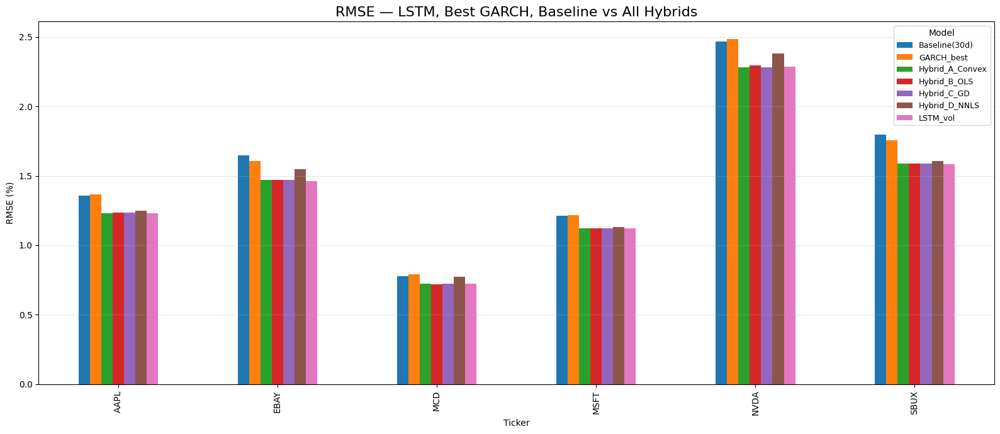

In [ ]:
plt.figure(figsize=(16, 7))
rmse_all_wide.plot(kind="bar", figsize=(16, 7))

plt.title("RMSE — LSTM, Best GARCH, Baseline vs All Hybrids", fontsize=16)
plt.xlabel("Ticker")
plt.ylabel("RMSE (%)")
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model", fontsize=9)
plt.tight_layout()
plt.show()


# APPENDIX

# **LSTM Daily returns**

In [ ]:
# ==== SETUP ====
from datetime import datetime
from pandas_datareader import data as pdr

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error


import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

tickers = ["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]

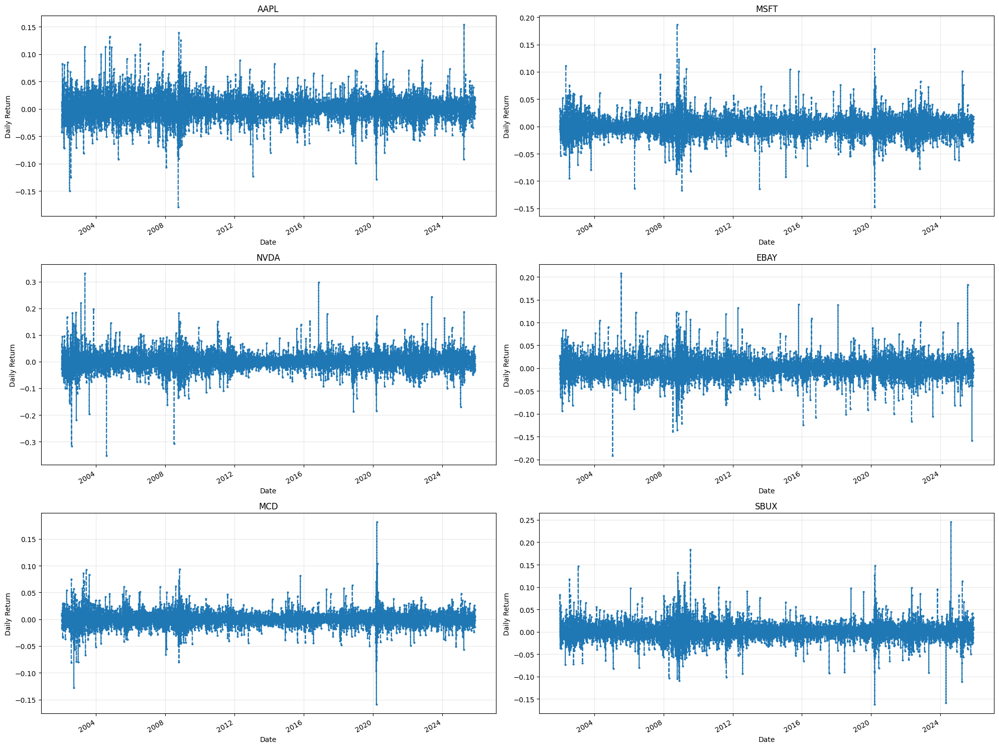

In [ ]:
# 1) Daily returns from your dataset (auto_adjust=True ⇒ use "Close")
returns = data1['Close'].pct_change().dropna()

# 2) Plot daily return percentage for all 7 tickers
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 15))
axes = axes.flatten()

for ax, ticker in zip(axes, tickers):
    returns[ticker].plot(ax=ax, legend=False, linestyle='--', marker='o', markersize=2)
    ax.set_title(ticker)
    ax.set_xlabel('Date')
    ax.set_ylabel('Daily Return')
    ax.grid(True, alpha=0.3)

fig.tight_layout()
plt.show()


In [ ]:

scaled_data = {}
scalers = {}

for t in returns.columns:
    scaler = MinMaxScaler(feature_range=(-1, 1))
    scaled_data[t] = scaler.fit_transform(returns[t].values.reshape(-1,1))
    scalers[t] = scaler


In [ ]:
from statsmodels.tsa.stattools import adfuller
stationarity_results = {}

for t in returns.columns:
    series = returns[t].dropna()
    result = adfuller(series)
    p_value = result[1]
    status = "Stationary" if p_value < 0.05 else "Not Stationary"

    stationarity_results[t] = {
        "ADF Statistic": result[0],
        "p-value": p_value,
        "Conclusion": status
    }

for t, res in stationarity_results.items():
    print(f"{t}: p-value={res['p-value']:.5f} → {res['Conclusion']}")


AAPL: p-value=0.00000 → Stationary
EBAY: p-value=0.00000 → Stationary
MCD: p-value=0.00000 → Stationary
MSFT: p-value=0.00000 → Stationary
NVDA: p-value=0.00000 → Stationary
SBUX: p-value=0.00000 → Stationary


In [ ]:
lookback = 10
train_frac = 0.95

Xtrains, Ytrains = {}, {}
Xtests,  Ytests  = {}, {}
train_lens, idx_tests = {}, {}

def make_windows(arr_2d, L):
    X, y = [], []
    for i in range(L, len(arr_2d)):
        X.append(arr_2d[i-L:i, 0])
        y.append(arr_2d[i, 0])
    X = np.array(X).reshape(-1, L, 1)
    y = np.array(y).reshape(-1, 1)
    return X, y

for t in tickers:
    r_sc = scaled_data[t]                  # (N,1)
    n = len(r_sc)
    n_train = max(lookback + 1, int(np.ceil(train_frac * n)))
    train_lens[t] = n_train
    idx_tests[t]  = returns.index[n_train:]   # aligns to test labels

    # TRAIN windows
    Xtr, Ytr = make_windows(r_sc[:n_train, :], lookback)
    Xtrains[t], Ytrains[t] = Xtr, Ytr

    # TEST windows (with lookback context)
    Xte, Yte = make_windows(r_sc[n_train - lookback:, :], lookback)
    Xtests[t], Ytests[t] = Xte, Yte

    print(f"{t}: Xtr{Xtr.shape} Ytr{Ytr.shape}  Xte{Xte.shape} Yte{Yte.shape}  n_train={n_train} n={n}")


AAPL: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)  n_train=5716 n=6016
MSFT: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)  n_train=5716 n=6016
NVDA: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)  n_train=5716 n=6016
EBAY: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)  n_train=5716 n=6016
MCD: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)  n_train=5716 n=6016
SBUX: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)  n_train=5716 n=6016


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

models = {}

for t in tickers:
    x_train = Xtrains[t]; y_train = Ytrains[t]
    if x_train.size == 0:
        print(f"{t}: skipped (no train windows)");
        continue

    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    es = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)

    # IMPORTANT: shuffle=False for time series
    model.fit(x_train, y_train,
              validation_split=0.1,
              epochs=60,
              batch_size=64,
              callbacks=[es],
              shuffle=False,          # <- add this
              verbose=0)

    models[t] = model
    print(f"{t} — training done")



AAPL — training done
MSFT — training done
NVDA — training done
EBAY — training done
MCD — training done
SBUX — training done


In [ ]:
preds, rmses = {}, {}

for t in tickers:
    scaler = scalers[t]
    r_sc   = scaled_data[t]
    N      = r_sc.shape[0]
    training_data_len = train_lens[t]
    model  = models[t]

    if training_data_len < lookback:
        print(f"{t}: training_data_len < {lookback} — skipping")
        continue

    # Build test windows from scaled returns (we already have them!)
    x_test = Xtests[t]                       # reuse prepared windows
    n_windows = x_test.shape[0]

    # True y (UNSCALED returns) aligned to those windows
    y_all  = returns[[t]].values            # (N,1)
    y_test = y_all[training_data_len: training_data_len + n_windows, :]

    # Predict scaled, then inverse-transform to return units
    yhat_sc    = model.predict(x_test, verbose=0)
    predictions = scaler.inverse_transform(yhat_sc)

    # Align lengths defensively
    m = min(len(predictions), len(y_test))
    predictions = predictions[:m]
    y_test = y_test[:m]

    rmse = float(np.sqrt(np.mean((predictions - y_test) ** 2)))
    print(f"{t} RMSE: {rmse:.4f}")

    preds[t]  = predictions
    rmses[t]  = rmse


AAPL RMSE: 0.0194
MSFT RMSE: 0.0150
NVDA RMSE: 0.0303
EBAY RMSE: 0.0228
MCD RMSE: 0.0115
SBUX RMSE: 0.0200


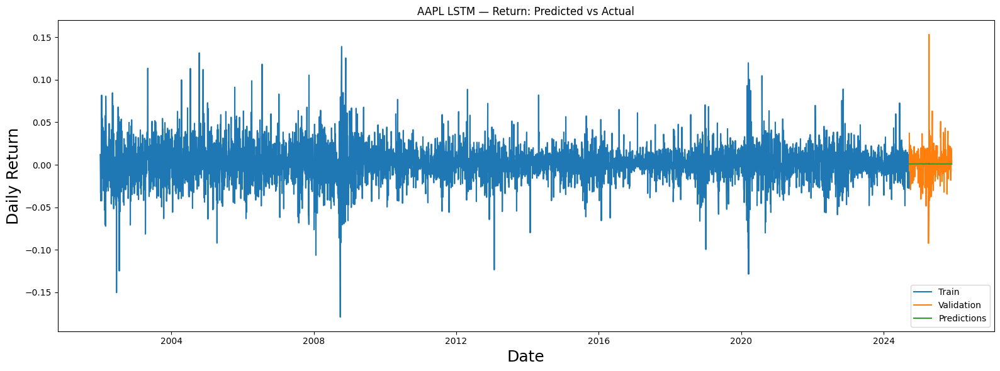

             Actual  Predictions
Date                            
2025-11-21 0.019681     0.001038
2025-11-24 0.016317     0.000968
2025-11-25 0.003805     0.000904
2025-11-26 0.002094     0.000901
2025-11-28 0.004684     0.000913


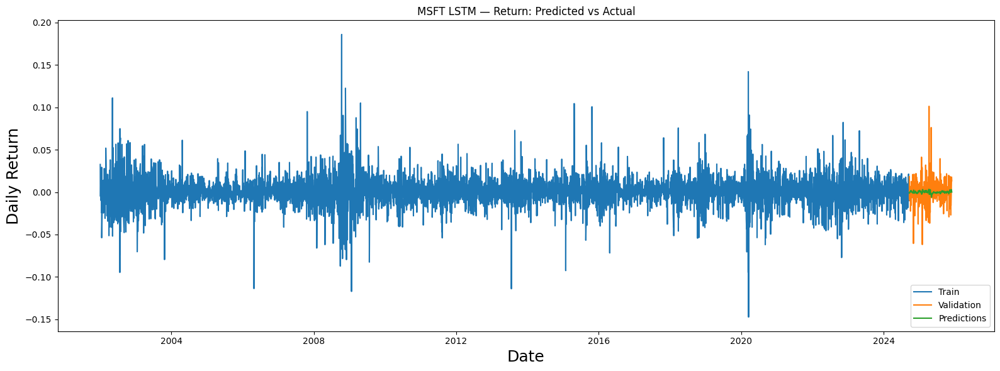

              Actual  Predictions
Date                             
2025-11-21 -0.013189     0.002723
2025-11-24  0.003982     0.003002
2025-11-25  0.006308     0.002380
2025-11-26  0.017841     0.001469
2025-11-28  0.013409     0.000129


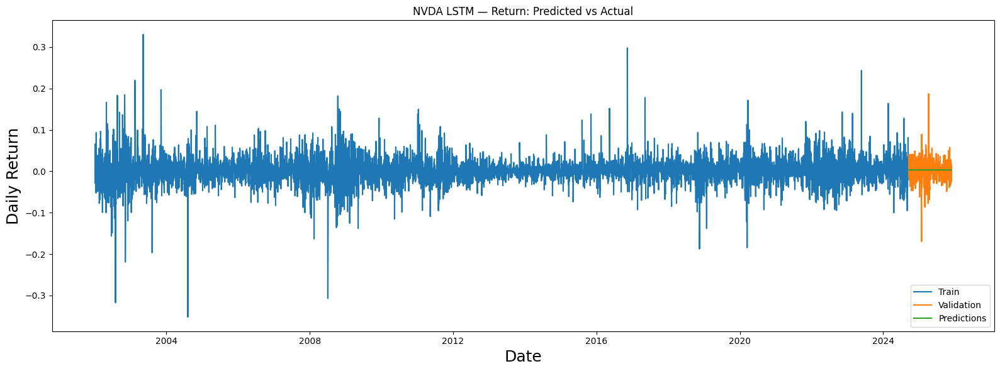

              Actual  Predictions
Date                             
2025-11-21 -0.009743     0.003241
2025-11-24  0.020517     0.003236
2025-11-25 -0.025911     0.003233
2025-11-26  0.013722     0.003234
2025-11-28 -0.018085     0.003238


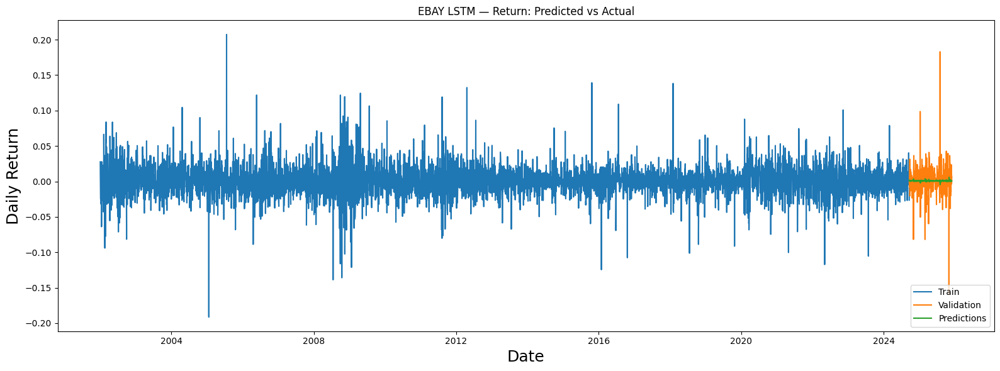

              Actual  Predictions
Date                             
2025-11-21  0.009869     0.001449
2025-11-24  0.000619     0.000727
2025-11-25  0.023489     0.000729
2025-11-26 -0.003624     0.000067
2025-11-28  0.007178     0.000677


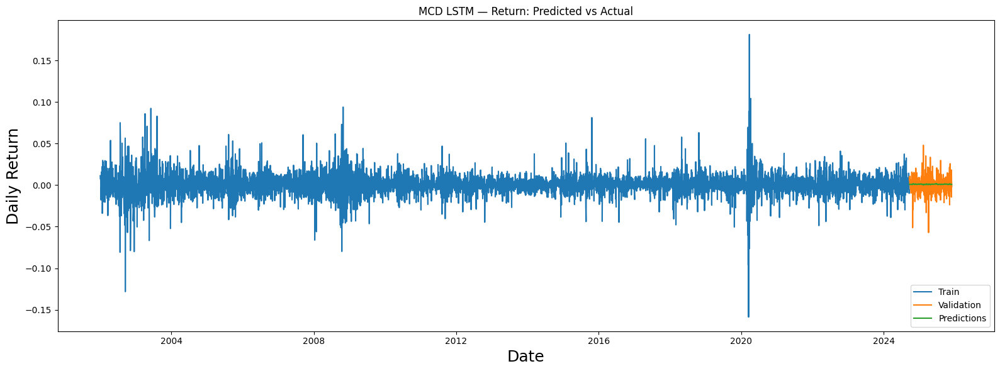

              Actual  Predictions
Date                             
2025-11-21  0.017063     0.001053
2025-11-24 -0.014385     0.000903
2025-11-25  0.018203     0.000986
2025-11-26  0.006281     0.000938
2025-11-28 -0.001857     0.000838


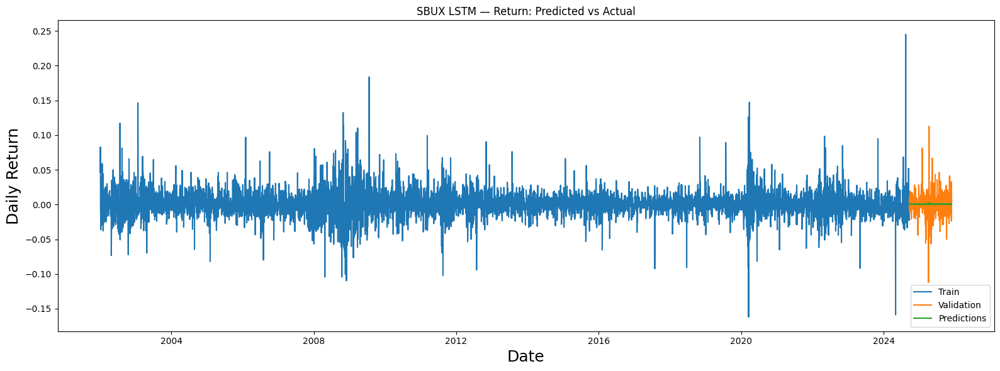

              Actual  Predictions
Date                             
2025-11-21  0.033043     0.000948
2025-11-24 -0.023550     0.000392
2025-11-25  0.030838     0.000633
2025-11-26  0.009196     0.000241
2025-11-28  0.004729     0.000106


In [ ]:
for t in tickers:
    ser = returns[t]
    predictions = preds[t].ravel()
    training_data_len = train_lens[t]

    train = ser.iloc[:training_data_len]
    valid = ser.iloc[training_data_len:].to_frame(name='Actual').copy()
    valid['Predictions'] = predictions[:len(valid)]

    plt.figure(figsize=(16,6))
    plt.title(f'{t} LSTM — Return: Predicted vs Actual')
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Daily Return', fontsize=18)
    plt.plot(train.index, train.values, label='Train')
    plt.plot(valid.index, valid['Actual'].values, label='Validation')
    plt.plot(valid.index, valid['Predictions'].values, label='Predictions')
    plt.legend(loc='lower right'); plt.tight_layout(); plt.show()

    print(valid.tail())


In [ ]:
from sklearn.preprocessing import MinMaxScaler

lookback   = 10
train_frac = 0.95  # matches your earlier style

scalers     = {}   # ticker -> MinMaxScaler(-1,1)
scaled      = {}   # ticker -> np.array (N,1) scaled returns
train_lens  = {}   # ticker -> n_train
idx_tests   = {}   # ticker -> DatetimeIndex for test

for t in tickers:
    r = returns[t].dropna().values.reshape(-1, 1)
    scaler = MinMaxScaler(feature_range=(-1, 1))
    r_sc   = scaler.fit_transform(r)

    scalers[t] = scaler
    scaled[t]  = r_sc

    n = len(r_sc)
    n_train = max(lookback + 1, int(np.ceil(train_frac * n)))
    train_lens[t] = n_train
    idx_tests[t]  = returns.index[n_train:]  # aligns with test labels later

    print(f"{t}: N={n}, n_train={n_train}")


AAPL: N=6016, n_train=5716
MSFT: N=6016, n_train=5716
NVDA: N=6016, n_train=5716
EBAY: N=6016, n_train=5716
MCD: N=6016, n_train=5716
SBUX: N=6016, n_train=5716


In [ ]:
#Build train/test windows from scaled returns
def make_windows(arr_2d, L):
    # arr_2d: (N,1) scaled; returns X:(N-L, L, 1), y:(N-L, 1)
    X, y = [], []
    for i in range(L, len(arr_2d)):
        X.append(arr_2d[i-L:i, 0])
        y.append(arr_2d[i, 0])
    X = np.array(X).reshape(-1, L, 1)
    y = np.array(y).reshape(-1, 1)
    return X, y

Xtrains, Ytrains = {}, {}
Xtests,  Ytests  = {}, {}

for t in tickers:
    r_sc   = scaled[t]
    n      = len(r_sc)
    n_train = train_lens[t]

    # train windows (only train slice)
    Xtr, Ytr = make_windows(r_sc[:n_train, :], lookback)
    Xtrains[t], Ytrains[t] = Xtr, Ytr

    # test windows (with lookback context from end of train)
    Xte, Yte = make_windows(r_sc[n_train - lookback:, :], lookback)
    Xtests[t], Ytests[t] = Xte, Yte

    print(f"{t}: Xtr{Xtr.shape} Ytr{Ytr.shape}  Xte{Xte.shape} Yte{Yte.shape}")


AAPL: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)
MSFT: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)
NVDA: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)
EBAY: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)
MCD: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)
SBUX: Xtr(5706, 10, 1) Ytr(5706, 1)  Xte(300, 10, 1) Yte(300, 1)


Train an LSTM per ticker (on returns)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

models = {}

for t in tickers:
    X_tr, Y_tr = Xtrains[t], Ytrains[t]
    if X_tr.size == 0:
        print(f"{t}: skipped (no train windows)")
        continue

    model = Sequential([
        LSTM(64, input_shape=(lookback, 1), return_sequences=False),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')

    es = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)
    model.fit(X_tr, Y_tr, validation_split=0.1, epochs=60, batch_size=64,
              callbacks=[es], verbose=0)

    models[t] = model
    print(f"{t}: training done")


AAPL: training done
MSFT: training done
NVDA: training done
EBAY: training done
MCD: training done
SBUX: training done


AAPL: LSTM RMSE (returns) = 0.019490


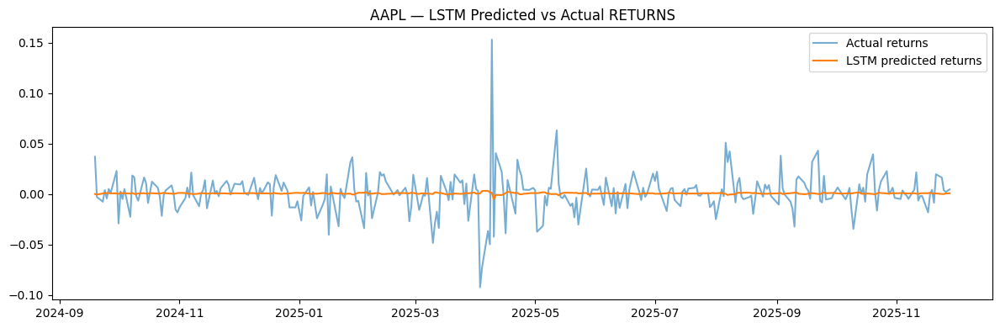

MSFT: LSTM RMSE (returns) = 0.015010


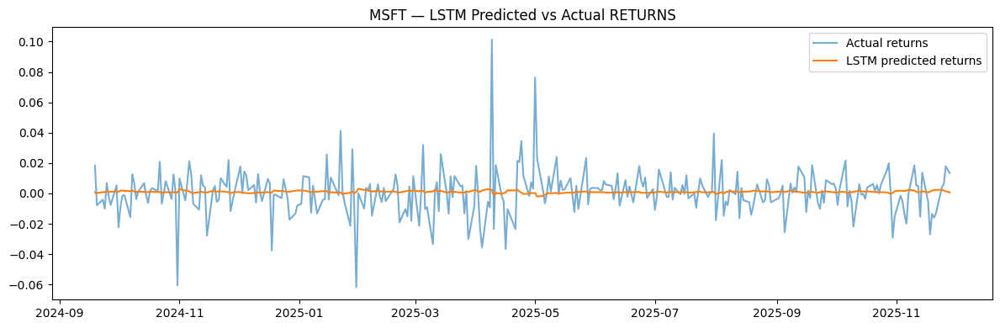

NVDA: LSTM RMSE (returns) = 0.030329


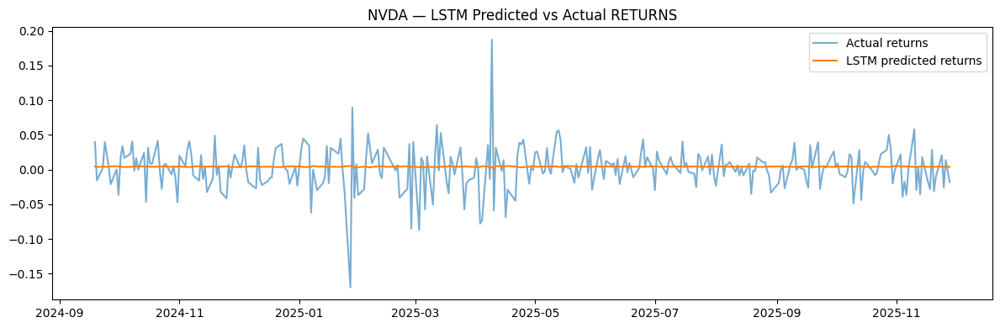

EBAY: LSTM RMSE (returns) = 0.022784


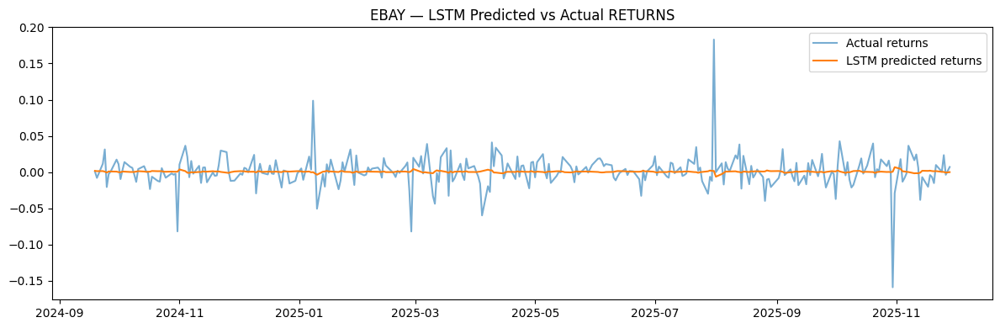

MCD: LSTM RMSE (returns) = 0.011476


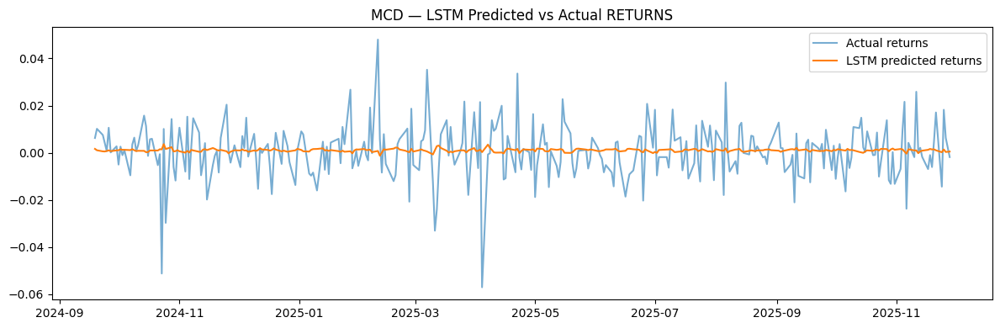

SBUX: LSTM RMSE (returns) = 0.019998


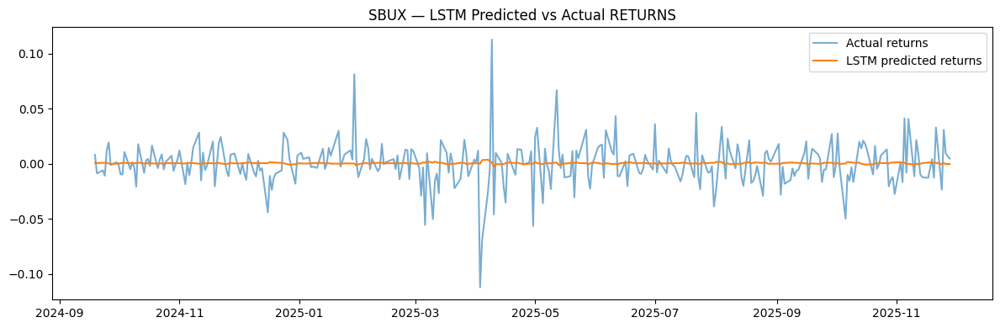


LSTM RMSE per ticker (return units):
AAPL   0.019490
EBAY   0.022784
MCD    0.011476
MSFT   0.015010
NVDA   0.030329
SBUX   0.019998
dtype: float64


In [ ]:
from sklearn.metrics import mean_squared_error
import pandas as pd
import matplotlib.pyplot as plt

lstm_returns_pred = {}   # ticker -> (n_test,1) predicted returns (unscaled)
lstm_returns_true = {}   # ticker -> (n_test,1) true returns (unscaled)
lstm_rmse_returns = {}   # ticker -> float

for t in tickers:
    model = models.get(t)
    if model is None:
        continue

    X_te, Y_te = Xtests[t], Ytests[t]
    scaler     = scalers[t]

    # predict scaled returns -> inverse-transform to return units
    yhat_sc = model.predict(X_te, verbose=0)
    yhat    = scaler.inverse_transform(yhat_sc)
    ytrue   = scaler.inverse_transform(Y_te)

    lstm_returns_pred[t] = yhat
    lstm_returns_true[t] = ytrue

    rmse_ret = float(np.sqrt(mean_squared_error(ytrue, yhat)))
    lstm_rmse_returns[t] = rmse_ret
    print(f"{t}: LSTM RMSE (returns) = {rmse_ret:.6f}")

    # returns plot
    idx = idx_tests[t]
    plt.figure(figsize=(12,4))
    plt.plot(idx, ytrue, label='Actual returns', alpha=0.6)
    plt.plot(idx, yhat,  label='LSTM predicted returns', linewidth=1.5)
    plt.title(f"{t} — LSTM Predicted vs Actual RETURNS")
    plt.legend(); plt.tight_layout(); plt.show()

# summary
rmse_series = pd.Series(lstm_rmse_returns).sort_index().round(6)
print("\nLSTM RMSE per ticker (return units):")
print(rmse_series)


# ***[Transformer Architecture]

In [ ]:
# If needed:
# !pip install torch==2.* transformers==4.* -q

import numpy as np
import pandas as pd
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from transformers import TimeSeriesTransformerConfig, TimeSeriesTransformerForPrediction
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error



2) Sliding-window dataset (univariate)

In [ ]:
class WindowDataset(Dataset):
    def __init__(self, series: np.ndarray, window: int = 60, horizon: int = 1):
        """
        series: 1D numpy array (train or test segment of target)
        window: lookback length
        horizon: predict next-step (default 1)
        """
        self.x = []
        self.y = []
        for i in range(window, len(series) - horizon + 1):
            self.x.append(series[i-window:i])          # [window]
            self.y.append(series[i:i+horizon])         # [horizon]
        self.x = np.asarray(self.x, dtype=np.float32)
        self.y = np.asarray(self.y, dtype=np.float32)

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        return self.x[idx], self.y[idx]


3) Collate to the HF model’s expected shapes

HF TimeSeriesTransformer expects shape (batch, time) (or with features).
We’ll keep it univariate and predict horizon=1 step-ahead.

In [ ]:
def collate(batch):
    X, Y = zip(*batch)                         # lists of [window] and [horizon]
    X = torch.tensor(np.stack(X))              # (B, window)
    Y = torch.tensor(np.stack(Y))              # (B, horizon)
    # Model expects (B, time, channels). For univariate channels=1.
    X = X.unsqueeze(-1)                        # -> (B, window, 1)
    Y = Y.unsqueeze(-1)                        # -> (B, horizon, 1)
    return X, Y


4) Helper: build train/test windows from your series & indices

In [ ]:
def build_train_test_windows(series: pd.Series, train_len: int, window=60, horizon=1):
    arr = series.values.astype(np.float32)
    train_arr = arr[:train_len]
    test_arr  = arr[train_len-window:]   # include overlap for windows

    dtrain = WindowDataset(train_arr, window, horizon)
    dtest  = WindowDataset(test_arr,  window, horizon)

    return dtrain, dtest


5) Configure the TimeSeriesTransformer

In [ ]:
def make_tst_config(context_length=60, prediction_length=1, d_model=64, n_heads=4, d_ff=128, dropout=0.1):
    return TimeSeriesTransformerConfig(
        prediction_length=prediction_length,
        context_length=context_length,
        d_model=d_model,
        encoder_layers=2,
        decoder_layers=2,
        num_attention_heads=n_heads,
        dropout=dropout,
        activation_function="gelu",
        # univariate
        input_size=1
    )


Train function (simple Adam loop)

In [ ]:
def train_tst_model(dtrain, config, epochs=20, batch_size=64, lr=1e-3, device=None):
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model = TimeSeriesTransformerForPrediction(config).to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    crit = nn.MSELoss()

    loader = DataLoader(dtrain, batch_size=batch_size, shuffle=True, collate_fn=collate)
    model.train()
    for ep in range(1, epochs+1):
        total = 0.0
        for X, Y in loader:
            X = X.to(device)                       # (B, ctx, 1)
            Y = Y.to(device)                       # (B, pred_len, 1)

            outputs = model(past_values=X, future_values=Y)  # teacher-forcing
            # HF model returns a tuple; first item has .loss if future_values provided
            loss = outputs.loss
            opt.zero_grad()
            loss.backward()
            opt.step()
            total += loss.item() * X.size(0)

        print(f"Epoch {ep:02d} | train MSE: {total/len(dtrain):.6f}")
    return model


# Predict on test windows & realign to your test index

In [ ]:
@torch.no_grad()
def predict_tst(model, dtest, device=None):
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    loader = DataLoader(dtest, batch_size=256, shuffle=False, collate_fn=collate)

    preds = []
    for X, _ in loader:
        X = X.to(device)
        out = model(past_values=X)
        # out.predictions: (B, prediction_length, input_size)
        yhat = out.predictions.squeeze(-1).cpu().numpy()   # (B, horizon)
        preds.append(yhat)
    preds = np.vstack(preds).ravel()  # horizon=1 -> (N,)
    return preds


# End-to-end per-ticker (Transformer + Hybrid)

In [ ]:
def run_transformer_and_hybrid(
    tickers, realized_all, train_lens, test_idx_all,
    lstm_vol_pred, fcasts_all, garch_name,
    window=60, horizon=1, epochs=20
):
    results = {}
    for t in tickers:
        if t not in realized_all or t not in train_lens:
            continue
        if t not in lstm_vol_pred or t not in fcasts_all or garch_name not in fcasts_all[t]:
            continue

        y_true_ser = realized_all[t]                       # pandas Series
        train_len   = train_lens[t]
        idx_test    = test_idx_all[t]                      # pandas DatetimeIndex for test
        y_true_full = y_true_ser.values.astype(np.float32)

        # Build datasets
        dtrain, dtest = build_train_test_windows(y_true_ser, train_len, window, horizon)

        # Train Transformer
        config = make_tst_config(context_length=window, prediction_length=horizon)
        model  = train_tst_model(dtrain, config, epochs=epochs)

        # Predict Transformer on test windows
        yhat_t = predict_tst(model, dtest)                # length = len(test) - window - horizon + 1

        # Align test segment length:
        # dtest uses series[train_len-window:], so number of predictions equals len(y_true_ser) - train_len
        # because horizon=1 and window alignment. Confirm lengths:
        n_test = len(y_true_ser) - train_len
        assert len(yhat_t) == n_test, (len(yhat_t), n_test)

        # Collect other model preds (assumed aligned to test index already)
        y_true = y_true_full[train_len:]                  # (n_test,)
        yhat_l = np.asarray(lstm_vol_pred[t], dtype=np.float32)
        yhat_g = np.asarray(fcasts_all[t][garch_name], dtype=np.float32)

        # In case of any trailing misalignment, clip to min length
        m = min(len(y_true), len(yhat_l), len(yhat_g), len(yhat_t))
        y_true = y_true[:m]; yhat_l = yhat_l[:m]; yhat_g = yhat_g[:m]; yhat_t = yhat_t[:m]

        # Metrics
        rmse_l = np.sqrt(mean_squared_error(y_true, yhat_l))
        rmse_g = np.sqrt(mean_squared_error(y_true, yhat_g))
        rmse_t = np.sqrt(mean_squared_error(y_true, yhat_t))

        # Hybrid (ridge with small L2 to stabilize)
        X = np.column_stack([yhat_l, yhat_g, yhat_t])     # (m, 3)
        ridge = Ridge(alpha=1e-4, fit_intercept=False, positive=True)  # nonnegative weights
        ridge.fit(X, y_true)
        w = ridge.coef_                                   # [w1, w2, w3]
        yhat_h = X @ w
        rmse_h = np.sqrt(mean_squared_error(y_true, yhat_h))

        results[t] = {
            "RMSE": {"LSTM": rmse_l, "GARCH": rmse_g, "Transformer": rmse_t, "Hybrid": rmse_h},
            "weights": {"w_LSTM": w[0], "w_GARCH": w[1], "w_Transformer": w[2]},
            "preds": {"true": y_true, "lstm": yhat_l, "garch": yhat_g, "tst": yhat_t, "hybrid": yhat_h},
            "test_index": idx_test[:m]   # align to first m test dates
        }

        print(f"{t}: RMSE  LSTM={rmse_l:.4f}  GARCH={rmse_g:.4f}  TST={rmse_t:.4f}  HYB={rmse_h:.4f}  "
              f" | w=({w[0]:.3f},{w[1]:.3f},{w[2]:.3f})")

    return results


In [ ]:
results

{'AAPL': {'rmse_arch': np.float64(1.5705306458263883),
  'rmse_baseline': np.float64(1.5715384479412833),
  'improvement_%': np.float64(0.0641283779098889)},
 'EBAY': {'rmse_arch': np.float64(1.7298801732116933),
  'rmse_baseline': np.float64(1.6405465734037314),
  'improvement_%': np.float64(-5.445355911025218)},
 'MCD': {'rmse_arch': np.float64(0.982245980202301),
  'rmse_baseline': np.float64(1.0462855795849217),
  'improvement_%': np.float64(6.12066157004919)},
 'MSFT': {'rmse_arch': np.float64(1.320526347048023),
  'rmse_baseline': np.float64(1.3584057076301423),
  'improvement_%': np.float64(2.7885160058848)},
 'NVDA': {'rmse_arch': np.float64(2.50589449354523),
  'rmse_baseline': np.float64(2.4576532854235404),
  'improvement_%': np.float64(-1.9628972242671683)},
 'SBUX': {'rmse_arch': np.float64(1.5370886472589709),
  'rmse_baseline': np.float64(1.551675840604672),
  'improvement_%': np.float64(0.9400928315038137)}}

In [ ]:

def plot_models_for_ticker(res, ticker):
    r = res[ticker]
    idx = r["test_index"]
    y  = r["preds"]["true"]
    yl = r["preds"]["lstm"]
    yg = r["preds"]["garch"]
    yt = r["preds"]["tst"]
    yh = r["preds"]["hybrid"]

    plt.figure(figsize=(12,5))
    plt.plot(idx, y, label="True")
    plt.plot(idx, yl, label="LSTM")
    plt.plot(idx, yg, label=f"GARCH")
    plt.plot(idx, yt, label="Transformer")
    plt.plot(idx, yh, label="Hybrid")
    plt.legend()
    plt.title(f"{ticker} — True vs Models")
    plt.tight_layout()
    plt.show()


# **Tranformer**

In [ ]:
# Uses your returns_percent_df from step 8
vol_targets = {t: returns_percent_df[t].abs().dropna() for t in tickers}

import numpy as np
from sklearn.preprocessing import MinMaxScaler

lookback   = 10
train_frac = 0.80  # match your GARCH split

def make_windows_1feat(arr_2d, L):
    X, y = [], []
    for i in range(L, len(arr_2d)):
        X.append(arr_2d[i-L:i, 0])
        y.append(arr_2d[i, 0])
    return np.array(X).reshape(-1, L, 1), np.array(y).reshape(-1, 1)

Xtr_vol, Ytr_vol = {}, {}
Xte_vol, Yte_vol = {}, {}
scalers_vol      = {}
train_lens_vol   = {}
idx_tests_vol    = {}

for t in tickers:
    y_raw = vol_targets[t].values.reshape(-1,1)     # |r| in percent (>=0)
    scaler = MinMaxScaler((0,1))                    # nonnegative target
    y_sc   = scaler.fit_transform(y_raw)
    scalers_vol[t] = scaler

    N = len(y_sc)
    n_train = max(lookback+1, int(np.floor(train_frac * N)))
    train_lens_vol[t] = n_train

    Xtr, Ytr = make_windows_1feat(y_sc[:n_train, :], lookback)
    Xte, Yte = make_windows_1feat(y_sc[n_train - lookback:, :], lookback)

    Xtr_vol[t], Ytr_vol[t] = Xtr, Ytr
    Xte_vol[t], Yte_vol[t] = Xte, Yte

    # test index aligned to Yte
    idx_tests_vol[t] = vol_targets[t].index[n_train:]
    print(f"{t}: Xtr{Xtr.shape} Ytr{Ytr.shape} | Xte{Xte.shape} Yte{Yte.shape} | N={N}, n_train={n_train}")


AAPL: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
MSFT: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
NVDA: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
EBAY: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
MCD: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812
SBUX: Xtr(4802, 10, 1) Ytr(4802, 1) | Xte(1204, 10, 1) Yte(1204, 1) | N=6016, n_train=4812


Define a small Transformer block in Keras

In [ ]:
#Define a small Transformer block in Keras
import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Dense, Dropout, LayerNormalization, MultiHeadAttention
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D
)
from tensorflow.keras.models import Model

def build_vol_transformer(lookback, d_model=32, num_heads=4, ff_dim=64, dropout=0.1):
    """
    Simple Transformer encoder for 1D volatility time series.

    Input:  (batch, lookback, 1)  -> past |returns|% (scaled)
    Output: next |return|% (scaled)
    """
    inp = Input(shape=(lookback, 1))  # (B, L, 1)

    # Project scalar input to d_model dimensional space
    x = Dense(d_model)(inp)           # (B, L, d_model)

    # === Encoder block 1 ===
    attn_out = MultiHeadAttention(
        num_heads=num_heads,
        key_dim=d_model,
        dropout=dropout
    )(x, x)                           # self-attention

    x = LayerNormalization(epsilon=1e-6)(x + attn_out)

    ff = Dense(ff_dim, activation='relu')(x)
    ff = Dropout(dropout)(ff)
    ff = Dense(d_model)(ff)
    x = LayerNormalization(epsilon=1e-6)(x + ff)

    # === Encoder block 2 (optional, can remove if too heavy) ===
    attn_out2 = MultiHeadAttention(
        num_heads=num_heads,
        key_dim=d_model,
        dropout=dropout
    )(x, x)
    x = LayerNormalization(epsilon=1e-6)(x + attn_out2)

    ff2 = Dense(ff_dim, activation='relu')(x)
    ff2 = Dropout(dropout)(ff2)
    ff2 = Dense(d_model)(ff2)
    x = LayerNormalization(epsilon=1e-6)(x + ff2)

    # ⬇⬇⬇ THIS WAS tf.reduce_mean BEFORE ⬇⬇⬇
    # Pool over time using a proper Keras layer
    x = GlobalAveragePooling1D()(x)   # (B, d_model)

    # Final regression head: predict next volatility (scaled 0–1)
    out = Dense(1)(x)

    model = Model(inputs=inp, outputs=out)
    model.compile(optimizer='adam', loss='mse')

    return model


In [ ]:
#Train Transformer volatility models for each ticker

tform_vol_models = {}

for t in tickers:
    X_tr, Y_tr = Xtr_vol[t], Ytr_vol[t]
    if X_tr.size == 0:
        print(f"{t}: skipped Transformer (no train windows)")
        continue

    print(f"Training Transformer-vol for {t}  |  X_tr={X_tr.shape}, Y_tr={Y_tr.shape}")

    tf_model = build_vol_transformer(lookback=lookback,
                                     d_model=32,
                                     num_heads=4,
                                     ff_dim=64,
                                     dropout=0.1)

    es = EarlyStopping(monitor='val_loss',
                       patience=8,
                       restore_best_weights=True)

    tf_model.fit(
        X_tr, Y_tr,
        validation_split=0.1,
        epochs=60,
        batch_size=64,
        shuffle=False,      # IMPORTANT for time series
        callbacks=[es],
        verbose=0
    )

    tform_vol_models[t] = tf_model
    print(f"{t}: Transformer-vol trained")


Training Transformer-vol for AAPL  |  X_tr=(4802, 10, 1), Y_tr=(4802, 1)
AAPL: Transformer-vol trained
Training Transformer-vol for MSFT  |  X_tr=(4802, 10, 1), Y_tr=(4802, 1)
MSFT: Transformer-vol trained
Training Transformer-vol for NVDA  |  X_tr=(4802, 10, 1), Y_tr=(4802, 1)
NVDA: Transformer-vol trained
Training Transformer-vol for EBAY  |  X_tr=(4802, 10, 1), Y_tr=(4802, 1)
EBAY: Transformer-vol trained
Training Transformer-vol for MCD  |  X_tr=(4802, 10, 1), Y_tr=(4802, 1)
MCD: Transformer-vol trained
Training Transformer-vol for SBUX  |  X_tr=(4802, 10, 1), Y_tr=(4802, 1)
SBUX: Transformer-vol trained


AAPL: Transformer volatility RMSE (|return|%): 1.201329


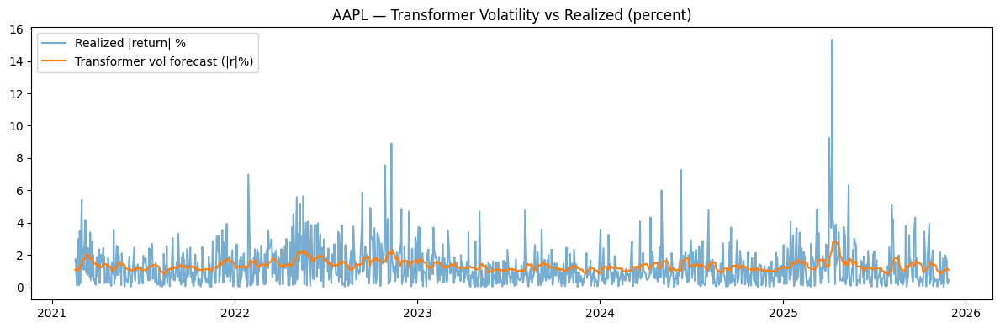

MSFT: Transformer volatility RMSE (|return|%): 1.160297


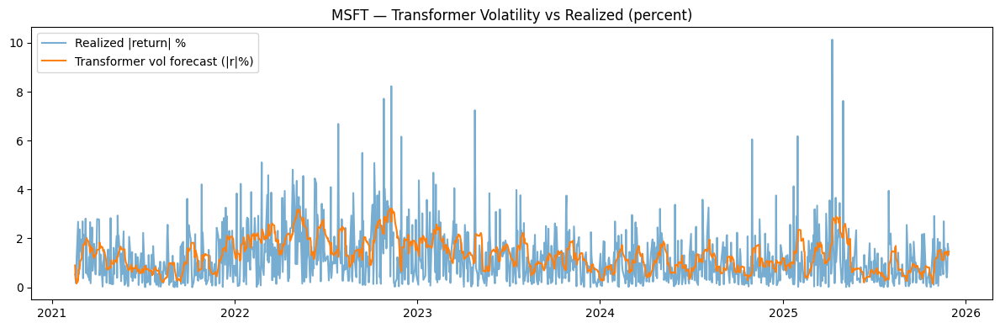

NVDA: Transformer volatility RMSE (|return|%): 2.249229


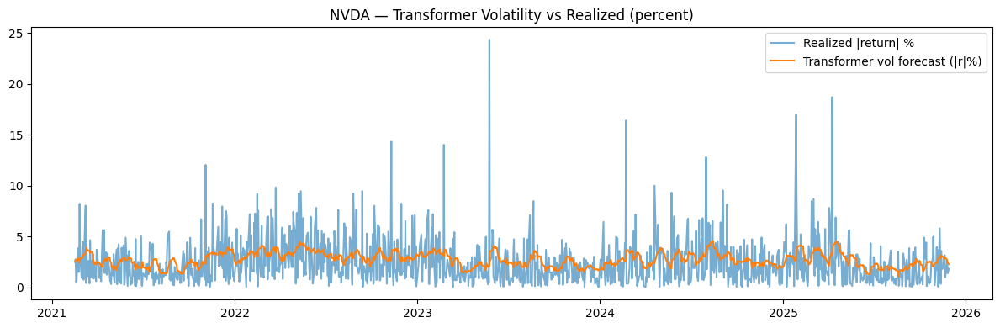

EBAY: Transformer volatility RMSE (|return|%): 1.492302


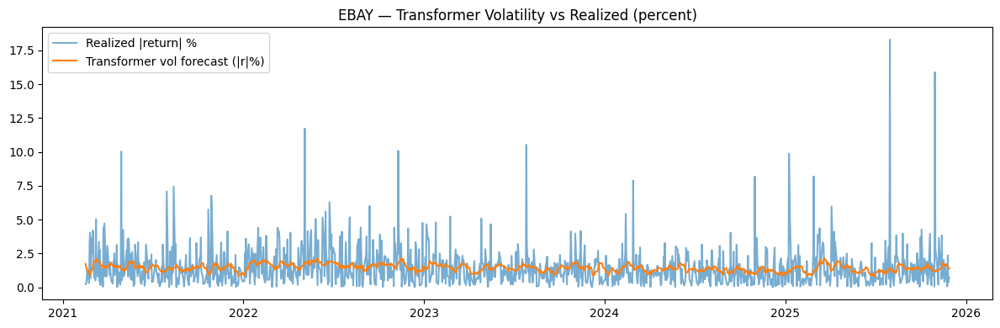

MCD: Transformer volatility RMSE (|return|%): 0.802864


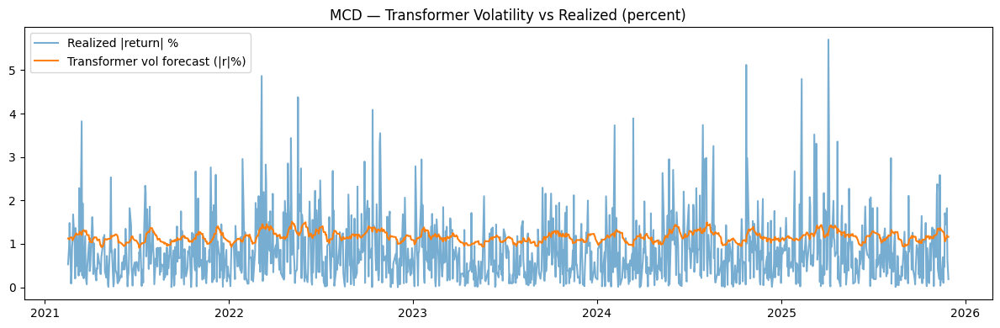

SBUX: Transformer volatility RMSE (|return|%): 1.483724


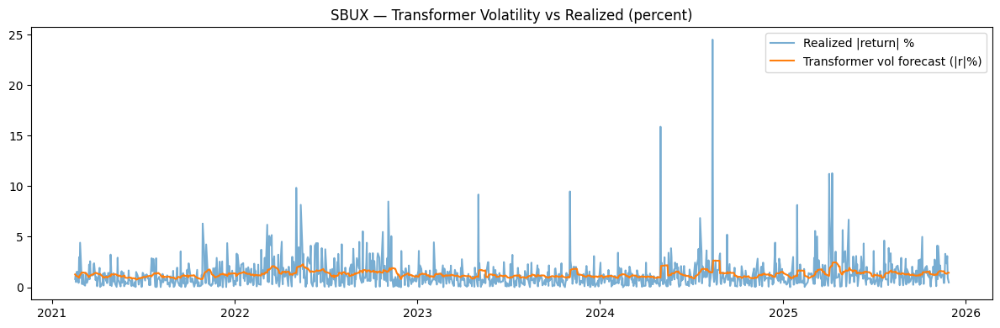


Transformer volatility RMSE (percent units):
AAPL   1.201329
EBAY   1.492302
MCD    0.802864
MSFT   1.160297
NVDA   2.249229
SBUX   1.483724
dtype: float64


In [ ]:
#Get Transformer volatility predictions and compute RMSE (percent units)
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

tform_vol_pred = {}   # ticker -> predicted |r|% (percent)
tform_vol_true = {}
tform_vol_rmse = {}

for t in tickers:
    if t not in tform_vol_models:
        continue

    model  = tform_vol_models[t]
    X_te   = Xte_vol[t]
    Y_te   = Yte_vol[t]
    scaler = scalers_vol[t]
    idx    = idx_tests_vol[t]

    # Predict (scaled) -> inverse-transform to percent
    yhat_sc = model.predict(X_te, verbose=0)
    yhat    = scaler.inverse_transform(yhat_sc)
    ytrue   = scaler.inverse_transform(Y_te)

    m = min(len(ytrue), len(yhat), len(idx))
    yhat  = yhat[:m]
    ytrue = ytrue[:m]
    idx_m = idx[:m]

    tform_vol_pred[t]  = yhat
    tform_vol_true[t]  = ytrue

    rmse = float(np.sqrt(mean_squared_error(ytrue, yhat)))
    tform_vol_rmse[t] = rmse

    print(f"{t}: Transformer volatility RMSE (|return|%): {rmse:.6f}")

    # quick plot
    plt.figure(figsize=(12,4))
    plt.plot(idx_m, ytrue, label='Realized |return| %', alpha=0.6)
    plt.plot(idx_m, yhat,  label='Transformer vol forecast (|r|%)', linewidth=1.5)
    plt.title(f"{t} — Transformer Volatility vs Realized (percent)")
    plt.legend(); plt.tight_layout(); plt.show()

print("\nTransformer volatility RMSE (percent units):")
print(pd.Series(tform_vol_rmse).sort_index().round(6))


In [ ]:
comp = pd.DataFrame(rows).set_index("Ticker").sort_index()


In [ ]:
from sklearn.metrics import mean_squared_error

rows = []

for t in tickers:
    # --- Realized volatility (|r|%) ---
    if t not in realized_all:
        continue
    y_true = realized_all[t].values

    # --- Best GARCH RMSE per ticker ---
    best_name, best_rmse = None, np.inf
    if t in fcasts_all:
        for name, arr in fcasts_all[t].items():
            arr = np.asarray(arr)
            m = min(len(y_true), len(arr))
            if m == 0:
                continue
            rmse = float(np.sqrt(mean_squared_error(y_true[:m], arr[:m])))
            if rmse < best_rmse:
                best_name, best_rmse = name, rmse

    # --- Baseline (RollingStd30) ---
    base = np.asarray(baseline_all.get(t, []))
    if len(base) > 0:
        m2 = min(len(y_true), len(base))
        rmse_base = float(np.sqrt(mean_squared_error(y_true[:m2], base[:m2])))
    else:
        rmse_base = np.nan

    # --- LSTM volatility RMSE ---
    rmse_lstm = float(lstm_vol_rmse.get(t, np.nan))

    # --- Transformer volatility RMSE ---
    rmse_tform = float(tform_vol_rmse.get(t, np.nan))

    rows.append({
        "Ticker": t,
        "Best_GARCH_Name": best_name,
        "Best_GARCH_RMSE": best_rmse,
        "LSTM_vol_RMSE": rmse_lstm,
        "Transformer_vol_RMSE": rmse_tform,
        "RollingStd30_RMSE": rmse_base
    })

comp = pd.DataFrame(rows).set_index("Ticker").sort_index()

print("\nVolatility RMSE comparison (percent units) — with Transformer:")
print(comp[[
    "Best_GARCH_RMSE",
    "LSTM_vol_RMSE",
    "Transformer_vol_RMSE",
    "RollingStd30_RMSE"
]].round(6))



Volatility RMSE comparison (percent units) — with Transformer:
        Best_GARCH_RMSE  LSTM_vol_RMSE  Transformer_vol_RMSE  \
Ticker                                                         
AAPL           1.318974       1.202188              1.201329   
EBAY           1.607905       1.486530              1.492302   
MCD            0.787806       0.721864              0.802864   
MSFT           1.178616       1.094611              1.160297   
NVDA           2.395436       2.242446              2.249229   
SBUX           1.641710       1.490109              1.483724   

        RollingStd30_RMSE  
Ticker                     
AAPL             1.306511  
EBAY             1.646612  
MCD              0.773438  
MSFT             1.170060  
NVDA             2.376768  
SBUX             1.678181  


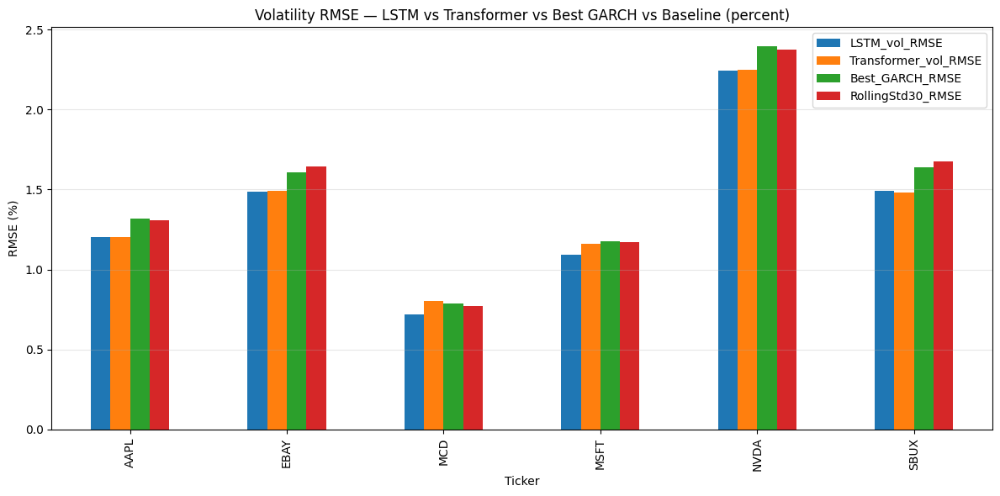

In [ ]:
ax = comp[[
    "LSTM_vol_RMSE",
    "Transformer_vol_RMSE",
    "Best_GARCH_RMSE",
    "RollingStd30_RMSE"
]].plot(kind="bar", figsize=(12,6))

ax.set_title("Volatility RMSE — LSTM vs Transformer vs Best GARCH vs Baseline (percent)")
ax.set_xlabel("Ticker")
ax.set_ylabel("RMSE (%)")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

def align_four(idx_lstm, yhat_lstm,
               idx_tf,   yhat_tf,
               idx_garch, yhat_garch,
               y_true_series):
    """
    Align LSTM, Transformer, GARCH forecasts and true |returns|
    on a common date index and return numpy arrays.
    """
    df = (
        pd.DataFrame({"lstm": np.asarray(yhat_lstm).ravel()}, index=idx_lstm)
        .join(
            pd.DataFrame({"trans": np.asarray(yhat_tf).ravel()}, index=idx_tf),
            how="inner"
        )
        .join(
            pd.DataFrame({"garch": np.asarray(yhat_garch).ravel()}, index=idx_garch),
            how="inner"
        )
        .join(
            y_true_series.rename("y_true"),
            how="inner"
        )
        .dropna()
    )

    dates = df.index
    y_true = df["y_true"].values.reshape(-1, 1)
    x_lstm = df["lstm"].values.reshape(-1, 1)
    x_tf   = df["trans"].values.reshape(-1, 1)
    x_g    = df["garch"].values.reshape(-1, 1)

    return dates, y_true, x_lstm, x_tf, x_g


In [ ]:
triple_weights_results = {}

for t in tickers:
    # need all three forecasts & realized volatility
    if t not in lstm_vol_pred:
        print(f"{t}: no LSTM-vol — skipping");
        continue
    if t not in tform_vol_pred:
        print(f"{t}: no Transformer-vol — skipping");
        continue
    if t not in fcasts_all or garch_name not in fcasts_all[t]:
        print(f"{t}: no {garch_name} for GARCH — skipping");
        continue
    if t not in realized_all:
        print(f"{t}: no realized_all — skipping");
        continue

    idx_lstm   = idx_tests_vol[t]
    yhat_lstm  = lstm_vol_pred[t]
    idx_tf     = idx_tests_vol[t]           # same index for Transformer
    yhat_tf    = tform_vol_pred[t]
    idx_garch  = test_idx_all[t]
    yhat_garch = fcasts_all[t][garch_name]
    y_true_ser = realized_all[t]

    dates, y_true, x_lstm, x_tf, x_g = align_four(
        idx_lstm, yhat_lstm,
        idx_tf,   yhat_tf,
        idx_garch, yhat_garch,
        y_true_ser
    )

    m = len(dates)
    if m < 60:
        print(f"{t}: too few aligned points ({m}) — skipping")
        continue

    # --- Train/test split on test window (no leakage) ---
    k = max(10, int(0.30 * m))

    X_fit = np.hstack([x_lstm[:k], x_tf[:k], x_g[:k]])   # [LSTM, TF, GARCH]
    y_fit = y_true[:k].ravel()

    X_ev  = np.hstack([x_lstm[k:], x_tf[k:], x_g[k:]])
    y_ev  = y_true[k:].ravel()

    # --- Non-negative linear regression (no intercept) ---
    reg = LinearRegression(positive=True, fit_intercept=False)
    reg.fit(X_fit, y_fit)

    coefs = reg.coef_.astype(float)   # [w_LSTM_raw, w_TF_raw, w_GARCH_raw]
    s = coefs.sum() if coefs.sum() > 0 else 1.0
    w = coefs / s                     # convex weights that sum to 1

    w_lstm, w_tf, w_g = w.tolist()

    # --- Hybrid predictions (convex combination) ---
    yhat_h = (w_lstm * X_ev[:, 0] +
              w_tf   * X_ev[:, 1] +
              w_g    * X_ev[:, 2])

    # --- Component RMSEs on eval slice ---
    rmse_l = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 0])))
    rmse_t = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 1])))
    rmse_g = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 2])))
    rmse_h = float(np.sqrt(mean_squared_error(y_ev, yhat_h)))

    triple_weights_results[t] = {
        "weights_[LSTM,TF,GARCH]": w.tolist(),
        "rmse_eval_lstm": rmse_l,
        "rmse_eval_tf":   rmse_t,
        "rmse_eval_garch": rmse_g,
        "rmse_eval_hybrid": rmse_h,
        "n_eval": len(y_ev)
    }

    print(
        f"{t}: weights(convex) = [LSTM={w_lstm:.3f}, TF={w_tf:.3f}, GARCH={w_g:.3f}] | "
        f"RMSE — LSTM {rmse_l:.4f}, TF {rmse_t:.4f}, GARCH {rmse_g:.4f}, HYBRID {rmse_h:.4f}"
    )


AAPL: weights(convex) = [LSTM=0.000, TF=0.611, GARCH=0.389] | RMSE — LSTM 1.2294, TF 1.2393, GARCH 1.3710, HYBRID 1.2645
MSFT: weights(convex) = [LSTM=0.000, TF=0.283, GARCH=0.717] | RMSE — LSTM 1.1206, TF 1.1944, GARCH 1.2185, HYBRID 1.1939
NVDA: weights(convex) = [LSTM=0.089, TF=0.000, GARCH=0.911] | RMSE — LSTM 2.2880, TF 2.3041, GARCH 2.4861, HYBRID 2.4393
EBAY: weights(convex) = [LSTM=0.166, TF=0.000, GARCH=0.834] | RMSE — LSTM 1.4603, TF 1.4714, GARCH 1.6170, HYBRID 1.5660
MCD: weights(convex) = [LSTM=0.000, TF=0.376, GARCH=0.624] | RMSE — LSTM 0.7250, TF 0.8075, GARCH 0.7924, HYBRID 0.7952
SBUX: weights(convex) = [LSTM=0.556, TF=0.000, GARCH=0.444] | RMSE — LSTM 1.5835, TF 1.5759, GARCH 1.7574, HYBRID 1.6083


In [ ]:
# RMSE table
rows = []
w_rows = []

for t, d in triple_weights_results.items():
    rows.append({
        "Ticker": t,
        "LSTM":   d["rmse_eval_lstm"],
        "TF":     d["rmse_eval_tf"],
        "GARCH":  d["rmse_eval_garch"],
        "Hybrid": d["rmse_eval_hybrid"],
    })
    wL, wT, wG = d["weights_[LSTM,TF,GARCH]"]
    w_rows.append({
        "Ticker": t,
        "w_LSTM": wL,
        "w_TF":   wT,
        "w_GARCH": wG
    })

df_rmse = pd.DataFrame(rows).set_index("Ticker").sort_index()
df_wts  = pd.DataFrame(w_rows).set_index("Ticker").sort_index()

print("\nTriple-Hybrid RMSE (percent units):")
print(df_rmse.round(6))

print("\nConvex Weights [LSTM, TF, GARCH]:")
print(df_wts.round(3))



Triple-Hybrid RMSE (percent units):
           LSTM       TF    GARCH   Hybrid
Ticker                                    
AAPL   1.229432 1.239282 1.371017 1.264532
EBAY   1.460285 1.471417 1.616964 1.566021
MCD    0.725024 0.807505 0.792420 0.795249
MSFT   1.120551 1.194427 1.218502 1.193906
NVDA   2.287969 2.304113 2.486097 2.439321
SBUX   1.583467 1.575919 1.757423 1.608325

Convex Weights [LSTM, TF, GARCH]:
         w_LSTM     w_TF  w_GARCH
Ticker                           
AAPL   0.000000 0.611000 0.389000
EBAY   0.166000 0.000000 0.834000
MCD    0.000000 0.376000 0.624000
MSFT   0.000000 0.283000 0.717000
NVDA   0.089000 0.000000 0.911000
SBUX   0.556000 0.000000 0.444000


<Figure size 1000x500 with 0 Axes>

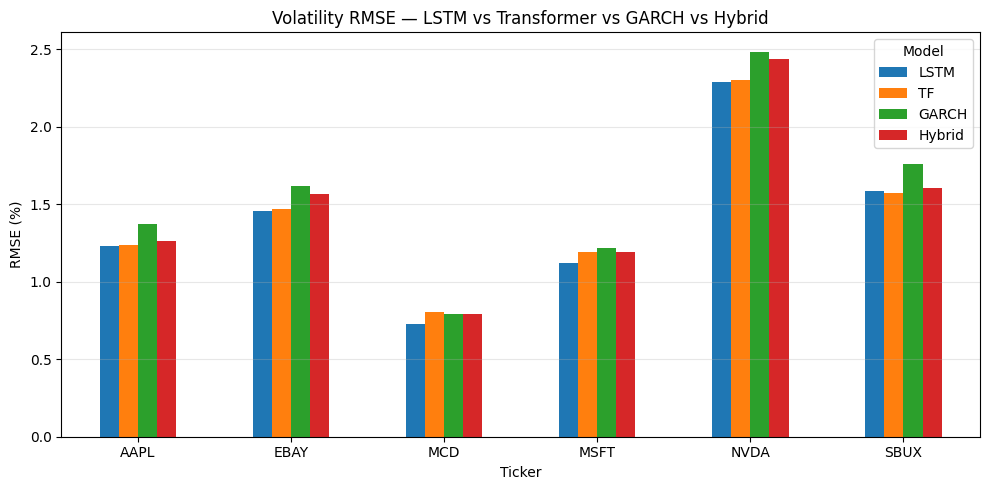

<Figure size 1000x500 with 0 Axes>

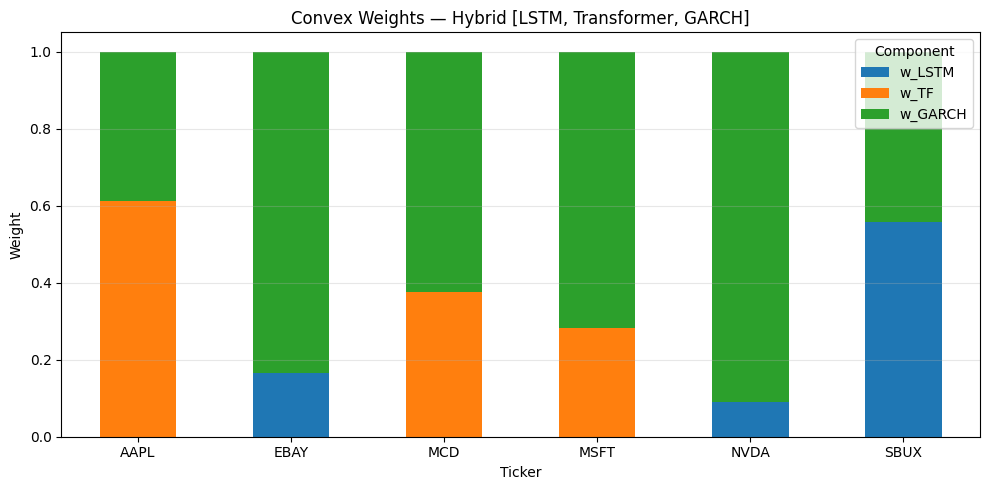

In [ ]:
# RMSE grouped bar
plt.figure(figsize=(10,5))
df_rmse.plot(kind="bar", figsize=(10,5))
plt.title("Volatility RMSE — LSTM vs Transformer vs GARCH vs Hybrid")
plt.ylabel("RMSE (%)"); plt.xlabel("Ticker")
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model")
plt.tight_layout()
plt.show()

# Weights stacked bar
plt.figure(figsize=(10,5))
df_wts.plot(kind="bar", stacked=True, figsize=(10,5))
plt.title("Convex Weights — Hybrid [LSTM, Transformer, GARCH]")
plt.ylabel("Weight"); plt.xlabel("Ticker")
plt.ylim(0, 1.05)
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Component")
plt.tight_layout()
plt.show()
